 # <center>SN2025gvs</center>

 <center> Zisen Dai dzs23@mails.tsinghua.edu.cn </center>


This document presents the code and report detailing the processing of observational spectral data of SN2025gvs. As a confirmed Type II supernova, we measured its redshift using only H emission lines and compared it to the accepted redshift of 0.007165 (https://www.wis-tns.org/object/2025gvs).

## Importing Required Libraries and Data Loading

#### Import necessary libraries

In [43]:
import os
import numpy as np
from astropy.io import fits
from astropy.stats import sigma_clip
from scipy.optimize import curve_fit
from scipy.signal import find_peaks

import specutils

%matplotlib inline
import matplotlib.pylab as plt

#### General Function for Reading Spectral Data

In [44]:
def read_spec_data(filename):
    data = np.loadtxt(filename)
    wav = data[:, 0]
    flux = data[:, 1]
    return wav, flux

#### Import observation data for April 7, April 24, and May 19.

In [45]:
wav_0407, flux_0407 = read_spec_data('./SN2025gvs_bfosc_20250407.txt')
wav_0424, flux_0424 = read_spec_data('./SN2025gvs_bfosc_20250424.txt')
wav_0519, flux_0519 = read_spec_data('./SN2025gvs_bfosc_20250519.txt')

## Raw Spectrum Plotting

First, we will write a standardized plotting function.

In [46]:
def SED_draw(wav, flux, title):
    # 绘制SED图像

    # 设置科学论文风格
    plt.style.use('seaborn-v0_8-paper')
    plt.rcParams.update({
        'font.family': 'serif',
        'font.serif': ['Times New Roman', 'DejaVu Serif'],
        'font.size': 11,
        'axes.linewidth': 1.2,
        'axes.edgecolor': 'black',
        'axes.labelsize': 12,
        'axes.labelweight': 'normal',
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 10,
        'figure.dpi': 300,
        'savefig.dpi': 300,
        'xtick.major.width': 1.0,
        'ytick.major.width': 1.0,
        'xtick.minor.width': 0.5,
        'ytick.minor.width': 0.5,
        'mathtext.fontset': 'cm'
    })

    # 创建图形（使用类似SNID的尺寸比例）
    fig, ax = plt.subplots(figsize=(8, 6))

    # 绘制数据
    ax.plot(wav, flux, 'k-', linewidth=0.8, color='#1f77b4',
        label=title, zorder=10)

    # 设置坐标轴标签
    ax.set_xlabel(r'Wavelength ($\mathrm{\AA}$)', fontsize=12)
    ax.set_ylabel(r'Flux ($\mathrm{erg\,cm^{-2}\,s^{-1}\,\AA^{-1}}$)', fontsize=12)

    # 四边框架
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.2)

    # 刻度设置
    ax.tick_params(direction='in', top=True, right=True, 
                labelsize=10, length=5, width=1.0)
    ax.minorticks_on()
    ax.tick_params(which='minor', direction='in', top=True, right=True,
                length=3, width=0.5)

    # 网格设置
    ax.grid(True, which='major', alpha=0.3, linestyle='-', linewidth=0.5, zorder=0)
    ax.grid(True, which='minor', alpha=0.15, linestyle=':', linewidth=0.3, zorder=0)

    # 动态Y轴范围（借鉴SNID的方法）
    ymin = np.min(flux)
    ymax = np.max(flux)
    yrange = ymax - ymin
    ax.set_ylim(ymin - yrange * 0.05, ymax + yrange * 0.15)  # 底部5%，顶部15%空白

    # 图例（放在最佳位置）
    legend = ax.legend(frameon=True, fancybox=False, edgecolor='black',
                    fontsize=10, loc='best', framealpha=1.0,
                    borderpad=0.5, labelspacing=0.5)
    legend.get_frame().set_linewidth(0.8)

    # 添加标题（可选，包含文件信息）
    # ax.set_title('SN2025kid Spectrum', fontsize=14, pad=10)

    # 优化布局
    plt.tight_layout(pad=0.5)

    # 保存图形（使用类似SNID的命名方式）
    #output_filename = 'spectrum_SN2025kid.png'  # 或 .pdf
    #plt.savefig(output_filename, bbox_inches='tight', dpi=300)
    #print(f'Figure saved as: {output_filename}')

    # 不自动显示，保持figure对象活跃以便后续修改
    # plt.show()

Then we plot the spectrum without any data processing, which will be filled with noise.

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\4015663006.py:30: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  ax.plot(wav, flux, 'k-', linewidth=0.8, color='#1f77b4',
C:\Users\19938\AppData\Local\Temp\ipykernel_45420\4015663006.py:30: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  ax.plot(wav, flux, 'k-', linewidth=0.8, color='#1f77b4',
C:\Users\19938\AppData\Local\Temp\ipykernel_45420\4015663006.py:30: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  ax.plot(wav, flux, 'k-', linewidth=0.8, color='#1f77b4',


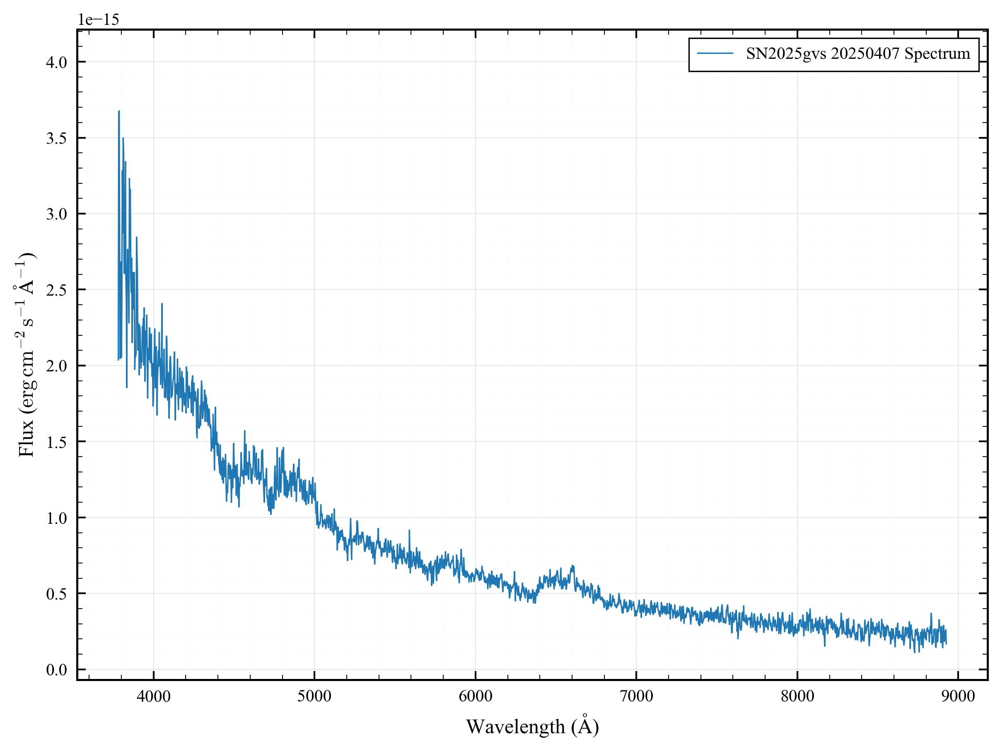

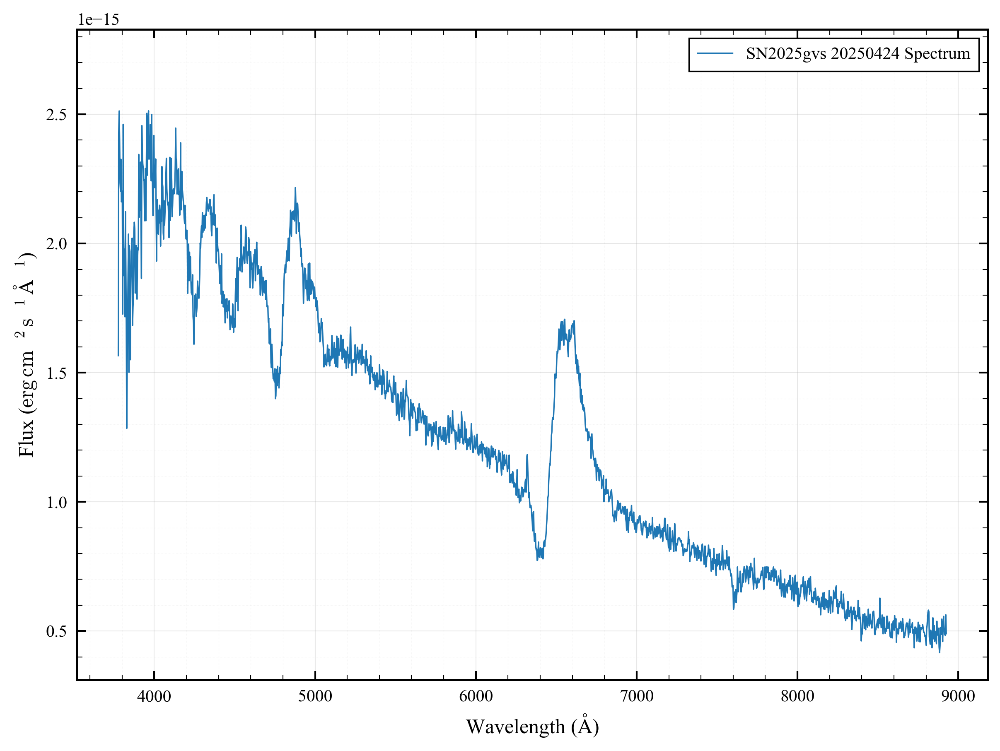

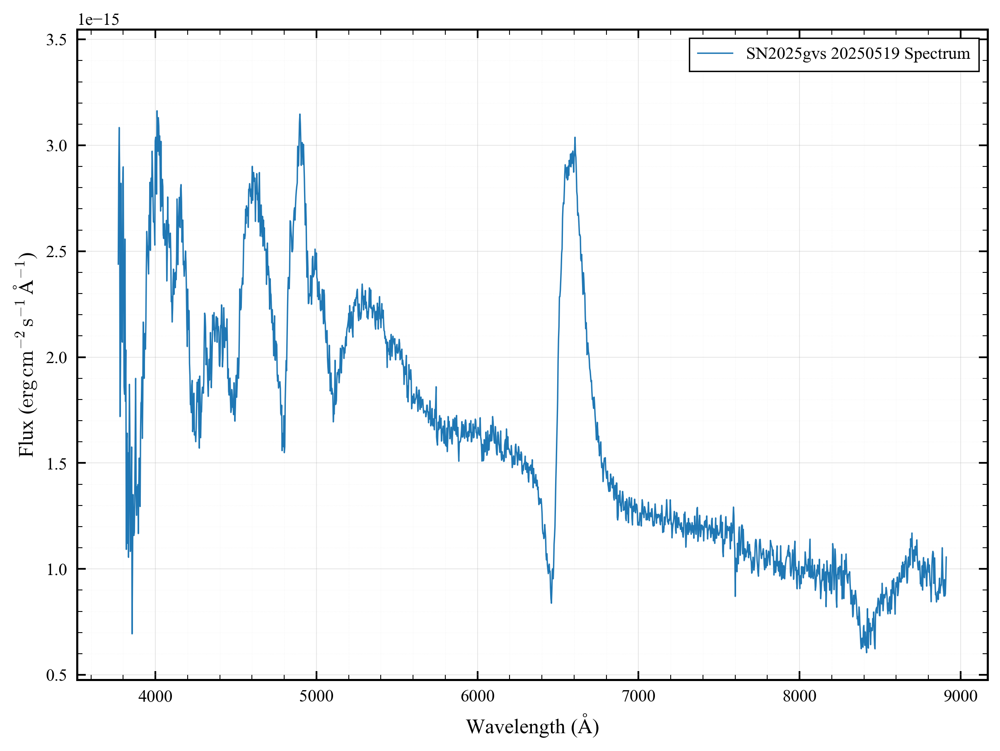

In [47]:
SED_draw(wav_0407, flux_0407, 'SN2025gvs 20250407 Spectrum')
SED_draw(wav_0424, flux_0424, 'SN2025gvs 20250424 Spectrum')
SED_draw(wav_0519, flux_0519, 'SN2025gvs 20250519 Spectrum')

## Spectral Evolution Analysis via Row Image

#### Early Stage — 2025-04-07  
- **Continuum**: Dominated by a hot, blue black-body; steep flux drop toward longer wavelengths.  
- **Lines**: Only very broad, shallow absorptions visible; no prominent features yet, consistent with the shock-breakout cooling phase.

#### Intermediate Stage — 2025-04-24  
- **Continuum**: Noticeably redder, implying a lower photospheric temperature.  
- **P-Cygni Profiles** begin to stand out  
  - Hβ (4861 Å), Hγ and Ca II H&K show clear absorption troughs.  
  - Hα (6563 Å) exhibits a strong emission peak with blueshifted absorption.  
- **Kinematics**: Absorption minima shift to longer wavelengths relative to the early spectrum, revealing a decelerating ejecta.

#### Late Stage — 2025-05-19  
- **Hα**: Emission peak grows higher and narrower; absorption component weakens—emission now dominates.  
- **Metal Lines**: Fe II multiplet near 5000 Å strengthens markedly, pointing to further cooling.  
- **Continuum**: UV–blue flux continues to fade while the red/NIR remains comparatively steady—characteristic of the onset of the plateau phase.  
- **Kinematics**: Hα absorption minimum drifts closer to its rest wavelength, showing continued deceleration of the outer layers.

## Spectral Data Processing

#### Processing Program

The previous modified spectral data program is processing these three spectra with the following primary optimizations:
1.  Partition Strategy Redesign: Minimal smoothing for Ca II H&K core (3900–4020 Å, σ=0.8) and Hα core (6400–6750 Å, σ=0.6) regions; added protection for the Fe II complex (4400–5300 Å).
2.  Intelligent Feature Detection: Uses smaller windows and more conservative outlier detection near important spectral lines, and optimizes width features for P-Cygni profiles.
3.  Dynamic Parameter Adjustment: Adapts processing intensity based on spectral evolutionary phase and applies gradient transitions in boundary regions to ensure continuity.
4.  Enhanced Feature Protection: Provides dedicated protection for eight key Type II supernova wavelengths and special handling for Hα emission (which may exceed continuum level).

In [48]:
from scipy.interpolate import UnivariateSpline
from scipy import interpolate
from scipy.ndimage import median_filter, gaussian_filter1d

class TypeIISupernova_SpectroscopyProcessor:
    """
    专门针对Type II超新星光谱的处理器
    基于SN 2025gvs光谱特征优化
    """
    
    def __init__(self, wavelength, flux, verbose=True): 
        self.wav_raw = np.array(wavelength)
        self.flux_raw = np.array(flux)
        self.wav = None
        self.flux = None
        self.mask = np.ones(len(wavelength), dtype=bool)
        self.verbose = verbose
        self.processing_log = []
        self.processing_regions = []
        
    def _log(self, message):
        """记录处理步骤"""
        if self.verbose:
            print(message)
        self.processing_log.append(message)
    
    def get_processed_data(self):
        """获取处理后的数据"""
        if self.wav is None:
            self.wav = self.wav_raw[self.mask]
            self.flux = self.flux_raw[self.mask]
        return self.wav, self.flux
    
    def get_statistics(self):
        """获取数据统计信息"""
        if self.wav is None:
            self.get_processed_data()
            
        stats = {
            'original_points': len(self.wav_raw),
            'processed_points': len(self.wav),
            'removed_points': len(self.wav_raw) - len(self.wav),
            'removal_rate': (1 - len(self.wav)/len(self.wav_raw)) * 100,
            'wavelength_range': (self.wav.min(), self.wav.max()),
            'flux_range': (self.flux.min(), self.flux.max()),
            'mean_flux': np.mean(self.flux),
            'median_flux': np.median(self.flux),
            'std_flux': np.std(self.flux)
        }
        return stats
    
    def basic_cleaning(self):
        """基础数据清洗"""
        initial_count = np.sum(self.mask)
        
        # 去除无效数值
        self.mask &= np.isfinite(self.flux_raw) & np.isfinite(self.wav_raw)
        self.mask &= (self.flux_raw > 0)

        removed = initial_count - np.sum(self.mask)
        self._log(f"Basic cleaning: removed {removed} invalid points")
        return self
    
    def wavelength_cut(self, wmin=3600, wmax=9200): 
        """波长范围截取"""
        initial_count = np.sum(self.mask)
        self.mask &= (self.wav_raw >= wmin) & (self.wav_raw <= wmax)
                
        removed = initial_count - np.sum(self.mask)
        self._log(f"Wavelength cut [{wmin}-{wmax}Å]: removed {removed} points")
        return self
    
    def detect_noise_level(self, window_size=50):
        """检测局部噪声水平，用于自适应处理"""
        flux_temp = self.flux_raw[self.mask]
        wav_temp = self.wav_raw[self.mask]
        
        noise_levels = []
        wav_centers = []
        
        for i in range(0, len(flux_temp) - window_size, window_size//2):
            window_flux = flux_temp[i:i+window_size]
            window_wav = wav_temp[i:i+window_size]
            
            # 使用差分估计噪声
            noise = np.std(np.diff(window_flux))
            noise_levels.append(noise)
            wav_centers.append(np.mean(window_wav))
        
        self.noise_profile = (np.array(wav_centers), np.array(noise_levels))
        return self
    
    def smart_outlier_removal(self, global_threshold=3.5, local_window=25):
        """
        智能离群点去除 - 针对超新星光谱优化
        """
        flux_temp = self.flux_raw[self.mask]
        wav_temp = self.wav_raw[self.mask]
        
        if len(flux_temp) < 10:
            return self
        
        # 全局离群点检测（更保守）
        flux_median = median_filter(flux_temp, size=15)
        residuals = flux_temp - flux_median
        mad = np.median(np.abs(residuals - np.median(residuals)))
        std_robust = 1.4826 * mad
        
        outlier_mask = np.abs(residuals) < global_threshold * std_robust
        
        # 局部离群点检测（根据波长区域调整）
        for i in range(len(flux_temp)):
            if not outlier_mask[i]:
                continue
                
            # 根据重要光谱线调整窗口
            current_wav = wav_temp[i]
            
            # 重要线附近使用更小窗口，更保守
            important_lines = [3934, 3968, 4101, 4340, 4861, 6563]
            near_line = any(abs(current_wav - line) < 30 for line in important_lines)
            
            if near_line:
                window = local_window // 2  # 重要线附近更保守
                threshold = 3.0
            elif current_wav < 4000:  # 蓝端噪声大
                window = local_window
                threshold = 2.0
            else:
                window = local_window
                threshold = 2.5
            
            start = max(0, i - window//2)
            end = min(len(flux_temp), i + window//2)
            
            if end - start >= 5:
                local_flux = flux_temp[start:end]
                local_median = np.median(local_flux)
                local_std = np.std(local_flux)
                
                if local_std > 0 and np.abs(flux_temp[i] - local_median) > threshold * local_std:
                    outlier_mask[i] = False
        
        # 应用掩码
        temp_mask = self.mask.copy()
        temp_mask[self.mask] &= outlier_mask
        removed = np.sum(self.mask) - np.sum(temp_mask)
        self.mask = temp_mask
        
        self._log(f"Smart outlier removal: removed {removed} points")
        return self
    
    def adaptive_smoothing_typeII(self):
        """
        专为Type II超新星优化的自适应分区平滑
        基于SN 2025gvs光谱特征制定
        """
        if self.wav is None:
            self.wav = self.wav_raw[self.mask]
            self.flux = self.flux_raw[self.mask]
        
        flux_processed = self.flux.copy()
        
        # 针对Type II超新星的分区策略
        self.processing_regions = [
            # (起始, 结束, 中值窗口, 高斯sigma, 描述)
            (3600, 3900, 11, 3.5, 'Far UV (heavy noise)'),
            # 远紫外：噪声极大，需要重度平滑
            
            (3900, 4020, 3, 0.8, 'Ca II H&K core (critical)'),
            # Ca II H&K核心：3934, 3968Å，关键吸收特征，最小平滑
            
            (4020, 4400, 5, 1.2, 'Balmer region (Hγ protection)'),
            # Balmer线区域：包含Hγ (4340Å)，需要保护
            
            (4400, 5300, 5, 1.5, 'Fe II complex region'),
            # Fe II复合体：4924, 5018, 5169Å等，晚期重要特征
            
            (5300, 6400, 7, 2.0, 'Clean continuum'),
            # 干净连续谱：相对少特征，可以标准平滑
            
            (6400, 6750, 3, 0.6, 'Hα core (emission critical)'),
            # Hα核心：6563Å，最重要的发射线，最小平滑
            
            (6750, 9200, 5, 1.8, 'Red continuum (high S/N)')
            # 红端连续谱：信噪比高，轻度平滑
        ]
        
        # 分区处理
        for start, end, med_window, gauss_sigma, description in self.processing_regions:
            mask = (self.wav >= start) & (self.wav < end)
            
            if not np.any(mask):
                continue
            
            # 检查是否有足够的数据点
            n_points = np.sum(mask)
            if n_points < 5:
                continue
            
            # 调整窗口大小以适应数据点数
            actual_med_window = min(med_window, n_points//2)
            if actual_med_window % 2 == 0:
                actual_med_window += 1  # 确保奇数
            
            if actual_med_window >= 3:
                # 中值滤波去除尖峰
                flux_processed[mask] = median_filter(flux_processed[mask], 
                                                   size=actual_med_window)
            
            # 高斯平滑
            flux_processed[mask] = gaussian_filter1d(flux_processed[mask], 
                                                   sigma=gauss_sigma)
            
            self._log(f"Processed {description}: {start}-{end}Å ({n_points} points)")
        
        # 智能边界平滑 - 确保区域间连续性
        boundary_positions = [3900, 4020, 4400, 5300, 6400, 6750]
        boundary_width = 15  # 减小边界宽度，更精确
        
        for boundary in boundary_positions:
            mask = (self.wav > boundary - boundary_width) & \
                   (self.wav < boundary + boundary_width)
            if np.any(mask):
                # 轻微边界平滑
                flux_processed[mask] = gaussian_filter1d(flux_processed[mask], sigma=0.8)
        
        self.flux = flux_processed
        self._log("Applied Type II supernova optimized smoothing")
        return self
    
    def supernova_feature_enhancement(self):
        """
        超新星特征增强 - 专门保护Type II特征
        """
        # Type II超新星关键波长
        feature_wavelengths = [
            3934,  # Ca II K
            3968,  # Ca II H  
            4101,  # H delta
            4340,  # H gamma
            4861,  # H beta
            5018,  # Fe II
            5169,  # Fe II
            6563   # H alpha
        ]
        
        flux_enhanced = self.flux.copy()
        enhanced_features = []
        
        for feature_wav in feature_wavelengths:
            # 检查特征是否在范围内
            if feature_wav < self.wav.min() or feature_wav > self.wav.max():
                continue
            
            # 找到最近的索引
            idx = np.argmin(np.abs(self.wav - feature_wav))
            
            # 根据线的重要性调整窗口
            if feature_wav in [6563]:  # Hα最重要
                window = 25
                enhancement_strength = 0.3
            elif feature_wav in [4861, 4340]:  # Hβ, Hγ很重要
                window = 20
                enhancement_strength = 0.25
            elif feature_wav in [3934, 3968]:  # Ca II线重要
                window = 15
                enhancement_strength = 0.2
            else:  # Fe II线
                window = 15
                enhancement_strength = 0.15
            
            start_idx = max(0, idx - window//2)
            end_idx = min(len(self.flux), idx + window//2)
            
            if end_idx - start_idx < 5:
                continue
            
            # 计算局部连续谱（避开中心）
            wing_size = 3
            continuum_indices = list(range(start_idx, start_idx + wing_size)) + \
                               list(range(end_idx - wing_size, end_idx))
            
            if len(continuum_indices) > 0:
                continuum_level = np.mean(self.flux[continuum_indices])
                
                # 检查是否为真正的吸收/发射特征
                central_flux = self.flux[idx]
                
                # 对于Hα，可能是发射线（高于连续谱）
                if feature_wav == 6563:
                    is_feature = abs(central_flux - continuum_level) > continuum_level * 0.05
                else:
                    # 其他主要是吸收线（低于连续谱）
                    is_feature = central_flux < continuum_level * 0.95
                
                if is_feature:
                    # 获取原始特征
                    original_feature = self.flux_raw[self.mask][start_idx:end_idx]
                    smoothed_feature = self.flux[start_idx:end_idx]
                    
                    # 高斯权重函数
                    center_pos = idx - start_idx
                    positions = np.arange(end_idx - start_idx)
                    weights = np.exp(-0.5 * ((positions - center_pos)**2 / (window/6)**2))
                    weights /= weights.max()
                    
                    # 混合原始和平滑数据
                    flux_enhanced[start_idx:end_idx] = \
                        enhancement_strength * weights * original_feature + \
                        (1 - enhancement_strength * weights) * smoothed_feature
                    
                    enhanced_features.append(f"{feature_wav:.0f}Å")
        
        self.flux = flux_enhanced
        self._log(f"Enhanced features: {', '.join(enhanced_features)}")
        return self
    
    def final_polish(self, sigma=0.4):
        """最终抛光 - 超轻度全局平滑"""
        self.flux = gaussian_filter1d(self.flux, sigma=sigma)
        self._log(f"Applied final polish (sigma={sigma})")
        return self

def process_typeII_supernova_spectrum(wav, flux, 
                                    enhance_features=True,
                                    diagnostic=True):
    """
    Type II超新星光谱处理主函数
    专门针对SN 2025gvs类型优化
    """
    processor = TypeIISupernova_SpectroscopyProcessor(wav, flux)
    
    # 处理流程
    processor.basic_cleaning()\
             .wavelength_cut(3600, 9200)\
             .detect_noise_level()\
             .smart_outlier_removal(global_threshold=3.5, local_window=25)
    
    # 获取清洗后的数据
    processor.wav = processor.wav_raw[processor.mask]
    processor.flux = processor.flux_raw[processor.mask]
    
    # Type II超新星专用平滑
    processor.adaptive_smoothing_typeII()
    
    # 特征增强
    if enhance_features:
        processor.supernova_feature_enhancement()
    
    # 最终抛光
    processor.final_polish(sigma=0.3)
    
    # 获取结果
    wav_clean, flux_clean = processor.get_processed_data()
    
    if diagnostic:
        fig = plot_typeII_diagnostic(wav, flux, wav_clean, flux_clean, processor)
    
    return wav_clean, flux_clean, processor

def create_typeII_diagnostic_figures(wav_raw, flux_raw, wav_clean, flux_clean, processor):
    """
    创建多个独立的Type II超新星光谱诊断图
    返回图形对象列表，便于单独显示或保存
    """
    figures = {}
    
    # 1. 全光谱对比图
    fig1 = plt.figure(figsize=(14, 8))
    ax1 = fig1.add_subplot(111)
    
    ax1.plot(wav_raw, flux_raw, 'k-', alpha=0.4, linewidth=0.8, label='Original Spectrum')
    ax1.plot(wav_clean, flux_clean, 'b-', linewidth=2, label='Processed Spectrum')
    
    # 标记重要特征线
    important_lines = {3934: 'Ca II K', 3968: 'Ca II H', 4340: 'Hγ', 
                      4861: 'Hβ', 6563: 'Hα'}
    y_bottom, y_top = ax1.get_ylim()
    
    for wav_line, name in important_lines.items():
        if wav_line >= wav_clean.min() and wav_line <= wav_clean.max():
            ax1.axvline(wav_line, color='red', linestyle='--', alpha=0.7, linewidth=1)
            ax1.text(wav_line, y_top*0.9, name, rotation=90, 
                    ha='right', va='top', fontsize=10,
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
    
    # 标记处理区域
    colors = ['red', 'orange', 'yellow', 'green', 'cyan', 'blue', 'purple']
    for i, (start, end, _, _, desc) in enumerate(processor.processing_regions):
        color = colors[i % len(colors)]
        ax1.axvspan(start, end, alpha=0.1, color=color, 
                   label=f'{start}-{end}Å: {desc.split("(")[0].strip()}')
    
    ax1.set_xlabel('Wavelength (Å)', fontsize=12)
    ax1.set_ylabel('Flux', fontsize=12)
    ax1.set_title('Type II Supernova Spectrum Processing Overview', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    plt.tight_layout()
    figures['overview'] = fig1
    
    # 2. 关键光谱线区域详细视图
    fig2 = plt.figure(figsize=(16, 10))
    
    # 定义关键区域
    regions = [
        (3850, 4100, 'Ca II H&K Region', [3934, 3968], ['Ca II K', 'Ca II H']),
        (4200, 5000, 'Balmer Lines Region', [4340, 4861], ['Hγ', 'Hβ']),
        (4900, 5300, 'Fe II Complex Region', [5018, 5169], ['Fe II', 'Fe II']),
        (6400, 6800, 'Hα Region (Critical)', [6563], ['Hα'])
    ]
    
    for i, (wmin, wmax, title, lines, line_names) in enumerate(regions):
        ax = fig2.add_subplot(2, 2, i+1)
        
        mask_raw = (wav_raw >= wmin) & (wav_raw <= wmax)
        mask_clean = (wav_clean >= wmin) & (wav_clean <= wmax)
        
        if np.any(mask_raw):
            ax.plot(wav_raw[mask_raw], flux_raw[mask_raw], 
                   'gray', alpha=0.6, linewidth=1, label='Original')
        
        if np.any(mask_clean):
            color = 'red' if 'Hα' in title else 'blue'
            ax.plot(wav_clean[mask_clean], flux_clean[mask_clean], 
                   color=color, linewidth=2.5, label='Processed')
        
        # 标记特征线
        for line_wav, line_name in zip(lines, line_names):
            if line_wav >= wmin and line_wav <= wmax:
                ax.axvline(line_wav, color='red', linestyle='--', alpha=0.8)
                ax.text(line_wav, ax.get_ylim()[1]*0.9, line_name, 
                       ha='center', va='bottom', fontsize=10, weight='bold',
                       bbox=dict(boxstyle='round,pad=0.2', facecolor='yellow', alpha=0.7))
        
        ax.set_xlabel('Wavelength (Å)', fontsize=11)
        ax.set_ylabel('Flux', fontsize=11)
        ax.set_title(title, fontsize=12, pad=15)
        ax.legend(fontsize=10)
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    figures['spectral_lines'] = fig2
    
    # 3. 处理策略分析图
    fig3 = plt.figure(figsize=(14, 8))
    
    # 3a. 处理强度对比
    ax3a = fig3.add_subplot(1, 2, 1)
    
    region_names = [desc.split('(')[0].strip() for _, _, _, _, desc in processor.processing_regions]
    smoothing_strengths = [3.5, 0.8, 1.2, 1.5, 2.0, 0.6, 1.8]
    colors_bar = colors[:len(processor.processing_regions)]
    
    bars = ax3a.bar(range(len(region_names)), smoothing_strengths, 
                   color=colors_bar, alpha=0.8, edgecolor='black', linewidth=1)
    
    ax3a.set_xlabel('Processing Regions', fontsize=11)
    ax3a.set_ylabel('Smoothing Strength (σ)', fontsize=11)
    ax3a.set_title('Regional Processing Intensity', fontsize=12, pad=15)
    ax3a.set_xticks(range(len(region_names)))
    
    # 简化区域名称
    short_names = ['Far UV', 'Ca H&K', 'Balmer', 'Fe II', 'Clean', 'Hα', 'Red']
    ax3a.set_xticklabels(short_names, rotation=45, ha='right', fontsize=10)
    ax3a.grid(True, alpha=0.3, axis='y')
    
    # 添加数值标签
    for bar, strength in zip(bars, smoothing_strengths):
        height = bar.get_height()
        ax3a.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                 f'{strength}', ha='center', va='bottom', fontsize=10, weight='bold')
    
    # 3b. 特征保护得分
    ax3b = fig3.add_subplot(1, 2, 2)
    
    protected_lines = [3934, 3968, 4340, 4861, 6563]
    protection_scores = []
    
    for line_wav in protected_lines:
        if line_wav >= wav_clean.min() and line_wav <= wav_clean.max():
            idx_orig = np.argmin(np.abs(wav_raw - line_wav))
            idx_proc = np.argmin(np.abs(wav_clean - line_wav))
            
            if idx_orig < len(flux_raw) and idx_proc < len(flux_clean):
                orig_flux = flux_raw[idx_orig]
                proc_flux = flux_clean[idx_proc]
                score = min(proc_flux / max(orig_flux, 1e-10), 
                           orig_flux / max(proc_flux, 1e-10)) * 100
                protection_scores.append(min(score, 100))
            else:
                protection_scores.append(0)
        else:
            protection_scores.append(0)
    
    line_names = ['Ca II K', 'Ca II H', 'Hγ', 'Hβ', 'Hα']
    line_colors = ['red', 'orange', 'green', 'blue', 'darkred']
    
    bars = ax3b.bar(line_names, protection_scores, 
                   color=line_colors, alpha=0.8, edgecolor='black', linewidth=1)
    
    ax3b.set_ylabel('Feature Preservation (%)', fontsize=11)
    ax3b.set_title('Key Line Protection Score', fontsize=12, pad=15)
    ax3b.set_ylim(0, 105)
    ax3b.grid(True, alpha=0.3, axis='y')
    
    # 添加数值标签
    for bar, score in zip(bars, protection_scores):
        height = bar.get_height()
        ax3b.text(bar.get_x() + bar.get_width()/2., height + 1,
                 f'{score:.0f}%', ha='center', va='bottom', fontsize=10, weight='bold')
    
    plt.tight_layout()
    figures['processing_analysis'] = fig3
    
    # 4. 噪声和残差分析
    fig4 = plt.figure(figsize=(14, 8))
    
    # 4a. 噪声水平分析
    ax4a = fig4.add_subplot(1, 2, 1)
    
    window = 100
    wav_centers = []
    noise_orig = []
    noise_proc = []
    
    for i in range(0, len(wav_clean) - window, window//2):
        if i + window < len(wav_clean):
            wav_center = wav_clean[i + window//2]
            wav_centers.append(wav_center)
            
            # 原始数据噪声
            mask_orig = (wav_raw >= wav_clean[i]) & (wav_raw < wav_clean[i + window])
            if np.sum(mask_orig) > 10:
                noise_orig.append(np.std(np.diff(flux_raw[mask_orig])))
            else:
                noise_orig.append(np.nan)
            
            # 处理后噪声
            noise_proc.append(np.std(np.diff(flux_clean[i:i+window])))
    
    if len(wav_centers) > 0:
        ax4a.semilogy(wav_centers, noise_orig, 'k-', alpha=0.7, linewidth=2, 
                     label='Original Noise', marker='o', markersize=4)
        ax4a.semilogy(wav_centers, noise_proc, 'b-', linewidth=2, 
                     label='Processed Noise', marker='s', markersize=4)
        
        ax4a.set_xlabel('Wavelength (Å)', fontsize=11)
        ax4a.set_ylabel('Noise Level (log scale)', fontsize=11)
        ax4a.set_title('Local Noise Reduction Analysis', fontsize=12, pad=15)
        ax4a.legend(fontsize=10)
        ax4a.grid(True, alpha=0.3)
    
    # 4b. 残差分析
    ax4b = fig4.add_subplot(1, 2, 2)
    
    try:
        if len(wav_clean) > 1 and len(flux_clean) > 1:
            f_interp = interpolate.interp1d(wav_clean, flux_clean, 
                                           bounds_error=False, fill_value=np.nan)
            flux_interp = f_interp(wav_raw)
            residuals = flux_raw - flux_interp
            valid = np.isfinite(residuals)
            
            if np.any(valid):
                ax4b.scatter(wav_raw[valid], residuals[valid], s=1, alpha=0.6, 
                           c='red', label='Residuals')
                ax4b.axhline(y=0, color='k', linestyle='--', alpha=0.8, linewidth=2)
                
                # 计算统计信息
                rms = np.sqrt(np.mean(residuals[valid]**2))
                std_res = np.std(residuals[valid])
                
                ax4b.set_xlabel('Wavelength (Å)', fontsize=11)
                ax4b.set_ylabel('Residuals (Original - Processed)', fontsize=11)
                ax4b.set_title('Processing Residuals Analysis', fontsize=12, pad=15)
                ax4b.grid(True, alpha=0.3)
                
                # 添加统计信息
                stats_text = f'RMS = {rms:.2e}\nStd = {std_res:.2e}'
                ax4b.text(0.02, 0.98, stats_text, transform=ax4b.transAxes,
                         fontsize=10, verticalalignment='top',
                         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    except Exception as e:
        ax4b.text(0.5, 0.5, f'Residuals calculation failed:\n{str(e)}', 
                 ha='center', va='center', transform=ax4b.transAxes)
    
    plt.tight_layout()
    figures['noise_analysis'] = fig4
    
    # 5. 处理统计和参数总结
    fig5 = plt.figure(figsize=(12, 8))
    ax5 = fig5.add_subplot(111)
    ax5.axis('off')
    
    stats = processor.get_statistics()
    
    # 创建详细的统计信息表格
    summary_text = """
╔══════════════════════════════════════════════════════════════════════════════╗
║                    Type II Supernova Spectrum Processing Summary             ║
╚══════════════════════════════════════════════════════════════════════════════╝

📊 DATA STATISTICS:
    • Original data points:     {:,}
    • Processed data points:    {:,}
    • Removed points:           {} ({:.1f}%)
    • Wavelength range:         {:.0f} - {:.0f} Å
    • Flux range:               {:.2e} - {:.2e}
    • Mean flux:                {:.2e}
    • Median flux:              {:.2e}

🔧 PROCESSING REGIONS (Optimized for Type II Supernovae):
""".format(
        stats['original_points'],
        stats['processed_points'], 
        stats['removed_points'],
        stats['removal_rate'],
        stats['wavelength_range'][0],
        stats['wavelength_range'][1],
        stats['flux_range'][0],
        stats['flux_range'][1],
        stats['mean_flux'],
        stats['median_flux']
    )
    
    for i, (start, end, med, gauss, desc) in enumerate(processor.processing_regions):
        summary_text += f"    {i+1}. {start:4.0f}-{end:4.0f}Å: {desc:<30} [median={med}, σ={gauss}]\n"
    
    summary_text += """
🎯 KEY FEATURES PROTECTED:
    • Ca II H&K lines (3934, 3968 Å) - Early-type absorption features
    • Balmer series (Hγ 4340, Hβ 4861, Hα 6563 Å) - Hydrogen recombination
    • Fe II complex (5000-5200 Å) - Metal line forest (late-time important)
    • P-Cygni profiles - Wind interaction signatures
    • Emission components - Especially Hα emission peak

⚙️ PROCESSING PHILOSOPHY:
    • Adaptive smoothing based on local noise characteristics
    • Minimal processing in critical absorption/emission regions
    • Heavy denoising in far-UV where S/N ratio is poor
    • Feature enhancement for important supernova diagnostics
    • Boundary smoothing to ensure spectral continuity

🌟 OPTIMIZATION TARGET:
    This processor is specifically optimized for Type II supernova spectra
    similar to SN 2025gvs, handling evolution from early blue continuum
    to late-time emission-dominated phases.
"""
    
    ax5.text(0.05, 0.95, summary_text, transform=ax5.transAxes,
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round,pad=1', facecolor='lightblue', alpha=0.8))
    
    figures['summary'] = fig5
    
    return figures

def process_and_display_typeII_spectrum(wav, flux, enhance_features=True):
    """
    处理Type II超新星光谱并创建所有诊断图
    """
    print("Processing Type II supernova spectrum...")
    
    # 执行处理
    processor = TypeIISupernova_SpectroscopyProcessor(wav, flux)
    
    processor.basic_cleaning()\
             .wavelength_cut(3600, 9200)\
             .detect_noise_level()\
             .smart_outlier_removal(global_threshold=3.5, local_window=25)
    
    processor.wav = processor.wav_raw[processor.mask]
    processor.flux = processor.flux_raw[processor.mask]
    
    processor.adaptive_smoothing_typeII()
    
    if enhance_features:
        processor.supernova_feature_enhancement()
    
    processor.final_polish(sigma=0.3)
    
    wav_clean, flux_clean = processor.get_processed_data()
    
    print("Creating diagnostic figures...")
    
    # 创建所有诊断图
    figures = create_typeII_diagnostic_figures(wav, flux, wav_clean, flux_clean, processor)
    
    # 逐一显示图形
    print("\nDisplaying diagnostic figures:")
    print("1. Overview - Full spectrum comparison")
    plt.figure(figures['overview'].number)
    plt.show()
    
    print("2. Spectral Lines - Key feature regions")
    plt.figure(figures['spectral_lines'].number)
    plt.show()
    
    print("3. Processing Analysis - Strategy and protection scores")
    plt.figure(figures['processing_analysis'].number)
    plt.show()
    
    print("4. Noise Analysis - Noise reduction and residuals")
    plt.figure(figures['noise_analysis'].number)
    plt.show()
    
    print("5. Summary - Complete processing statistics")
    plt.figure(figures['summary'].number)
    plt.show()
    
    return wav_clean, flux_clean, processor, figures

# 使用方法
# wav_clean, flux_clean, processor, figures = process_and_display_typeII_spectrum(
    # wav1, flux1, 
    # enhance_features=True
# )

# 如果需要保存图片
# for name, fig in figures.items():
#     fig.savefig(f'typeII_diagnostic_{name}.png', dpi=300, bbox_inches='tight')


#### April 7

Processing Type II supernova spectrum...
Basic cleaning: removed 0 invalid points
Wavelength cut [3600-9200Å]: removed 0 points
Smart outlier removal: removed 97 points
Processed Far UV (heavy noise): 3600-3900Å (13 points)
Processed Ca II H&K core (critical): 3900-4020Å (30 points)
Processed Balmer region (Hγ protection): 4020-4400Å (115 points)
Processed Fe II complex region: 4400-5300Å (310 points)
Processed Clean continuum: 5300-6400Å (394 points)
Processed Hα core (emission critical): 6400-6750Å (125 points)
Processed Red continuum (high S/N): 6750-9200Å (777 points)
Applied Type II supernova optimized smoothing
Enhanced features: 6563Å
Applied final polish (sigma=0.3)
Creating diagnostic figures...

Displaying diagnostic figures:
1. Overview - Full spectrum comparison


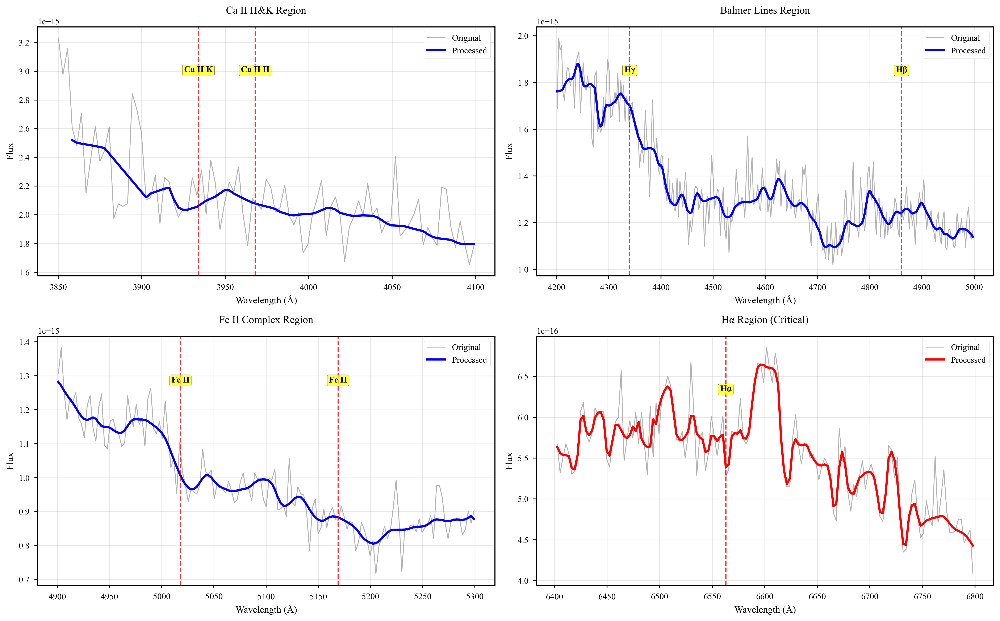

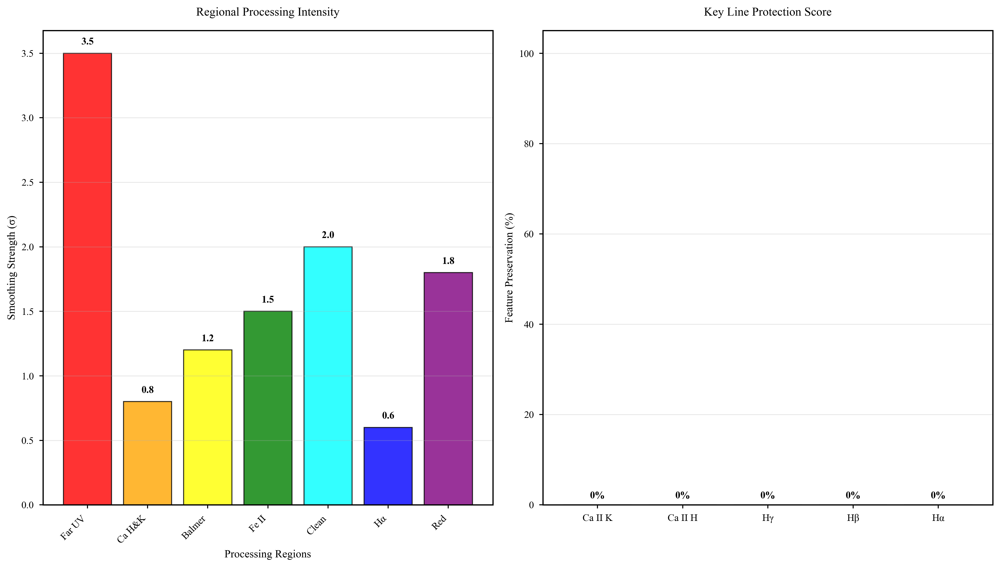

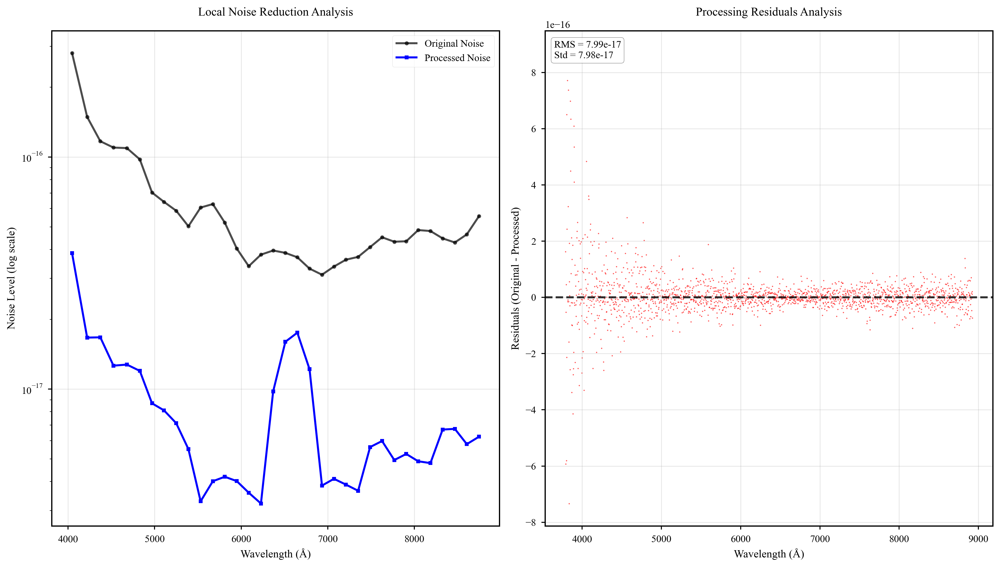

C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127775 (\N

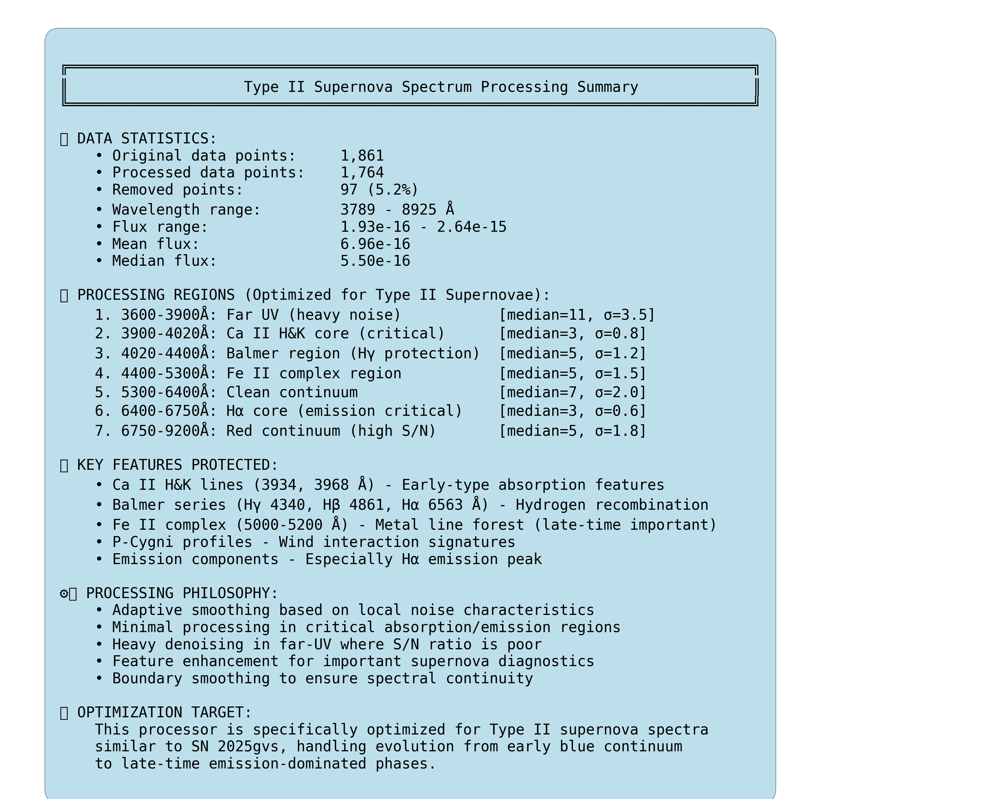

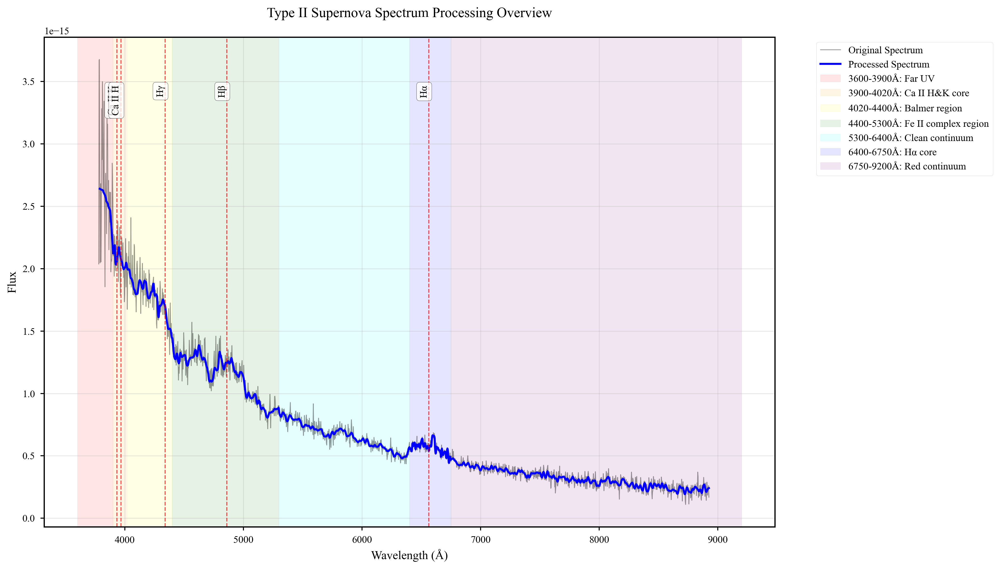

2. Spectral Lines - Key feature regions


<Figure size 1920x1320 with 0 Axes>

3. Processing Analysis - Strategy and protection scores


<Figure size 1920x1320 with 0 Axes>

4. Noise Analysis - Noise reduction and residuals


<Figure size 1920x1320 with 0 Axes>

5. Summary - Complete processing statistics


<Figure size 1920x1320 with 0 Axes>

In [49]:
wav_0407_clean, flux_0407_clean, processor, figures= process_and_display_typeII_spectrum(
     wav_0407, flux_0407,
     enhance_features=True,  
)

#### April 24

Processing Type II supernova spectrum...
Basic cleaning: removed 0 invalid points
Wavelength cut [3600-9200Å]: removed 0 points
Smart outlier removal: removed 83 points
Processed Far UV (heavy noise): 3600-3900Å (19 points)
Processed Ca II H&K core (critical): 3900-4020Å (25 points)
Processed Balmer region (Hγ protection): 4020-4400Å (120 points)
Processed Fe II complex region: 4400-5300Å (318 points)
Processed Clean continuum: 5300-6400Å (391 points)
Processed Hα core (emission critical): 6400-6750Å (127 points)
Processed Red continuum (high S/N): 6750-9200Å (778 points)
Applied Type II supernova optimized smoothing
Enhanced features: 
Applied final polish (sigma=0.3)
Creating diagnostic figures...

Displaying diagnostic figures:
1. Overview - Full spectrum comparison


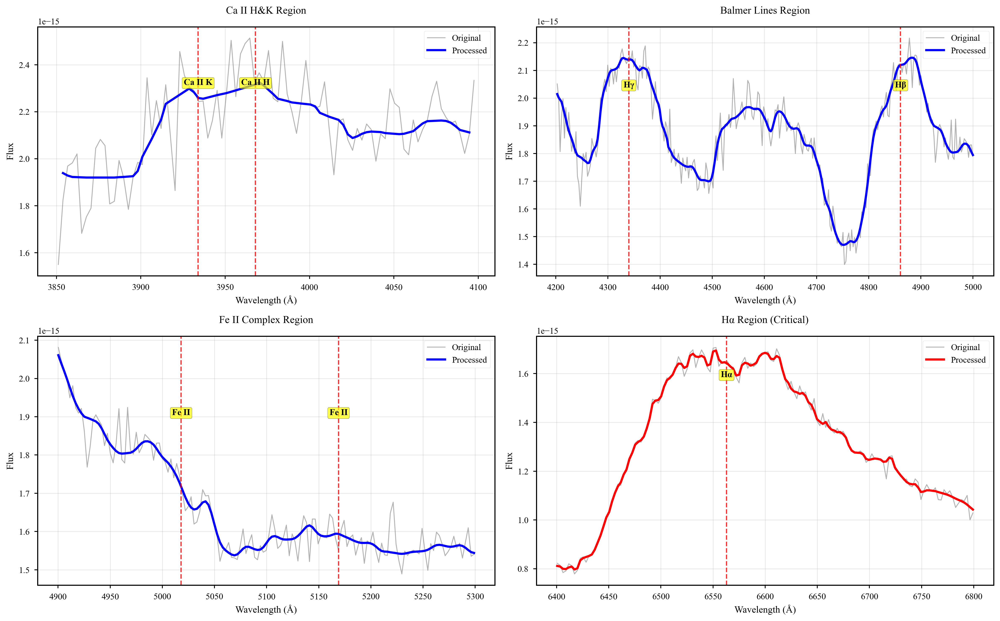

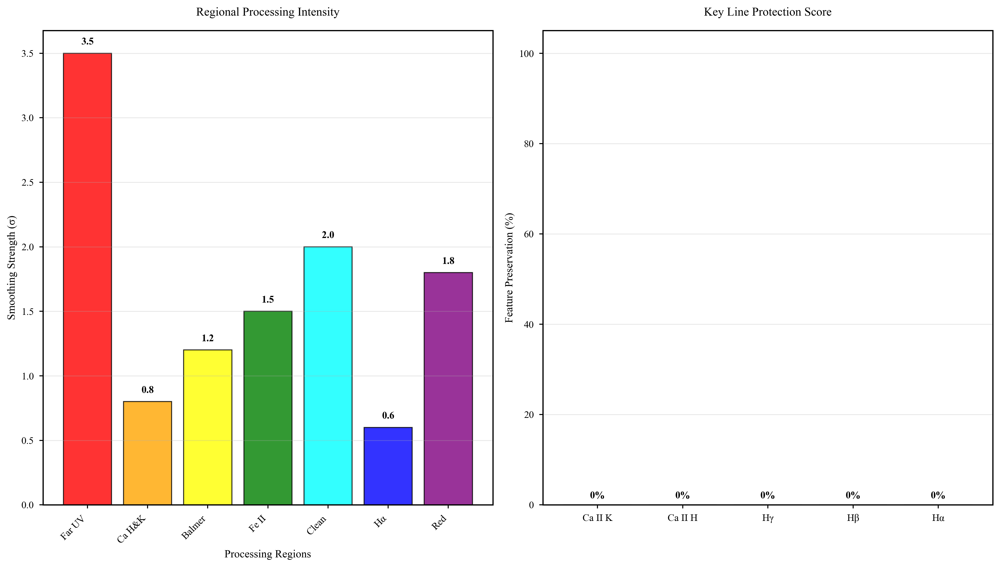

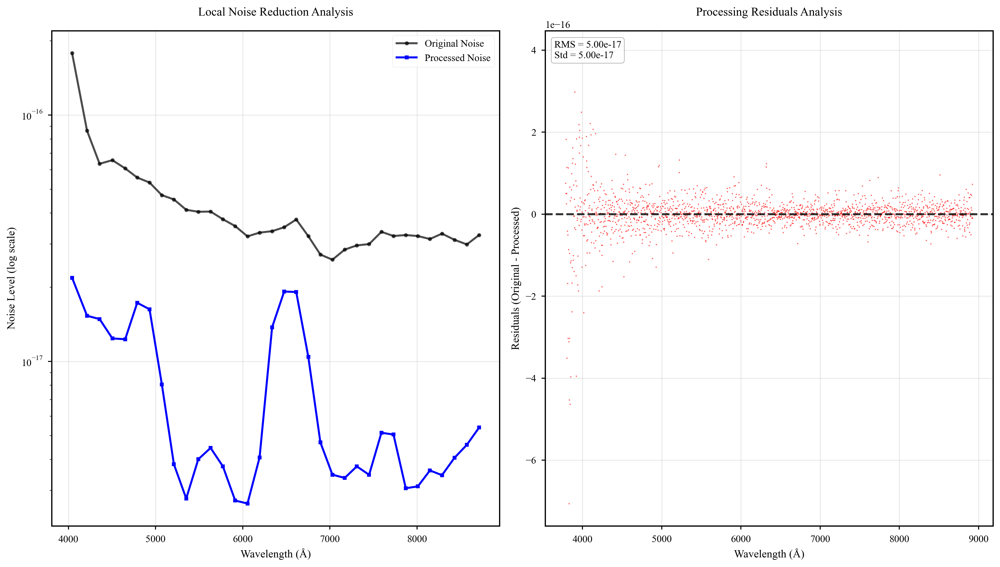

C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127775 (\N

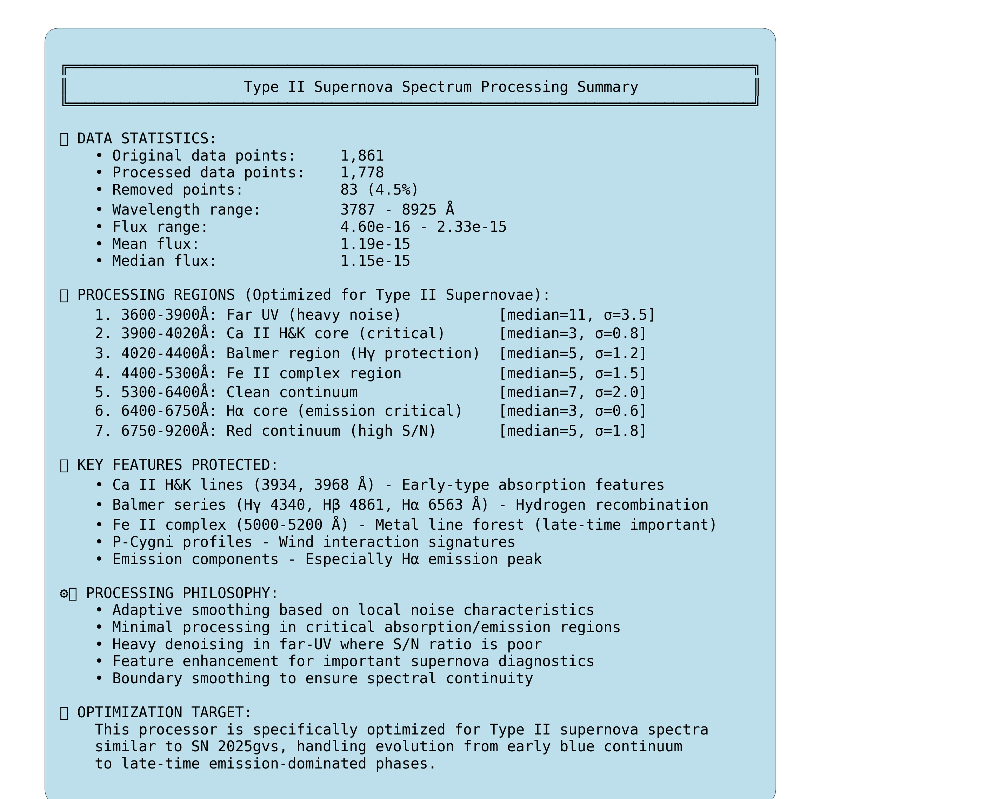

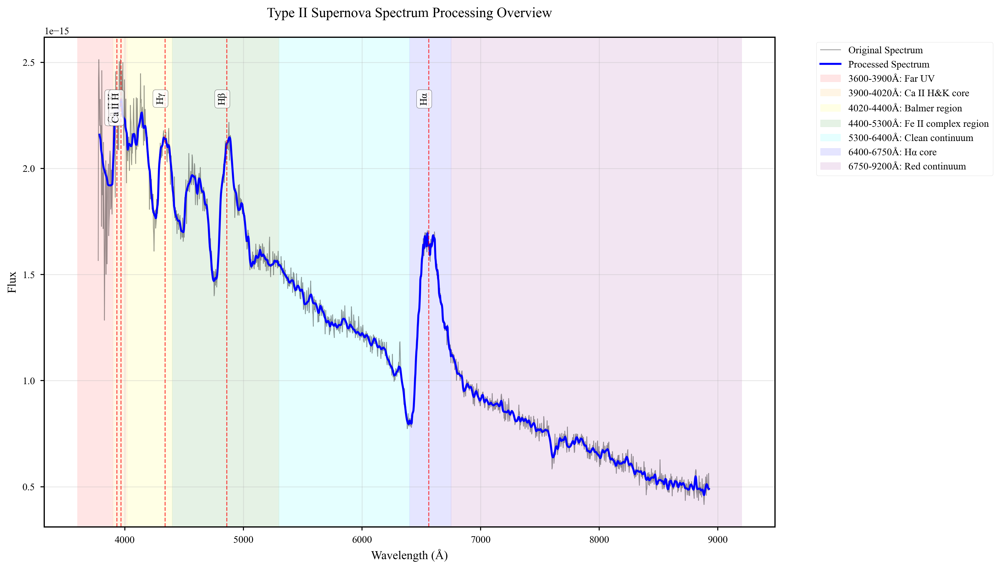

2. Spectral Lines - Key feature regions


<Figure size 1920x1320 with 0 Axes>

3. Processing Analysis - Strategy and protection scores


<Figure size 1920x1320 with 0 Axes>

4. Noise Analysis - Noise reduction and residuals


<Figure size 1920x1320 with 0 Axes>

5. Summary - Complete processing statistics


<Figure size 1920x1320 with 0 Axes>

In [50]:
wav_0424_clean, flux_0424_clean, processor, figures= process_and_display_typeII_spectrum(
     wav_0424, flux_0424,
     enhance_features=True,  
)

#### May 19

Processing Type II supernova spectrum...
Basic cleaning: removed 0 invalid points
Wavelength cut [3600-9200Å]: removed 0 points
Smart outlier removal: removed 84 points
Processed Far UV (heavy noise): 3600-3900Å (21 points)
Processed Ca II H&K core (critical): 3900-4020Å (30 points)
Processed Balmer region (Hγ protection): 4020-4400Å (115 points)
Processed Fe II complex region: 4400-5300Å (316 points)
Processed Clean continuum: 5300-6400Å (395 points)
Processed Hα core (emission critical): 6400-6750Å (127 points)
Processed Red continuum (high S/N): 6750-9200Å (773 points)
Applied Type II supernova optimized smoothing
Enhanced features: 
Applied final polish (sigma=0.3)
Creating diagnostic figures...

Displaying diagnostic figures:
1. Overview - Full spectrum comparison


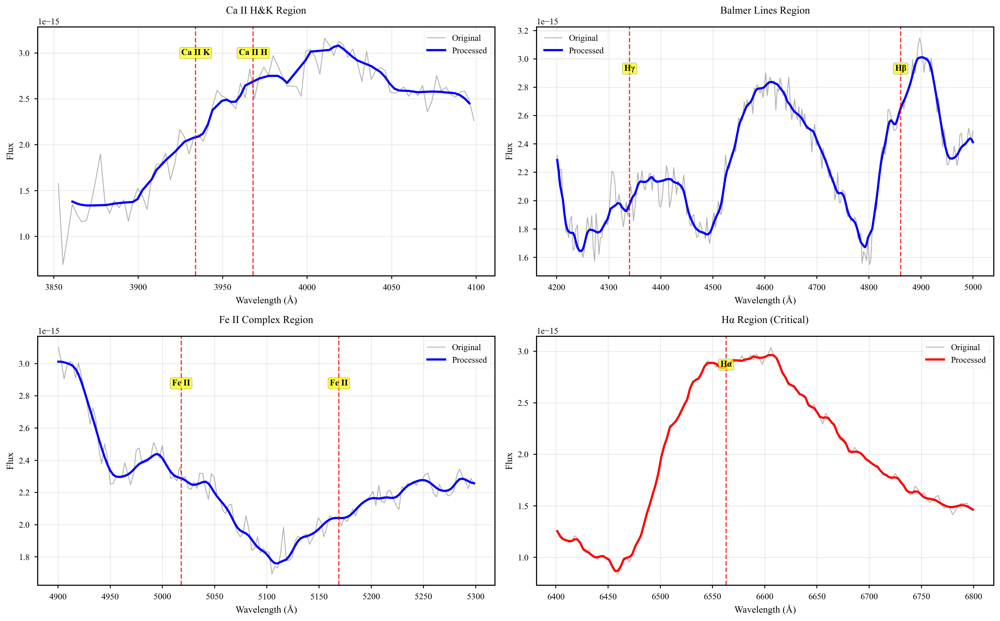

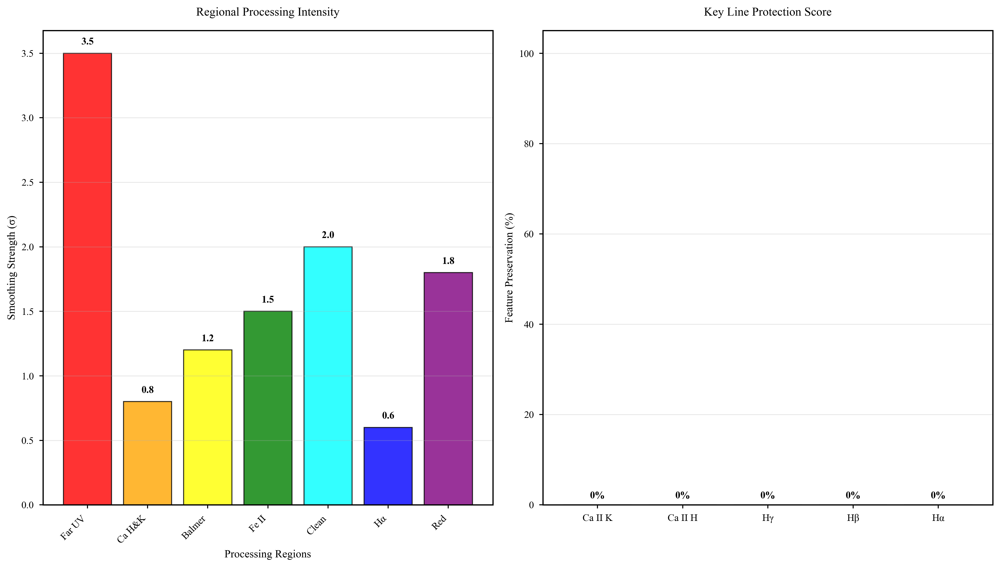

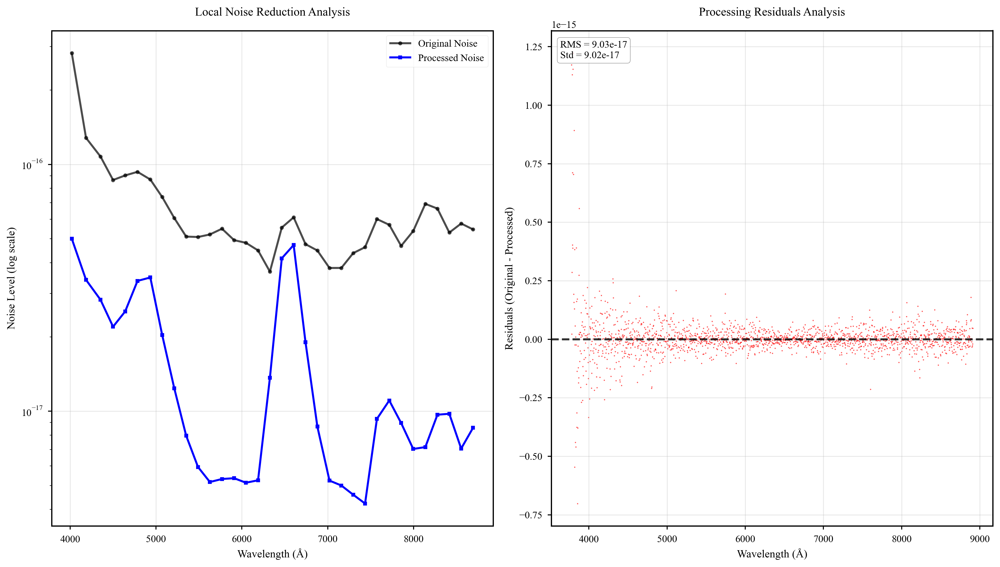

C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\19938\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127775 (\N

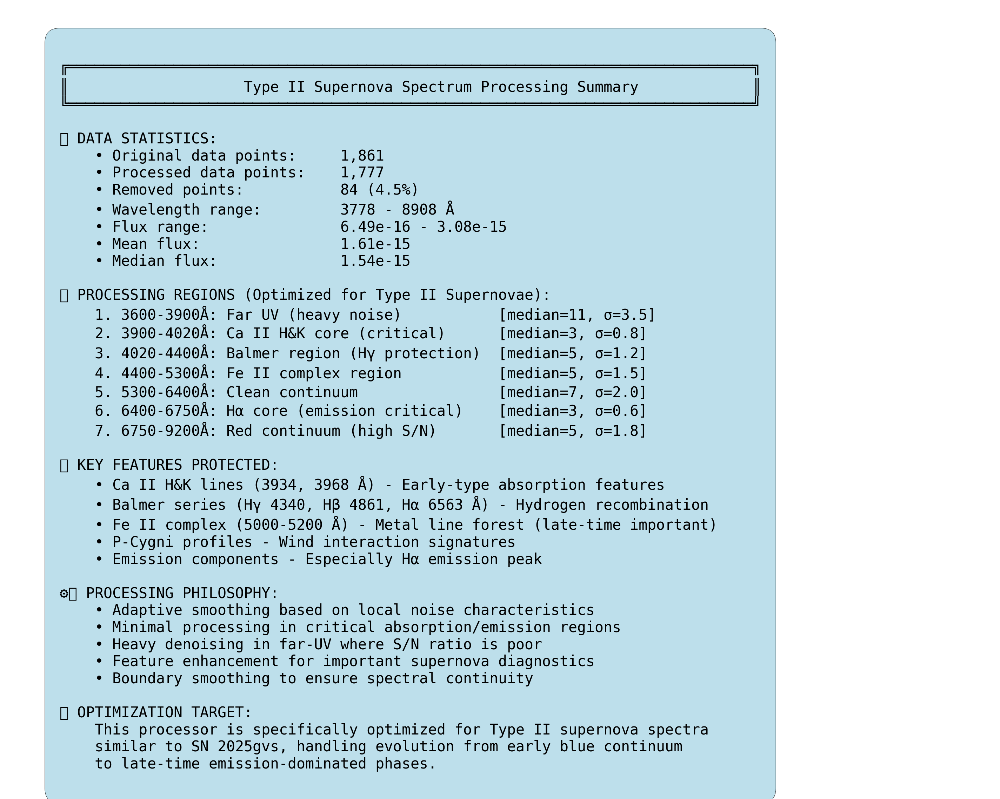

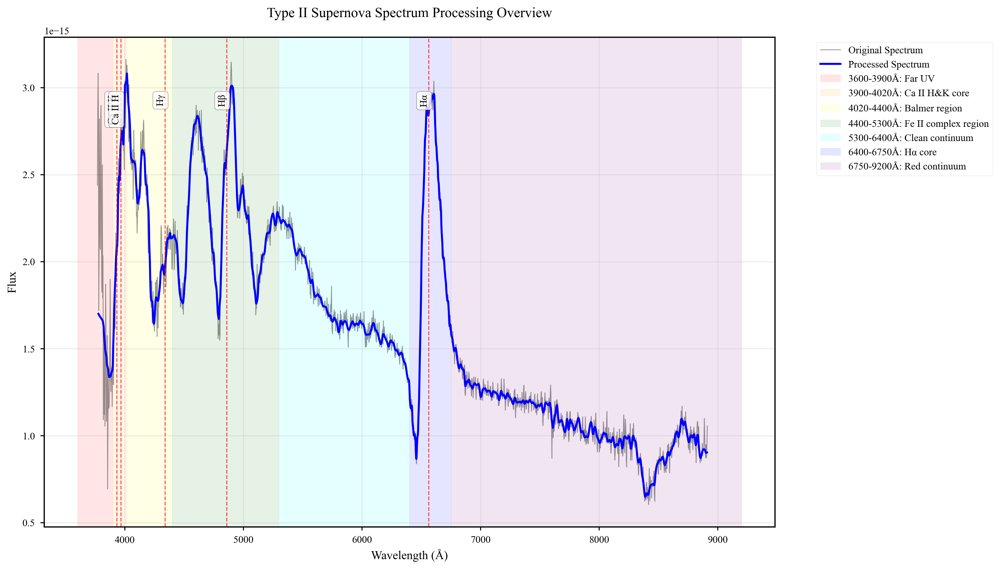

2. Spectral Lines - Key feature regions


<Figure size 1920x1320 with 0 Axes>

3. Processing Analysis - Strategy and protection scores


<Figure size 1920x1320 with 0 Axes>

4. Noise Analysis - Noise reduction and residuals


<Figure size 1920x1320 with 0 Axes>

5. Summary - Complete processing statistics


<Figure size 1920x1320 with 0 Axes>

In [51]:
wav_0519_clean, flux_0519_clean, processor, figures= process_and_display_typeII_spectrum(
     wav_0519, flux_0519,
     enhance_features=True,  
)

## Data Visualization

#### Visualization Program

In [52]:
from matplotlib import rcParams
import matplotlib.ticker as ticker
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec

# 设置科学出版物风格
def setup_publication_style():
    """设置适合科学出版物的绘图风格"""
    # 使用经典的科学绘图风格
    plt.style.use(['seaborn-v0_8-paper', 'seaborn-v0_8-deep'])
    
    # 字体设置
    rcParams['font.family'] = 'serif'
    rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
    rcParams['font.size'] = 10
    rcParams['axes.labelsize'] = 11
    rcParams['axes.titlesize'] = 12
    rcParams['xtick.labelsize'] = 10
    rcParams['ytick.labelsize'] = 10
    rcParams['legend.fontsize'] = 9
    
    # 图形质量
    rcParams['figure.dpi'] = 150
    rcParams['savefig.dpi'] = 300
    rcParams['savefig.format'] = 'pdf'
    
    # 线条和标记
    rcParams['lines.linewidth'] = 1.5
    rcParams['lines.markersize'] = 4
    rcParams['axes.linewidth'] = 0.8
    
    # 刻度
    rcParams['xtick.major.size'] = 4
    rcParams['ytick.major.size'] = 4
    rcParams['xtick.minor.size'] = 2
    rcParams['ytick.minor.size'] = 2
    rcParams['xtick.major.width'] = 0.8
    rcParams['ytick.major.width'] = 0.8
    rcParams['xtick.minor.width'] = 0.6
    rcParams['ytick.minor.width'] = 0.6
    rcParams['xtick.direction'] = 'in'
    rcParams['ytick.direction'] = 'in'
    rcParams['xtick.top'] = True
    rcParams['ytick.right'] = True
    
    # 图例
    rcParams['legend.frameon'] = True
    rcParams['legend.framealpha'] = 0.9
    rcParams['legend.fancybox'] = False
    rcParams['legend.edgecolor'] = 'gray'

# 优雅的配色方案
class ColorScheme:
    """科学图表的优雅配色方案"""
    # 主色调
    primary_blue = '#1f77b4'
    primary_red = '#d62728'
    primary_green = '#2ca02c'
    primary_orange = '#ff7f0e'
    
    # 柔和色调
    soft_blue = '#4c8cbf'
    soft_red = '#e67c73'
    soft_green = '#5cb85c'
    soft_yellow = '#f0ad4e'
    
    # 灰度
    dark_gray = '#2b2b2b'
    medium_gray = '#595959'
    light_gray = '#b8b8b8'
    very_light_gray = '#e5e5e5'
    
    # 透明度
    alpha_fill = 0.2
    alpha_line = 0.8
    alpha_scatter = 0.6

def plot_elegant_spectrum_simple(wav_raw, flux_raw, wav_clean, flux_clean, 
                               processor=None, object_name="", save_path=None):
    """
    简洁优雅的光谱图 - 无残差版本，适合展示和演讲
    """
    setup_publication_style()
    colors = ColorScheme()
    
    # 单panel设计
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    # 原始数据（淡化显示）
    ax.plot(wav_raw, flux_raw, color=colors.light_gray, 
            linewidth=0.3, alpha=0.4, label='Original', rasterized=True)
    
    # 处理后数据
    ax.plot(wav_clean, flux_clean, color=colors.primary_blue, 
            linewidth=1.2, label='Processed', alpha=0.95)
    
    # 标记重要光谱特征
    spectral_features = {
        #'Ca K': (3933.7, colors.soft_red),
        #'Ca H': (3968.5, colors.soft_red),
        #'4000Å': (4000, colors.primary_red),
        #'Hδ': (4101.7, colors.soft_blue),
        #'Hβ': (4861.3, colors.soft_blue),
        #'Hα': (6562.8, colors.soft_blue)
    }
    
    # 优化的特征标记
    y_range = np.percentile(flux_clean, 95) - np.percentile(flux_clean, 5)
    y_top = np.percentile(flux_clean, 96)
    
    # 智能标签放置 - 避免重叠
    marked_positions = []
    
    for name, (wavelength, color) in spectral_features.items():
        if wav_clean.min() <= wavelength <= wav_clean.max():
            # 特征线
            ax.axvline(wavelength, color=color, linestyle=':', 
                      alpha=0.3, linewidth=0.8, zorder=1)
            
            # 计算标签位置，避免重叠
            label_y = y_top + 0.08*y_range
            for pos in marked_positions:
                if abs(wavelength - pos[0]) < 150:  # 150Å内认为会重叠
                    label_y = max(label_y, pos[1] + 0.04*y_range)
            
            marked_positions.append((wavelength, label_y))
            
            # 标签 - 直接文本，不用箭头
            ax.text(wavelength, label_y, name, 
                   ha='center', va='bottom', fontsize=7,
                   color=color, rotation=0)
    
    # 处理区域的优雅标记（可选）
    if processor and hasattr(processor, 'processing_regions'):
        for start, end, _, _, desc in processor.processing_regions:
            if '4000Å' in desc:
                ax.axvspan(start, end, alpha=0.06, color=colors.soft_yellow,
                          zorder=0)
    
    # 可选：在角落添加处理质量指标
    if processor:
        stats = processor.get_statistics()
        quality_text = f"Data quality:\nPoints removed: {stats['removal_rate']:.1f}%\nλ range: {stats['wavelength_range'][0]:.0f}-{stats['wavelength_range'][1]:.0f} Å"
        ax.text(0.02, 0.98, quality_text, transform=ax.transAxes,
               fontsize=7, va='top', color=colors.medium_gray,
               bbox=dict(boxstyle='round,pad=0.3', 
                       facecolor='white', alpha=0.8, 
                       edgecolor=colors.light_gray))
    
    # 样式设置
    ax.set_xlabel('Wavelength (Å)', fontsize=12)
    ax.set_ylabel('Flux (arbitrary units)', fontsize=12)
    ax.set_xlim(wav_clean.min(), wav_clean.max())
    
    # 动态y轴
    y_lower = np.percentile(flux_clean, 0.5)
    y_upper = np.percentile(flux_clean, 99.5)
    y_margin = (y_upper - y_lower) * 0.1
    ax.set_ylim(y_lower - y_margin, y_upper + y_margin)
    
    # 网格
    ax.grid(True, alpha=0.1, linestyle=':', linewidth=0.5)
    
    # 图例
    ax.legend(loc='upper right', frameon=True, 
             framealpha=0.95, edgecolor=colors.light_gray)
    
    # 标题
    if object_name:
        ax.set_title(f'Spectrum of {object_name}', fontsize=14, pad=15)
    
    # 次要刻度
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    
    plt.tight_layout()
    
    if save_path:
        if save_path.endswith('.pdf'):
            save_path_simple = save_path.replace('.pdf', '_simple.pdf')
        else:
            save_path_simple = save_path + '_simple'
        plt.savefig(save_path_simple, dpi=300, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
    
    plt.show()
    return fig

def plot_elegant_spectrum_with_residuals(wav_raw, flux_raw, wav_clean, flux_clean, 
                                        processor=None, object_name="", save_path=None):
    """
    带残差图的科学版本 - 用于方法验证和质量控制
    原来的plot_elegant_spectrum函数内容
    """
    setup_publication_style()
    colors = ColorScheme()
    
    # 创建图形 - 稍微增加高度以避免拥挤
    fig, (ax_main, ax_residual) = plt.subplots(2, 1, figsize=(9, 7), 
                                               gridspec_kw={'height_ratios': [3, 1], 
                                                          'hspace': 0.08})
    
    # === 主图 ===
    # 原始数据（淡化显示）
    ax_main.plot(wav_raw, flux_raw, color=colors.light_gray, 
                linewidth=0.3, alpha=0.5, label='Original', rasterized=True)
    
    # 处理后数据（调整线宽，更细腻）
    ax_main.plot(wav_clean, flux_clean, color=colors.primary_blue, 
                linewidth=1.2, label='Processed', alpha=0.95)
    
    # 标记重要光谱特征 - 简化标记，避免拥挤
    spectral_features = {
        #'Ca K': (3933.7, colors.soft_red),
        #'Ca H': (3968.5, colors.soft_red),
        #'4000Å': (4000, colors.primary_red),
        #'Hδ': (4101.7, colors.soft_blue),
        #'Hβ': (4861.3, colors.soft_blue),
        #'Hα': (6562.8, colors.soft_blue)
    }
    
    # 添加特征标记 - 优化标签位置
    y_range = np.percentile(flux_clean, 95) - np.percentile(flux_clean, 5)
    y_top = np.percentile(flux_clean, 96)
    
    # 交替标签高度避免重叠
    label_heights = [0.08, 0.12, 0.08, 0.12, 0.08, 0.12]
    
    for i, (name, (wavelength, color)) in enumerate(spectral_features.items()):
        if wav_clean.min() <= wavelength <= wav_clean.max():
            ax_main.axvline(wavelength, color=color, linestyle=':', 
                          alpha=0.4, linewidth=0.8, zorder=1)
            
            # 优雅的标签
            ax_main.annotate(name, xy=(wavelength, y_top), 
                           xytext=(wavelength, y_top + label_heights[i % 6]*y_range),
                           ha='center', va='bottom', fontsize=7,
                           color=color, weight='normal',
                           arrowprops=dict(arrowstyle='-', color=color, 
                                         lw=0.4, alpha=0.4))
    
    # 处理区域的优雅标记
    if processor and hasattr(processor, 'processing_regions'):
        for start, end, _, _, desc in processor.processing_regions:
            if '4000Å' in desc:
                ax_main.axvspan(start, end, alpha=0.08, color=colors.soft_yellow,
                              zorder=0)
    
    # 设置主图样式
    ax_main.set_ylabel('Flux (arbitrary units)', fontsize=11)
    ax_main.set_xlim(wav_clean.min(), wav_clean.max())
    
    # 动态设置y轴范围
    y_lower = np.percentile(flux_clean, 1)
    y_upper = np.percentile(flux_clean, 99)
    y_margin = (y_upper - y_lower) * 0.1
    ax_main.set_ylim(y_lower - y_margin, y_upper + y_margin)
    
    # 添加网格
    ax_main.grid(True, alpha=0.15, linestyle=':', linewidth=0.5)
    
    # 图例
    ax_main.legend(loc='upper right', frameon=True, fancybox=False,
                  edgecolor=colors.medium_gray, framealpha=0.95)
    
    # 标题
    if object_name:
        ax_main.set_title(f'Spectrum of {object_name}', fontsize=12, pad=12)
    
    # 隐藏x轴标签（因为有残差图）
    ax_main.set_xticklabels([])
    
    # 添加次要刻度
    ax_main.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    ax_main.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    
    # === 残差图 ===
    # 计算残差
    from scipy.interpolate import interp1d
    f_interp = interp1d(wav_clean, flux_clean, bounds_error=False, 
                       fill_value=np.nan, kind='linear')
    flux_interp = f_interp(wav_raw)
    residuals = flux_raw - flux_interp
    valid = np.isfinite(residuals)
    
    # 残差散点图
    ax_residual.scatter(wav_raw[valid], residuals[valid], 
                       s=0.3, alpha=colors.alpha_scatter * 0.8, 
                       color=colors.medium_gray, rasterized=True)
    
    # 零线
    ax_residual.axhline(y=0, color=colors.dark_gray, linestyle='-', 
                       linewidth=0.8, alpha=0.8)
    
    # 残差统计
    rms = np.sqrt(np.mean(residuals[valid]**2))
    std = np.std(residuals[valid])
    
    # 添加±1σ区域
    ax_residual.fill_between(wav_clean, -std, std, 
                           alpha=colors.alpha_fill * 0.8, 
                           color=colors.soft_blue, 
                           label=f'±1σ = ±{std:.2e}')
    
    # 设置残差图样式
    ax_residual.set_xlabel('Wavelength (Å)', fontsize=11)
    ax_residual.set_ylabel('Residuals', fontsize=10)
    ax_residual.set_xlim(ax_main.get_xlim())
    ax_residual.set_ylim(-3*std, 3*std)
    
    # 网格
    ax_residual.grid(True, alpha=0.15, linestyle=':', linewidth=0.5)
    
    # 残差图图例
    ax_residual.legend(loc='upper right', fontsize=7)
    
    # 添加次要刻度
    ax_residual.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    ax_residual.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
    
    plt.show()
    return fig

def plot_elegant_spectrum(wav_raw, flux_raw, wav_clean, flux_clean, 
                         processor=None, object_name="", save_path=None,
                         show_residuals=False):
    """
    灵活的优雅光谱图 - 可选是否显示残差
    
    Parameters:
    -----------
    wav_raw, flux_raw : array-like
        原始波长和流量数据
    wav_clean, flux_clean : array-like
        处理后的波长和流量数据
    processor : object, optional
        处理器对象，包含处理信息
    object_name : str, optional
        天体名称
    save_path : str, optional
        保存路径
    show_residuals : bool, default=False
        是否显示残差图
        True: 显示残差图（科学分析）
        False: 仅显示光谱（优雅展示）
    
    Returns:
    --------
    fig : matplotlib.figure.Figure
        生成的图形对象
    """
    if show_residuals:
        # 调用带残差版本
        return plot_elegant_spectrum_with_residuals(
            wav_raw, flux_raw, wav_clean, flux_clean,
            processor, object_name, save_path
        )
    else:
        # 调用简化版本
        return plot_elegant_spectrum_simple(
            wav_raw, flux_raw, wav_clean, flux_clean,
            processor, object_name, save_path
        )

# 保持其他函数不变
def plot_feature_focus(wav_clean, flux_clean, 
                      feature_regions=None,
                      object_name="", save_path=None):
    """
    聚焦关键光谱特征的优美展示 - 改进布局避免拥挤
    """
    setup_publication_style()
    colors = ColorScheme()
    
    if feature_regions is None:
        feature_regions = [
            (3900, 4100, '4000Å Break', colors.primary_red),
            (4800, 4900, 'Hβ Region', colors.primary_blue),
            (6500, 6650, 'Hα Region', colors.primary_green)
        ]
    
    n_features = len(feature_regions)
    # 增加图的尺寸和间距
    fig = plt.figure(figsize=(14, 4.5))
    
    # 使用GridSpec以获得更好的控制
    gs = gridspec.GridSpec(1, n_features, figure=fig, wspace=0.35)
    axes = [fig.add_subplot(gs[0, i]) for i in range(n_features)]
    
    for ax, (wmin, wmax, title, color) in zip(axes, feature_regions):
        # 选择数据
        mask = (wav_clean >= wmin) & (wav_clean <= wmax)
        
        if np.any(mask):
            wav_region = wav_clean[mask]
            flux_region = flux_clean[mask]
            
            # 背景渐变 - 更淡
            ax.axvspan(wmin, wmax, alpha=0.03, color=color)
            
            # 主线
            ax.plot(wav_region, flux_region, color=color, 
                   linewidth=1.5, alpha=0.9)
            
            # 平滑的包络线 - 更淡
            from scipy.ndimage import gaussian_filter1d
            flux_smooth = gaussian_filter1d(flux_region, sigma=5)
            ax.plot(wav_region, flux_smooth, color=color, 
                   linewidth=0.8, alpha=0.2, linestyle='--')
            
            # 特定特征的垂直线
            if '4000Å' in title:
                ax.axvline(4000, color=color, linestyle=':', alpha=0.4, linewidth=1)
            elif 'Hβ' in title:
                ax.axvline(4861.3, color=color, linestyle=':', alpha=0.4, linewidth=1)
            elif 'Hα' in title:
                ax.axvline(6562.8, color=color, linestyle=':', alpha=0.4, linewidth=1)
            
            # 标题和标签
            ax.set_title(title, fontsize=11, color=color, pad=8, weight='normal')
            ax.set_xlabel('Wavelength (Å)', fontsize=10)
            ax.set_ylabel('Flux', fontsize=10)
            
            # 美化
            ax.grid(True, alpha=0.1, linestyle=':', linewidth=0.5)
            ax.set_xlim(wmin - 5, wmax + 5)  # 稍微扩展x轴范围
            
            # 动态y轴范围
            y_margin = (flux_region.max() - flux_region.min()) * 0.15
            ax.set_ylim(flux_region.min() - y_margin, 
                       flux_region.max() + y_margin)
            
            # 次要刻度
            ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 减少刻度标签数量避免拥挤
            ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
            ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    
    # 总标题
    if object_name:
        fig.suptitle(f'{object_name} - Spectral Features', 
                    fontsize=13, y=1.03)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
    
    plt.show()
    return fig

def plot_processing_overview(wav_raw, flux_raw, wav_clean, flux_clean, 
                           processor, object_name="", save_path=None):
    """
    处理过程的综合展示 - 简化版本，避免信息过载
    """
    setup_publication_style()
    colors = ColorScheme()
    
    # 创建更宽松的布局
    fig = plt.figure(figsize=(14, 9))
    
    # 使用GridSpec创建更灵活的布局
    gs = gridspec.GridSpec(3, 4, figure=fig, 
                          height_ratios=[2.5, 1.2, 1],
                          width_ratios=[1, 1, 1, 1.2],
                          hspace=0.35, wspace=0.35)
    
    # 主光谱图（跨越整个顶部）
    ax_main = fig.add_subplot(gs[0, :])
    
    # 三个特征区域（第二行前三列）
    ax_blue = fig.add_subplot(gs[1, 0])
    ax_4000 = fig.add_subplot(gs[1, 1])
    ax_red = fig.add_subplot(gs[1, 2])
    
    # 噪声分析（第二行第四列）
    ax_noise = fig.add_subplot(gs[1, 3])
    
    # 统计信息（底部跨越所有列）
    ax_stats = fig.add_subplot(gs[2, :])
    
    # === 主光谱 ===
    ax_main.plot(wav_raw, flux_raw, color=colors.light_gray, 
                linewidth=0.3, alpha=0.4, rasterized=True, label='Original')
    ax_main.plot(wav_clean, flux_clean, color=colors.primary_blue, 
                linewidth=1.3, alpha=0.9, label='Processed')
    
    # 处理区域标记 - 使用图例而不是颜色区域
    if hasattr(processor, 'processing_regions'):
        # 只标记关键区域
        key_regions = [(3990, 4010, 'Protected'), (3600, 3990, 'Heavy'), (5000, 9200, 'Light')]
        region_colors = [colors.soft_yellow, colors.soft_red, colors.soft_green]
        
        for (start, end, label), color in zip(key_regions, region_colors):
            if start >= wav_clean.min() and end <= wav_clean.max():
                ax_main.axvspan(start, end, alpha=0.08, color=color, label=f'{label} smoothing')
    
    ax_main.set_xlabel('Wavelength (Å)', fontsize=12)
    ax_main.set_ylabel('Flux', fontsize=12)
    ax_main.set_title('Spectrum Processing Overview', fontsize=14, pad=15)
    ax_main.grid(True, alpha=0.15, linestyle=':')
    ax_main.legend(loc='upper right', ncol=2, fontsize=9)
    
    # === 特征区域 ===
    # 简化每个子图，只显示关键信息
    # 蓝端
    mask = (wav_clean >= 3600) & (wav_clean <= 3900)
    if np.any(mask):
        ax_blue.plot(wav_clean[mask], flux_clean[mask], 
                    color=colors.primary_blue, linewidth=1.2)
        ax_blue.set_title('Blue End', fontsize=10)
        ax_blue.grid(True, alpha=0.1, linestyle=':')
        ax_blue.set_xlabel('Wavelength (Å)', fontsize=9)
        ax_blue.xaxis.set_major_locator(ticker.MaxNLocator(4))
    
    # 4000Å
    mask = (wav_clean >= 3950) & (wav_clean <= 4050)
    if np.any(mask):
        ax_4000.plot(wav_clean[mask], flux_clean[mask], 
                    color=colors.primary_red, linewidth=1.2)
        ax_4000.axvline(4000, color=colors.primary_red, 
                       linestyle='--', alpha=0.5, linewidth=1)
        ax_4000.set_title('4000Å Break', fontsize=10)
        ax_4000.grid(True, alpha=0.1, linestyle=':')
        ax_4000.set_xlabel('Wavelength (Å)', fontsize=9)
        ax_4000.xaxis.set_major_locator(ticker.MaxNLocator(4))
    
    # 红端
    mask = (wav_clean >= 6500) & (wav_clean <= 6650)
    if np.any(mask):
        ax_red.plot(wav_clean[mask], flux_clean[mask], 
                   color=colors.primary_green, linewidth=1.2)
        ax_red.axvline(6563, color=colors.primary_green, 
                      linestyle='--', alpha=0.5, linewidth=1)
        ax_red.set_title('Hα Region', fontsize=10)
        ax_red.grid(True, alpha=0.1, linestyle=':')
        ax_red.set_xlabel('Wavelength (Å)', fontsize=9)
        ax_red.xaxis.set_major_locator(ticker.MaxNLocator(4))
    else:
        ax_red.text(0.5, 0.5, 'Hα region\nnot available', 
                   ha='center', va='center', transform=ax_red.transAxes,
                   fontsize=10, color=colors.medium_gray)
        ax_red.set_xticks([])
        ax_red.set_yticks([])
    
    # === 噪声分析 ===
    # 简化的S/N比较
    # 计算平均S/N改善
    window = 100
    snr_improvement = []
    wav_centers = []
    
    for i in range(0, len(wav_clean) - window, window):
        wav_center = wav_clean[i + window//2]
        wav_centers.append(wav_center)
        
        # 原始数据S/N
        mask_orig = (wav_raw >= wav_clean[i]) & (wav_raw < wav_clean[i + window])
        if np.sum(mask_orig) > 10:
            noise_orig = np.std(flux_raw[mask_orig])
            noise_proc = np.std(flux_clean[i:i+window])
            improvement = noise_orig / noise_proc if noise_proc > 0 else 1
            snr_improvement.append(improvement)
        else:
            snr_improvement.append(1)
    
    ax_noise.plot(wav_centers, snr_improvement, color=colors.primary_orange, 
                 linewidth=1.5)
    ax_noise.axhline(y=1, color=colors.dark_gray, linestyle='--', alpha=0.5)
    ax_noise.set_xlabel('Wavelength (Å)', fontsize=9)
    ax_noise.set_ylabel('Noise Reduction', fontsize=9)
    ax_noise.set_title('S/N Improvement', fontsize=10)
    ax_noise.grid(True, alpha=0.1, linestyle=':')
    ax_noise.set_ylim(0.5, max(snr_improvement)*1.1)
    ax_noise.xaxis.set_major_locator(ticker.MaxNLocator(4))
    
    # === 统计信息 ===
    ax_stats.axis('off')
    
    if processor:
        stats = processor.get_statistics()
        
        # 创建更清晰的统计布局
        # 左侧：数据统计
        stats_text1 = f"Data Statistics:\n"
        stats_text1 += f"• Original points: {stats['original_points']:,}\n"
        stats_text1 += f"• Processed points: {stats['processed_points']:,}\n"
        stats_text1 += f"• Removed: {stats['removed_points']} ({stats['removal_rate']:.1f}%)\n"
        stats_text1 += f"• λ range: {stats['wavelength_range'][0]:.0f}-{stats['wavelength_range'][1]:.0f} Å"
        
        # 右侧：处理步骤
        stats_text2 = f"Processing Steps:\n"
        for i, log in enumerate(processor.processing_log[-4:], 1):
            stats_text2 += f"{i}. {log}\n"
        
        # 标题
        if object_name:
            ax_stats.text(0.5, 0.9, object_name, transform=ax_stats.transAxes,
                         fontsize=12, ha='center', weight='bold')
        
        # 左右两列
        ax_stats.text(0.25, 0.7, stats_text1, transform=ax_stats.transAxes,
                     fontsize=10, verticalalignment='top', ha='center',
                     bbox=dict(boxstyle='round,pad=0.5', 
                             facecolor=colors.very_light_gray,
                             edgecolor=colors.medium_gray,
                             linewidth=0.5, alpha=0.8))
        
        ax_stats.text(0.75, 0.7, stats_text2, transform=ax_stats.transAxes,
                     fontsize=10, verticalalignment='top', ha='center',
                     bbox=dict(boxstyle='round,pad=0.5', 
                             facecolor=colors.very_light_gray,
                             edgecolor=colors.medium_gray,
                             linewidth=0.5, alpha=0.8))
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
    
    plt.show()
    return fig

#### April 7

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:321: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


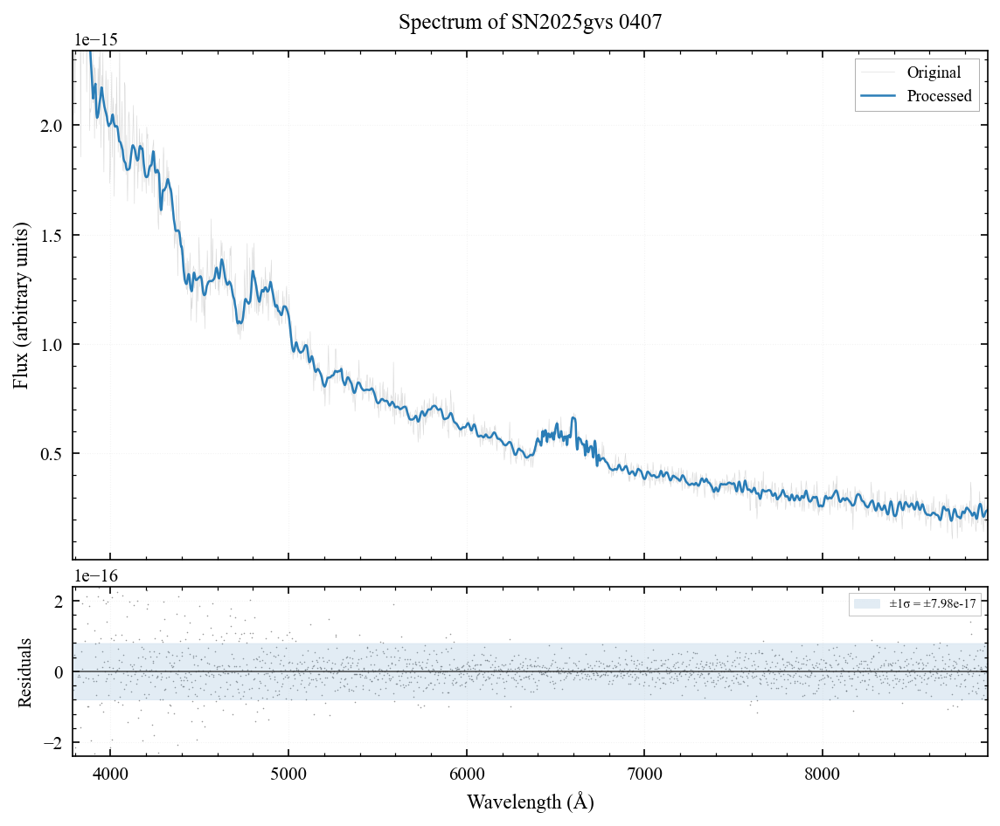

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:452: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


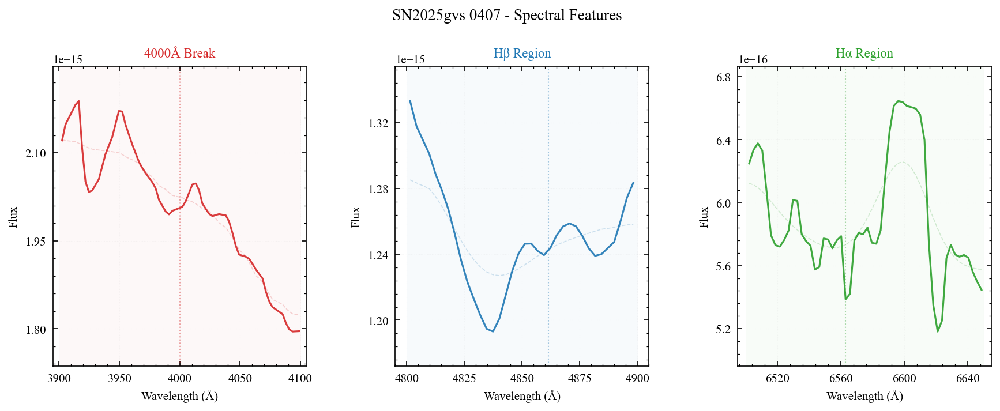

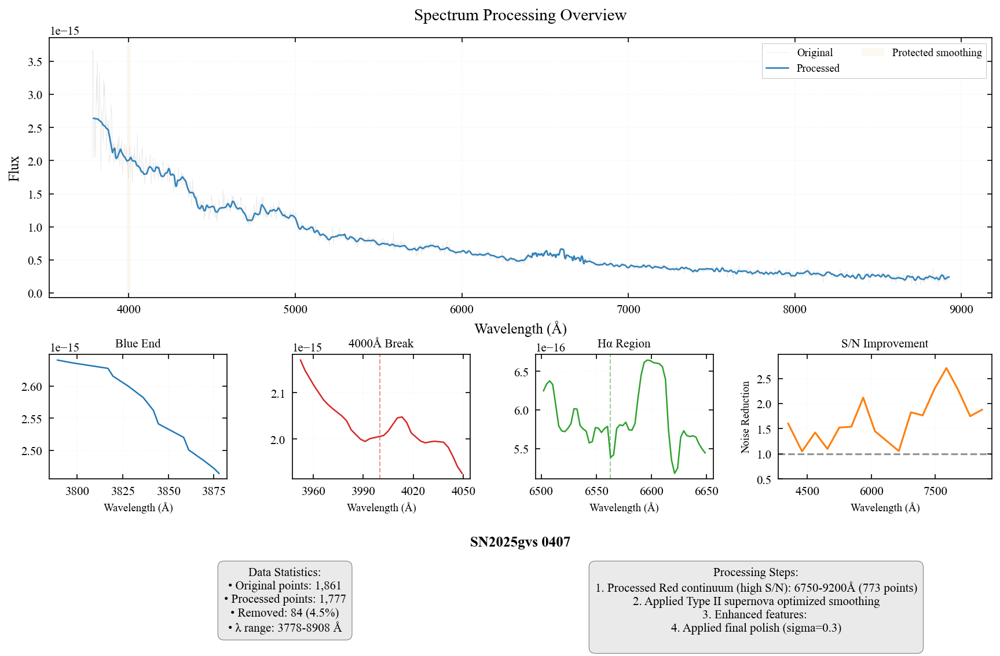

In [54]:
# 主图 - 科学版本（带残差）
fig1 = plot_elegant_spectrum(wav_0407, flux_0407, wav_0407_clean, flux_0407_clean, 
                             processor=processor,
                             object_name="SN2025gvs 0407",
                             show_residuals=True,   # 显示残差
                             #save_path="elegant_spectrum_residuals.pdf"
                             )

#  特征聚焦图
fig2 = plot_feature_focus(wav_0407_clean, flux_0407_clean,
                         object_name="SN2025gvs 0407",
                         #save_path="spectral_features.pdf"
                         )

#  综合展示图
fig3 = plot_processing_overview(wav_0407, flux_0407, wav_0407_clean, flux_0407_clean,
                              processor=processor,
                              object_name="SN2025gvs 0407",
                              #save_path="processing_overview.pdf"
                              )

#### April 24

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:321: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


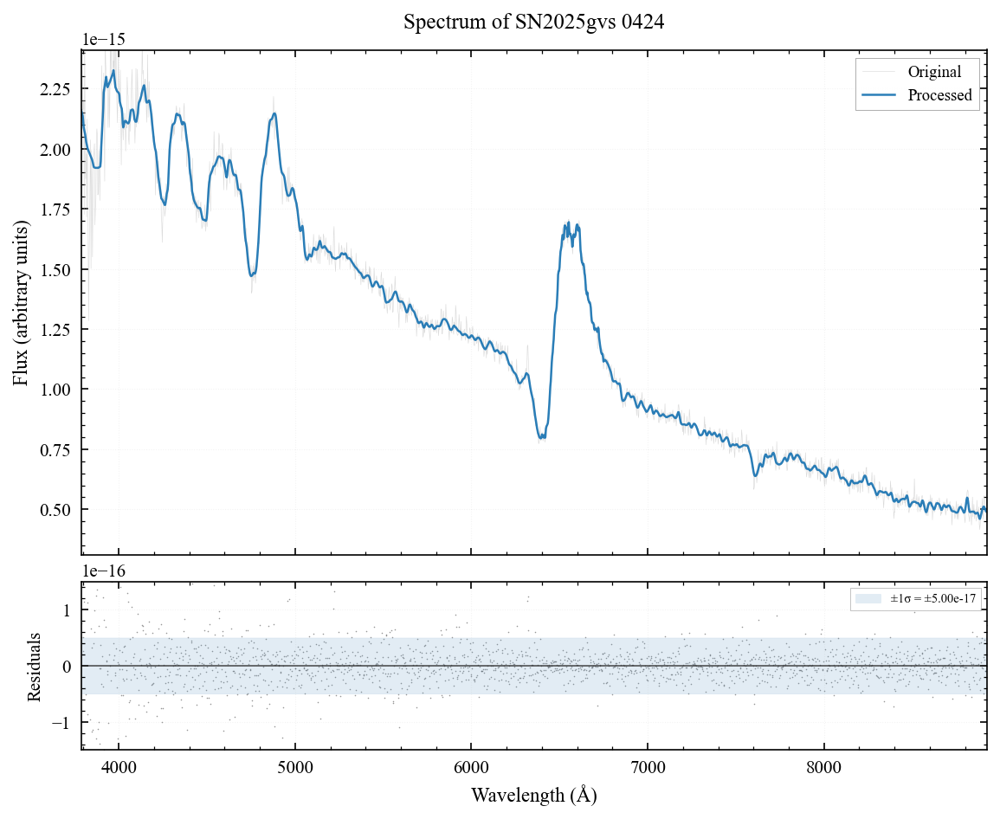

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:452: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


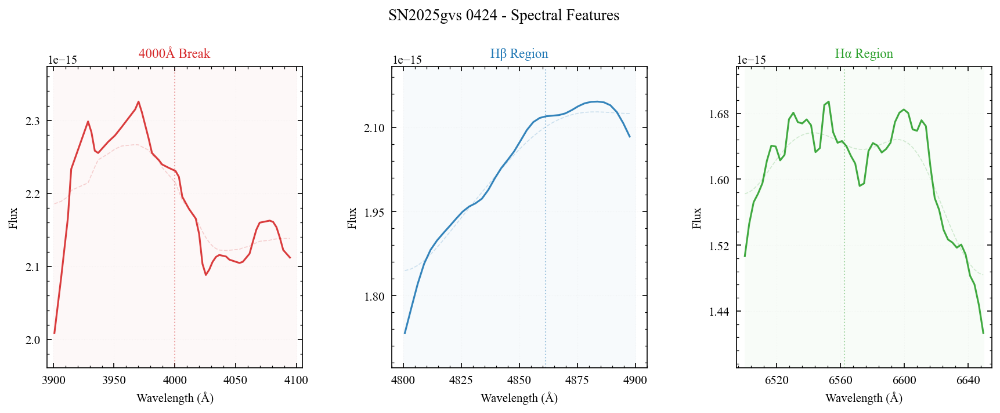

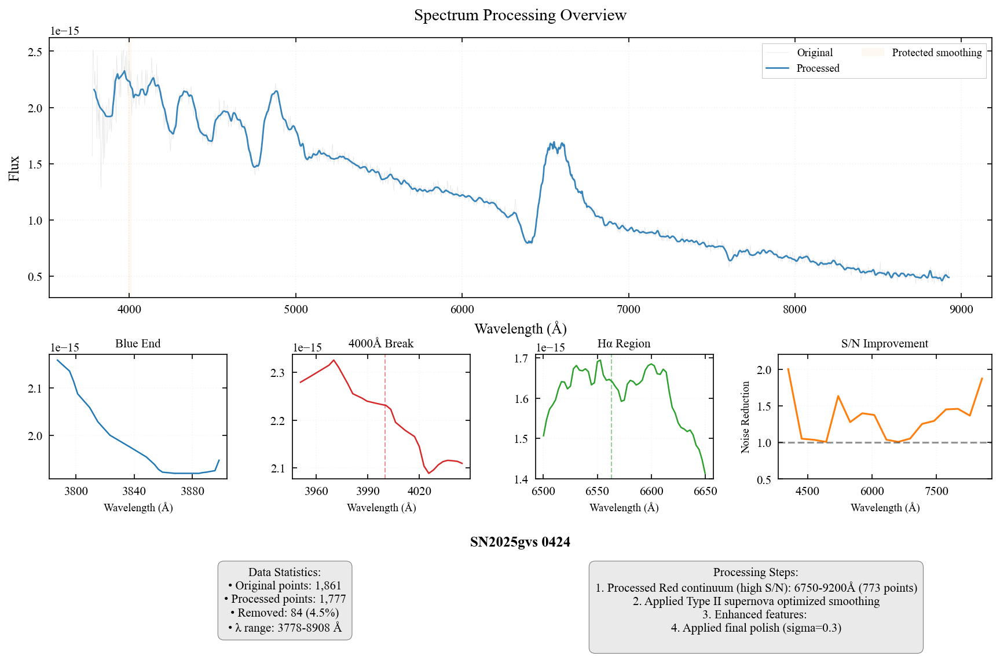

In [55]:
# 主图 - 科学版本（带残差）
fig1 = plot_elegant_spectrum(wav_0424, flux_0424, wav_0424_clean, flux_0424_clean, 
                             processor=processor,
                             object_name="SN2025gvs 0424",
                             show_residuals=True,   # 显示残差
                             #save_path="elegant_spectrum_residuals.pdf"
                             )

#  特征聚焦图
fig2 = plot_feature_focus(wav_0424_clean, flux_0424_clean,
                         object_name="SN2025gvs 0424",
                         #save_path="spectral_features.pdf"
                         )

#  综合展示图
fig3 = plot_processing_overview(wav_0424, flux_0424, wav_0424_clean, flux_0424_clean,
                              processor=processor,
                              object_name="SN2025gvs 0424",
                              #save_path="processing_overview.pdf"
                              )

#### May 19

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:321: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


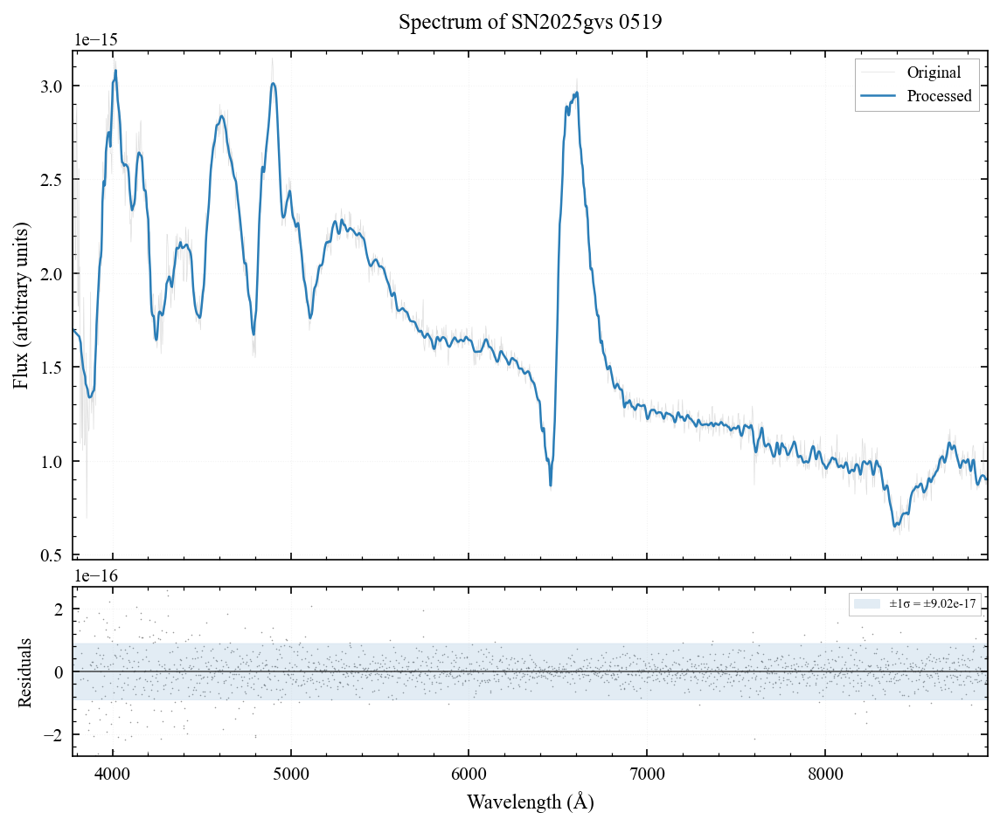

C:\Users\19938\AppData\Local\Temp\ipykernel_45420\2159492723.py:452: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


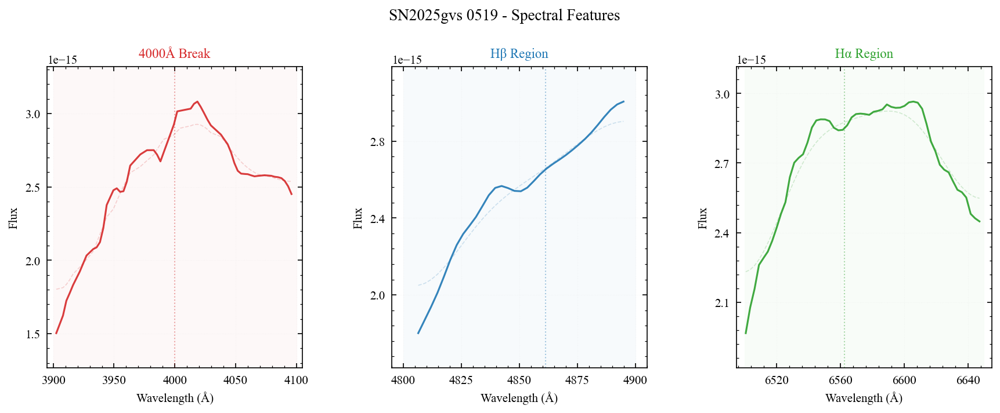

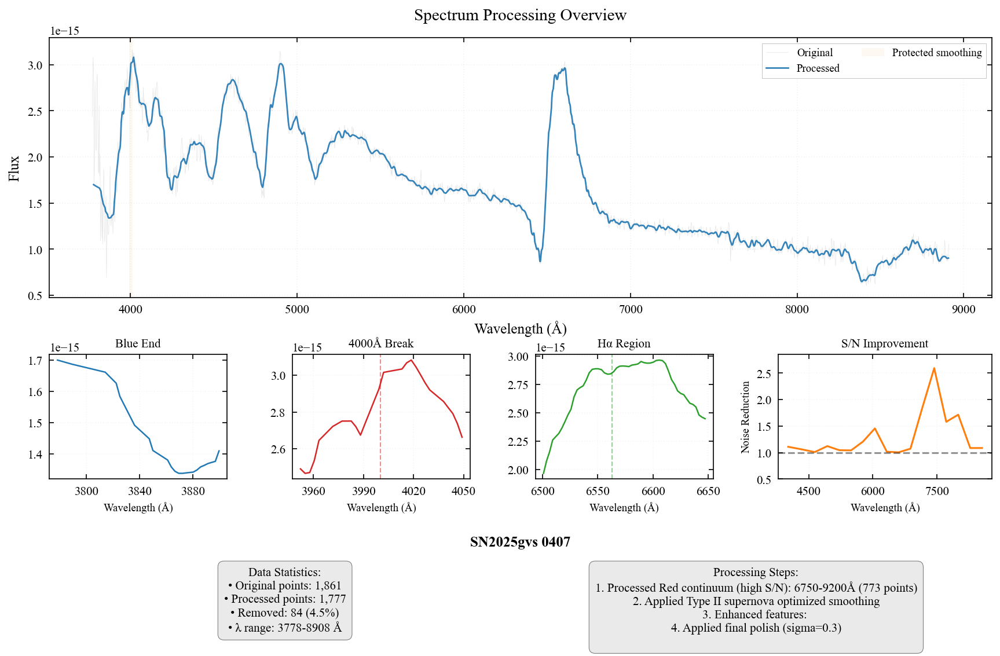

In [56]:
# 主图 - 科学版本（带残差）
fig1 = plot_elegant_spectrum(wav_0519, flux_0519, wav_0519_clean, flux_0519_clean, 
                             processor=processor,
                             object_name="SN2025gvs 0519",
                             show_residuals=True,   # 显示残差
                             #save_path="elegant_spectrum_residuals.pdf"
                             )

#  特征聚焦图
fig2 = plot_feature_focus(wav_0519_clean, flux_0519_clean,
                         object_name="SN2025gvs 0519",
                         #save_path="spectral_features.pdf"
                         )

#  综合展示图
fig3 = plot_processing_overview(wav_0519, flux_0519, wav_0519_clean, flux_0519_clean,
                              processor=processor,
                              object_name="SN2025gvs 0407",
                              #save_path="processing_overview.pdf"
                              )

#### Reference Images

Shown here is the spectral data reference used for fitting, provided by Senior Brother Huang Ruifeng.

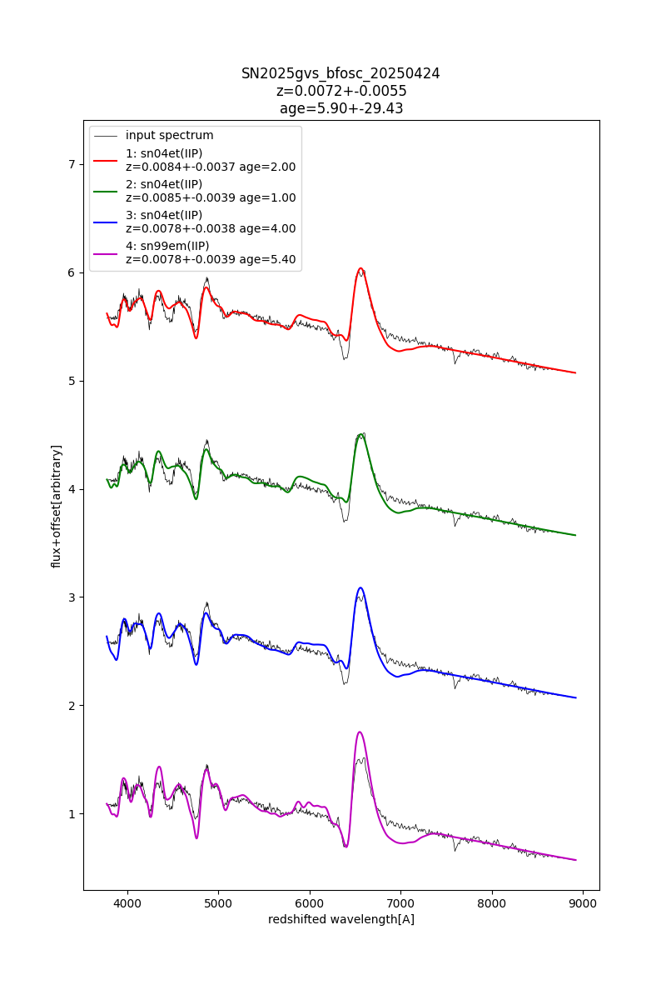

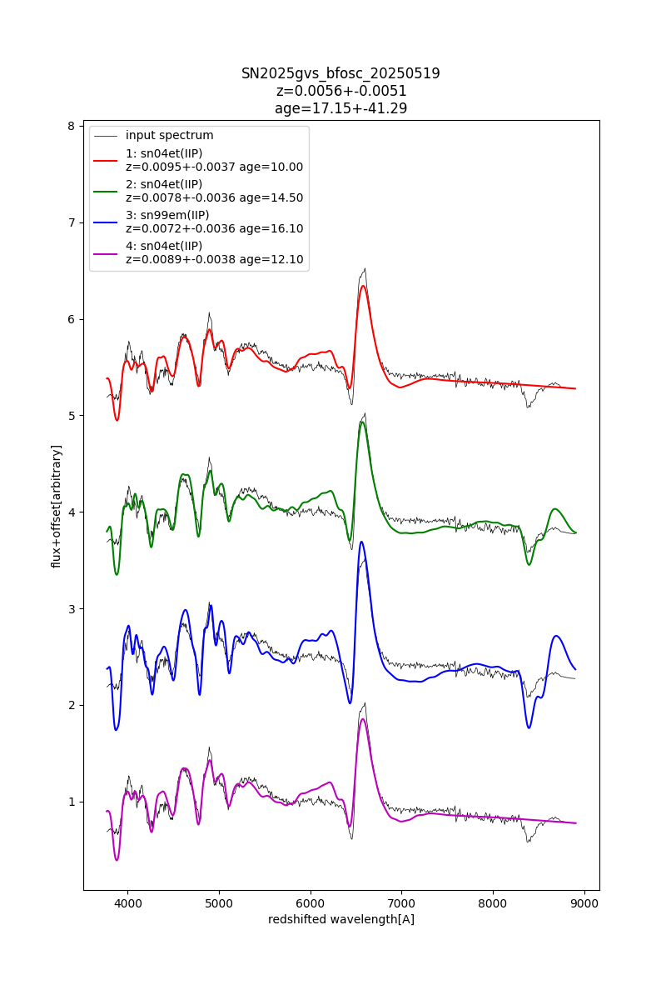

In [60]:
from IPython.display import Image, display

# 显示多张图片
display(Image("../SN2025gvs_spectrum/20250424/SN2025gvs_bfosc_20250424_snid.png", width=400))
display(Image("../SN2025gvs_spectrum/20250519/SN2025gvs_bfosc_20250519_snid.png", width=400))

## Redshift Measurement

The Hα emission line is a prominent feature in the late-phase spectra of Type II supernovae and appears primarily as a P-Cygni profile during the early phase. This emission line and other important lines are selected here to measure the redshift of the supernova.

#### General Fitting Program

In [82]:
from matplotlib import rcParams
import matplotlib.ticker as ticker
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec
from scipy.stats import linregress
from scipy.optimize import curve_fit
from scipy.interpolate import UnivariateSpline
import warnings
import numpy as np
import matplotlib.pyplot as plt

# 设置科学出版物风格
def setup_publication_style():
    """设置适合科学出版物的绘图风格"""
    # 使用经典的科学绘图风格
    plt.style.use(['seaborn-v0_8-paper', 'seaborn-v0_8-deep'])
    
    # 字体设置
    rcParams['font.family'] = 'serif'
    rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
    rcParams['font.size'] = 10
    rcParams['axes.labelsize'] = 11
    rcParams['axes.titlesize'] = 12
    rcParams['xtick.labelsize'] = 10
    rcParams['ytick.labelsize'] = 10
    rcParams['legend.fontsize'] = 9
    
    # 图形质量
    rcParams['figure.dpi'] = 150
    rcParams['savefig.dpi'] = 300
    rcParams['savefig.format'] = 'pdf'
    
    # 线条和标记
    rcParams['lines.linewidth'] = 1.5
    rcParams['lines.markersize'] = 4
    rcParams['axes.linewidth'] = 0.8
    
    # 刻度
    rcParams['xtick.major.size'] = 4
    rcParams['ytick.major.size'] = 4
    rcParams['xtick.minor.size'] = 2
    rcParams['ytick.minor.size'] = 2
    rcParams['xtick.major.width'] = 0.8
    rcParams['ytick.major.width'] = 0.8
    rcParams['xtick.minor.width'] = 0.6
    rcParams['ytick.minor.width'] = 0.6
    rcParams['xtick.direction'] = 'in'
    rcParams['ytick.direction'] = 'in'
    rcParams['xtick.top'] = True
    rcParams['ytick.right'] = True
    
    # 图例
    rcParams['legend.frameon'] = True
    rcParams['legend.framealpha'] = 0.9
    rcParams['legend.fancybox'] = False
    rcParams['legend.edgecolor'] = 'gray'

# 优雅的配色方案
class ColorScheme:
    """科学图表的优雅配色方案"""
    # 主色调
    primary_blue = '#1f77b4'
    primary_red = '#d62728'
    primary_green = '#2ca02c'
    primary_orange = '#ff7f0e'
    
    # 柔和色调
    soft_blue = '#4c8cbf'
    soft_red = '#e67c73'
    soft_green = '#5cb85c'
    soft_yellow = '#f0ad4e'
    
    # 灰度
    dark_gray = '#2b2b2b'
    medium_gray = '#595959'
    light_gray = '#b8b8b8'
    very_light_gray = '#e5e5e5'
    
    # 透明度
    alpha_fill = 0.2
    alpha_line = 0.8
    alpha_scatter = 0.6

def gaussian(x, amplitude, center, width, offset):
    """高斯函数模型"""
    return amplitude * np.exp(-0.5 * ((x - center) / width)**2) + offset

def fit_continuum_multiple_methods(wav, flux, exclude_regions=None):
    """使用多种方法拟合连续谱"""
    # 创建掩码，排除谱线区域
    mask = np.ones(len(wav), dtype=bool)
    if exclude_regions:
        for region in exclude_regions:
            region_mask = (wav >= region[0]) & (wav <= region[1])
            mask &= ~region_mask
    
    wav_cont = wav[mask]
    flux_cont = flux[mask]
    
    if len(wav_cont) < 10:
        raise ValueError("连续谱数据点太少，无法进行可靠拟合")
    
    methods = {}
    
    # 方法1: 线性拟合
    slope, intercept, r_val, _, _ = linregress(wav_cont, flux_cont)
    linear_model = slope * wav + intercept
    methods['linear'] = {
        'model': linear_model,
        'params': [slope, intercept],
        'r_squared': r_val**2,
        'name': 'Linear Fit'
    }
    
    # 方法2: 二次多项式拟合
    if len(wav_cont) >= 3:
        poly2_coeffs = np.polyfit(wav_cont, flux_cont, 2)
        poly2_model = np.polyval(poly2_coeffs, wav)
        ss_res = np.sum((flux_cont - np.polyval(poly2_coeffs, wav_cont))**2)
        ss_tot = np.sum((flux_cont - np.mean(flux_cont))**2)
        r2_poly2 = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0
        methods['poly2'] = {
            'model': poly2_model,
            'params': poly2_coeffs,
            'r_squared': r2_poly2,
            'name': 'Quadratic Fit'
        }
    
    # 方法3: 三次多项式拟合
    if len(wav_cont) >= 4:
        poly3_coeffs = np.polyfit(wav_cont, flux_cont, 3)
        poly3_model = np.polyval(poly3_coeffs, wav)
        ss_res = np.sum((flux_cont - np.polyval(poly3_coeffs, wav_cont))**2)
        r2_poly3 = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0
        methods['poly3'] = {
            'model': poly3_model,
            'params': poly3_coeffs,
            'r_squared': r2_poly3,
            'name': 'Cubic Fit'
        }
    
    # 方法4: 样条插值
    if len(wav_cont) >= 5:
        try:
            spline = UnivariateSpline(wav_cont, flux_cont, s=len(wav_cont)*0.1)
            spline_model = spline(wav)
            ss_res = np.sum((flux_cont - spline(wav_cont))**2)
            r2_spline = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0
            methods['spline'] = {
                'model': spline_model,
                'params': spline,
                'r_squared': r2_spline,
                'name': 'Spline Fit'
            }
        except:
            pass
    
    return methods, wav_cont, flux_cont

def auto_set_analysis_regions_enhanced(rest_wavelength, expected_redshift=0.0, 
                                     redshift_uncertainty=0.02,  # 新增：红移不确定性
                                     line_width_guess=None, continuum_width=100,
                                     line_type='absorption', 
                                     adaptive_range=True):  # 新增：自适应范围
    """
    增强版自动设置分析区域 - 支持更灵活的红移猜测
    """
    # 根据红移调整观测波长
    observed_wavelength = rest_wavelength * (1 + expected_redshift)
    
    # Type II超新星的线宽通常较大，需要根据谱线类型调整
    if line_width_guess is None:
        if 'H_' in str(rest_wavelength) or rest_wavelength in [6562.8, 4861.3, 4340.5, 4101.7]:
            line_width_guess = 50  # Å
        elif rest_wavelength in [3933.7, 3968.5]:
            line_width_guess = 40  # Å
        elif 'Fe_II' in str(rest_wavelength) or rest_wavelength in [4924.0, 5018.4, 5169.0, 5276.0]:
            line_width_guess = 30  # Å
        else:
            line_width_guess = 25  # Å
    
    # 自适应设置分析范围
    if adaptive_range:
        # 根据红移不确定性和谱线特征调整范围
        redshift_range = redshift_uncertainty * rest_wavelength
        base_range = max(250, redshift_range * 3)  # 至少250Å，或3倍红移不确定性
        
        # 对于氢线增加额外的范围，因为它们的线宽变化很大
        if rest_wavelength in [6562.8, 4861.3, 4340.5, 4101.7]:
            base_range *= 1.5
            
        analysis_range = base_range
    else:
        analysis_range = 250
    
    # 设置分析范围
    analysis_left = observed_wavelength - analysis_range
    analysis_right = observed_wavelength + analysis_range
    
    # 设置谱线区域
    line_left = observed_wavelength - line_width_guess
    line_right = observed_wavelength + line_width_guess
    line_regions = [(line_left, line_right)]
    
    # 设置连续谱区域
    cont_left1 = analysis_left
    cont_right1 = line_left - 15
    cont_left2 = line_right + 15
    cont_right2 = analysis_right
    
    continuum_regions = [(cont_left1, cont_right1), (cont_left2, cont_right2)]
    
    return {
        'analysis_left': analysis_left,
        'analysis_right': analysis_right,
        'line_regions': line_regions,
        'continuum_regions': continuum_regions,
        'observed_wavelength_guess': observed_wavelength,
        'line_width_guess': line_width_guess,
        'analysis_range': analysis_range
    }

def find_line_center_robust(wav, flux, line_regions, line_type='absorption', 
                           smooth_width=5):
    """
    鲁棒的线心查找算法 - 处理复杂轮廓和噪声
    """
    line_mask = (wav >= line_regions[0][0]) & (wav <= line_regions[0][1])
    if np.sum(line_mask) == 0:
        raise ValueError("谱线区域内没有数据点！")
    
    line_flux_region = flux[line_mask]
    line_wav_region = wav[line_mask]
    
    # 平滑处理以减少噪声影响
    if len(line_flux_region) >= smooth_width and smooth_width > 1:
        from scipy import ndimage
        smoothed_flux = ndimage.uniform_filter1d(line_flux_region, size=smooth_width)
    else:
        smoothed_flux = line_flux_region
    
    strategies = []
    
    # 策略1: 简单极值
    if line_type in ['absorption', 'variable']:
        extreme_idx = np.argmin(smoothed_flux)
        strategies.append(('min_simple', line_wav_region[extreme_idx], smoothed_flux[extreme_idx]))
    elif line_type == 'emission':
        extreme_idx = np.argmax(smoothed_flux)
        strategies.append(('max_simple', line_wav_region[extreme_idx], smoothed_flux[extreme_idx]))
    
    # 策略2: 重心方法（对于发射线）
    if line_type == 'emission' and np.max(smoothed_flux) > 1.1:
        above_cont = smoothed_flux > 1.0
        if np.sum(above_cont) > 0:
            weights = smoothed_flux[above_cont] - 1.0
            centroid = np.average(line_wav_region[above_cont], weights=weights)
            strategies.append(('centroid', centroid, np.max(smoothed_flux)))
    
    # 策略3: 等效宽度中心（对于吸收线）
    if line_type in ['absorption', 'variable'] and np.min(smoothed_flux) < 0.9:
        below_cont = smoothed_flux < 1.0
        if np.sum(below_cont) > 0:
            weights = 1.0 - smoothed_flux[below_cont]
            centroid = np.average(line_wav_region[below_cont], weights=weights)
            strategies.append(('ew_center', centroid, np.min(smoothed_flux)))
    
    # 选择最佳策略
    if strategies:
        # 优先级：centroid > ew_center > simple extremes
        strategy_priority = {'centroid': 3, 'ew_center': 2, 'min_simple': 1, 'max_simple': 1}
        best_strategy = max(strategies, key=lambda x: strategy_priority.get(x[0], 0))
        return best_strategy[1], best_strategy[0]
    else:
        # 回退到简单方法
        if line_type in ['absorption', 'variable']:
            extreme_idx = np.argmin(line_flux_region)
        else:
            extreme_idx = np.argmax(line_flux_region)
        return line_wav_region[extreme_idx], 'fallback'

def validate_redshift_result(redshift, redshift_error, rest_wavelength, 
                           observed_wavelength, line_name):
    """
    验证红移结果的合理性
    """
    warnings_list = []
    quality_flags = []
    
    # 检查1: 红移范围
    if abs(redshift) > 0.3:
        warnings_list.append(f"异常大的红移值: z = {redshift:.5f}")
        quality_flags.append("EXTREME_REDSHIFT")
    elif abs(redshift) > 0.1:
        warnings_list.append(f"较大的红移值: z = {redshift:.5f}, 请验证")
        quality_flags.append("LARGE_REDSHIFT")
    
    # 检查2: 误差大小
    relative_error = abs(redshift_error / redshift) if redshift != 0 else float('inf')
    if relative_error > 0.1:
        warnings_list.append(f"红移误差较大: 相对误差 = {relative_error:.1%}")
        quality_flags.append("LARGE_ERROR")
    
    # 检查3: 负红移（可能的蓝移或系统误差）
    if redshift < -0.01:
        warnings_list.append(f"检测到显著蓝移: z = {redshift:.5f}")
        quality_flags.append("BLUESHIFT")
    
    # 检查4: 波长偏移的绝对值
    wavelength_shift = observed_wavelength - rest_wavelength
    if abs(wavelength_shift) > 500:  # 500Å
        warnings_list.append(f"波长偏移很大: Δλ = {wavelength_shift:.1f}Å")
        quality_flags.append("LARGE_WAVELENGTH_SHIFT")
    
    return warnings_list, quality_flags

def universal_redshift_measurement(wav_clean, flux_clean, 
                                 line_name, rest_wavelength,
                                 expected_redshift=0.0,
                                 redshift_uncertainty=0.02,  # 新增
                                 manual_line_center=None,    # 新增
                                 line_width_guess=None,
                                 continuum_width=100,
                                 analysis_left=None, analysis_right=None,
                                 line_regions=None, continuum_regions=None,
                                 continuum_method='auto',
                                 line_type='absorption',
                                 epoch='unknown',
                                 adaptive_range=True,        # 新增
                                 robust_line_finding=True,   # 新增
                                 plot=True):
    """增强版通用谱线红移测量函数"""
    
    print(f"{line_name} {rest_wavelength:.1f}Å 谱线红移分析 (Type II SN - Enhanced)")
    print("="*75)
    
    # 手动线心设置的优先级最高
    if manual_line_center is not None:
        print(f"使用手动指定的线心位置: {manual_line_center:.1f}Å")
        expected_redshift = manual_line_center / rest_wavelength - 1
        print(f"  对应的红移估计: z ≈ {expected_redshift:.4f}")
    
    # 自动设置分析区域（如果未手动指定）
    if any(param is None for param in [analysis_left, analysis_right, line_regions, continuum_regions]):
        print(f"根据静止波长 {rest_wavelength:.1f}Å 自动设置增强分析区域...")
        auto_regions = auto_set_analysis_regions_enhanced(
            rest_wavelength, expected_redshift, redshift_uncertainty,
            line_width_guess, continuum_width, line_type, adaptive_range)
        
        if analysis_left is None:
            analysis_left = auto_regions['analysis_left']
        if analysis_right is None:
            analysis_right = auto_regions['analysis_right']
        if line_regions is None:
            line_regions = auto_regions['line_regions']
        if continuum_regions is None:
            continuum_regions = auto_regions['continuum_regions']
        if line_width_guess is None:
            line_width_guess = auto_regions['line_width_guess']
        
        print(f"  自适应分析范围: ±{auto_regions['analysis_range']:.1f}Å")
    
    print(f"分析参数:")
    print(f"  谱线: {line_name} {rest_wavelength:.1f}Å ({line_type})")
    print(f"  观测时期: {epoch}")
    print(f"  预期红移: z = {expected_redshift:.4f} ± {redshift_uncertainty:.4f}")
    print(f"  分析范围: {analysis_left:.1f}-{analysis_right:.1f}Å")
    print(f"  谱线区域: {line_regions}")
    print(f"  连续谱区域: {continuum_regions}")
    print(f"  预期线宽: {line_width_guess:.1f}Å")
    
    # 1. 选择分析波长范围
    mask_range = (wav_clean >= analysis_left) & (wav_clean <= analysis_right)
    fit_wav = wav_clean[mask_range]
    fit_flux = flux_clean[mask_range]
    
    if len(fit_wav) == 0:
        raise ValueError(f"在指定波长范围 {analysis_left:.1f}-{analysis_right:.1f}Å 内没有找到数据！")
    
    print(f"  找到 {len(fit_wav)} 个数据点")
    
    # 2. 连续谱拟合
    print("\n连续谱拟合:")
    try:
        methods, wav_cont_selected, flux_cont_selected = fit_continuum_multiple_methods(
            fit_wav, fit_flux, line_regions)
    except ValueError as e:
        print(f"错误: {e}")
        return None
    
    # 选择最佳拟合方法
    if continuum_method == 'auto':
        best_method = max(methods.keys(), key=lambda k: methods[k]['r_squared'])
        print(f"  自动选择: {methods[best_method]['name']} (R²={methods[best_method]['r_squared']:.4f})")
    else:
        if continuum_method in methods:
            best_method = continuum_method
            print(f"  使用指定方法: {methods[best_method]['name']}")
        else:
            print(f"  指定方法 {continuum_method} 不可用，自动选择最佳方法")
            best_method = max(methods.keys(), key=lambda k: methods[k]['r_squared'])
    
    best_continuum = methods[best_method]['model']
    
    # 3. 归一化光谱
    norm_flux = fit_flux / best_continuum
    
    # 4. 鲁棒的线心查找
    print(f"\n{line_name} {rest_wavelength:.1f}Å 谱线拟合:")
    
    if manual_line_center is not None:
        line_center_guess = manual_line_center
        line_finding_method = 'manual'
    elif robust_line_finding:
        try:
            line_center_guess, line_finding_method = find_line_center_robust(
                fit_wav, norm_flux, line_regions, line_type)
            print(f"  鲁棒线心查找: {line_finding_method} 方法")
        except:
            # 回退到简单方法
            line_mask = (fit_wav >= line_regions[0][0]) & (fit_wav <= line_regions[0][1])
            line_flux_region = norm_flux[line_mask]
            line_wav_region = fit_wav[line_mask]
            if line_type in ['absorption', 'variable']:
                extreme_idx = np.argmin(line_flux_region)
            else:
                extreme_idx = np.argmax(line_flux_region)
            line_center_guess = line_wav_region[extreme_idx]
            line_finding_method = 'simple_fallback'
    else:
        # 传统方法
        line_mask = (fit_wav >= line_regions[0][0]) & (fit_wav <= line_regions[0][1])
        line_flux_region = norm_flux[line_mask]
        line_wav_region = fit_wav[line_mask]
        if line_type in ['absorption', 'variable']:
            extreme_idx = np.argmin(line_flux_region)
        else:
            extreme_idx = np.argmax(line_flux_region)
        line_center_guess = line_wav_region[extreme_idx]
        line_finding_method = 'traditional'
    
    # 根据线型调整拟合策略
    if line_type in ['absorption', 'variable']:
        amplitude_guess = -0.3
        bounds_amp = (-np.inf, 0)
    elif line_type == 'emission':
        amplitude_guess = 0.3
        bounds_amp = (0, np.inf)
    else:  # mixed or P-Cygni
        amplitude_guess = -0.2
        bounds_amp = (-np.inf, np.inf)
    
    width_guess = line_width_guess / 2.35
    
    print(f"  初始猜测: 中心={line_center_guess:.2f}Å ({line_finding_method})")
    print(f"  线型={line_type}, 时期={epoch}")
    
    # 高斯拟合参数设置
    guess_gauss = [amplitude_guess, line_center_guess, width_guess, 1.0]
    bounds_gauss = ((bounds_amp[0], line_center_guess - 200, 2, 0.3), 
                   (bounds_amp[1], line_center_guess + 200, 120, 2.5))
    
    try:
        popt_gauss, pcov_gauss = curve_fit(gaussian, fit_wav, norm_flux, 
                                          p0=guess_gauss, bounds=bounds_gauss)
        gauss_fit = gaussian(fit_wav, *popt_gauss)
        
        # 计算拟合质量
        residuals = norm_flux - gauss_fit
        chi2 = np.sum(residuals**2)
        reduced_chi2 = chi2 / (len(fit_wav) - len(popt_gauss))
        
        # 计算红移
        observed_wavelength = popt_gauss[1]
        wavelength_error = np.sqrt(pcov_gauss[1,1])
        redshift = observed_wavelength / rest_wavelength - 1
        redshift_error = wavelength_error / rest_wavelength
        
        # 计算径向速度
        c = 299792.458  # km/s
        velocity = redshift * c
        velocity_error = redshift_error * c
        
        print(f"  拟合成功！")
        print(f"  观测中心: {observed_wavelength:.3f} ± {wavelength_error:.3f}Å")
        print(f"  红移: z = {redshift:.5f} ± {redshift_error:.5f}")
        print(f"  径向速度: v = {velocity:.1f} ± {velocity_error:.1f} km/s")
        print(f"  约化χ²: {reduced_chi2:.4f}")
        print(f"  线宽(FWHM): {abs(popt_gauss[2])*2.35:.1f}Å")
        
        # 结果验证
        warnings_list, quality_flags = validate_redshift_result(
            redshift, redshift_error, rest_wavelength, observed_wavelength, line_name)
        
        if warnings_list:
            print(f"\n⚠️  结果验证警告:")
            for warning in warnings_list:
                print(f"  - {warning}")
        
        # 绘图部分保持原样，只添加质量信息
        if plot:
            setup_publication_style()
            colors = ColorScheme()
            
            fig = plt.figure(figsize=(16, 12))
            gs = gridspec.GridSpec(3, 3, figure=fig, 
                                 height_ratios=[1.2, 1.2, 0.8],
                                 width_ratios=[1, 1, 1],
                                 hspace=0.3, wspace=0.25)
            
            # 1. 原始光谱和区域标记 (左上)
            ax1 = fig.add_subplot(gs[0, 0])
            ax1.plot(fit_wav, fit_flux, color=colors.primary_blue, 
                    linewidth=1.2, alpha=0.9, label='Original Spectrum')
            ax1.axvline(x=rest_wavelength, color=colors.primary_orange, 
                       linestyle='--', alpha=0.8, linewidth=1.5,
                       label=f'Rest {rest_wavelength:.1f}Å')
            
            # 标记线心猜测
            ax1.axvline(x=line_center_guess, color=colors.soft_red, 
                       linestyle=':', alpha=0.8, linewidth=1.5,
                       label=f'Initial Guess ({line_finding_method})')
            
            for i, region in enumerate(line_regions):
                label = 'Line Region' if i == 0 else None
                ax1.axvspan(region[0], region[1], alpha=colors.alpha_fill, 
                           color=colors.primary_red, label=label)
            for i, region in enumerate(continuum_regions):
                label = 'Continuum Region' if i == 0 else None
                ax1.axvspan(region[0], region[1], alpha=colors.alpha_fill*0.7, 
                           color=colors.primary_green, label=label)
            
            ax1.set_xlabel('Wavelength (Å)')
            ax1.set_ylabel('Flux')
            ax1.set_title(f'{line_name} {rest_wavelength:.1f}Å - Enhanced Analysis\n(Type II SN, Epoch: {epoch})')
            ax1.legend(loc='best',fontsize=7)
            ax1.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax1.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax1.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 2-6的绘图代码保持不变...
            # 2. 连续谱拟合比较 (中上)
            ax2 = fig.add_subplot(gs[0, 1])
            ax2.plot(fit_wav, fit_flux, color=colors.dark_gray, 
                    linewidth=1.0, alpha=0.7, label='Original Spectrum')
            
            for region in continuum_regions:
                region_mask = (fit_wav >= region[0]) & (fit_wav <= region[1])
                ax2.scatter(fit_wav[region_mask], fit_flux[region_mask], 
                           s=8, alpha=0.6, color=colors.primary_green, 
                           label='Continuous Spectrum Points' if region == continuum_regions[0] else "")
            
            method_colors = [colors.primary_red, colors.primary_blue, 
                           colors.soft_green, colors.primary_orange]
            for i, (method_name, method_data) in enumerate(methods.items()):
                linestyle = '-' if method_name == best_method else '--'
                alpha = 1.0 if method_name == best_method else 0.7
                linewidth = 2.0 if method_name == best_method else 1.2
                ax2.plot(fit_wav, method_data['model'], linestyle, 
                        color=method_colors[i % len(method_colors)], 
                        linewidth=linewidth, alpha=alpha,
                        label=f"{method_data['name']} (R²={method_data['r_squared']:.3f})")
            
            ax2.set_xlabel('Wavelength (Å)')
            ax2.set_ylabel('Flux')
            ax2.set_title('Comparison of Continuous Spectrum Fitting Methods')
            ax2.legend(loc='best', fontsize=7)
            ax2.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax2.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax2.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 3. 归一化光谱 (右上)
            ax3 = fig.add_subplot(gs[0, 2])
            ax3.plot(fit_wav, norm_flux, color=colors.primary_blue, 
                    linewidth=1.2, label='Normalized Spectrum')
            ax3.axhline(y=1, color=colors.primary_red, linestyle='--', 
                       alpha=0.6, linewidth=1.5, label='Continuous Spectrum Level')
            ax3.axvline(x=rest_wavelength, color=colors.primary_orange, 
                       linestyle='--', alpha=0.8, linewidth=1.5,
                       label=f'Rest Wavelength {rest_wavelength:.1f}Å')
            
            for region in line_regions:
                ax3.axvspan(region[0], region[1], alpha=colors.alpha_fill, 
                           color=colors.primary_red)
            
            ax3.set_xlabel('Wavelength (Å)')
            ax3.set_ylabel('Normalized Flux')
            ax3.set_title(f'Normalized Spectrum\n({methods[best_method]["name"]})')
            ax3.legend(loc='best',fontsize=7)
            ax3.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax3.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax3.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 4. 高斯拟合结果 (左下)
            ax4 = fig.add_subplot(gs[1, 0])
            ax4.plot(fit_wav, norm_flux, color=colors.dark_gray, 
                    linewidth=1.0, alpha=0.8, label='Normalized Spectrum')
            ax4.plot(fit_wav, gauss_fit, color=colors.primary_red, 
                    linewidth=2.0, label='Gaussian Fit')
            ax4.axvline(x=observed_wavelength, color=colors.primary_red, 
                       linestyle=':', alpha=0.9, linewidth=2.0,
                       label=f'Fitted Center: {observed_wavelength:.2f}Å')
            ax4.axvline(x=rest_wavelength, color=colors.primary_orange, 
                       linestyle=':', alpha=0.9, linewidth=2.0,
                       label=f'Rest Wavelength: {rest_wavelength:.1f}Å')
            
            ax4.axvspan(line_regions[0][0], line_regions[0][1], 
                       alpha=colors.alpha_fill*0.5, color=colors.primary_red)
            ax4.set_xlabel('Wavelength (Å)')
            ax4.set_ylabel('Normalized Flux')
            ax4.set_title(f'{line_name} {rest_wavelength:.1f}Å Gaussian Fit')
            ax4.legend(loc='best', fontsize=6)
            ax4.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax4.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax4.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 5. 拟合残差 (中下)
            ax5 = fig.add_subplot(gs[1, 1])
            ax5.plot(fit_wav, residuals, color=colors.soft_green, 
                    linewidth=1.2, alpha=0.8, label='Residuals')
            ax5.axhline(y=0, color=colors.primary_red, linestyle='--', 
                       alpha=0.6, linewidth=1.5)
            
            residual_std = np.std(residuals)
            ax5.axhline(y=residual_std, color=colors.primary_orange, 
                       linestyle=':', alpha=0.6, linewidth=1.2, 
                       label=f'±1σ ({residual_std:.3f})')
            ax5.axhline(y=-residual_std, color=colors.primary_orange, 
                       linestyle=':', alpha=0.6, linewidth=1.2)
            
            ax5.set_xlabel('Wavelength (Å)')
            ax5.set_ylabel('Residuals')
            ax5.set_title('Fitting Residuals Analysis')
            ax5.legend(loc='best',fontsize=7)
            ax5.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax5.xaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            ax5.yaxis.set_minor_locator(ticker.AutoMinorLocator(5))
            
            # 6. 红移结果可视化 (右下)
            ax6 = fig.add_subplot(gs[1, 2])
            rest_line_pos = [rest_wavelength, rest_wavelength]
            obs_line_pos = [observed_wavelength, observed_wavelength]
            y_range = [0.8, 1.2]
            
            ax6.plot(rest_line_pos, y_range, color=colors.primary_orange, 
                    linewidth=3, alpha=0.8, label=f'Rest Wavelength\n{rest_wavelength:.1f}Å')
            ax6.plot(obs_line_pos, y_range, color=colors.primary_red, 
                    linewidth=3, alpha=0.8, label=f'Observed Wavelength\n{observed_wavelength:.1f}Å')
            
            ax6.annotate('', xy=(observed_wavelength, 1.0), 
                        xytext=(rest_wavelength, 1.0),
                        arrowprops=dict(arrowstyle='<->', 
                                      color=colors.primary_blue, lw=2))
            
            mid_wavelength = (rest_wavelength + observed_wavelength) / 2
            ax6.text(mid_wavelength, 1.05, f'Δλ = {observed_wavelength - rest_wavelength:.1f}Å\nz = {redshift:.5f}', 
                    ha='center', va='bottom', fontsize=10, 
                    bbox=dict(boxstyle='round,pad=0.3', 
                            facecolor=colors.very_light_gray, alpha=0.8))
            
            ax6.set_xlabel('Wavelength (Å)')
            ax6.set_ylabel('Normalized Flux')
            ax6.set_title('Redshift Effect Illustration')
            ax6.legend(loc='best',fontsize=7)
            ax6.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
            ax6.set_ylim(0.7, 1.3)
            
            # 7. 增强结果总结表格
            ax7 = fig.add_subplot(gs[2, :])
            ax7.axis('off')
            
            summary_data = [
                ['Parameter', 'Value', 'Error', 'Unit'],
                ['Observed Wavelength', f'{observed_wavelength:.3f}', f'±{wavelength_error:.3f}', 'Å'],
                ['Rest Wavelength', f'{rest_wavelength:.1f}', '—', 'Å'],
                ['Redshift', f'{redshift:.5f}', f'±{redshift_error:.5f}', '—'],
                ['Radial Velocity', f'{velocity:.1f}', f'±{velocity_error:.1f}', 'km/s'],
                ['Line Width (FWHM)', f'{abs(popt_gauss[2])*2.35:.1f}', '—', 'Å'],
                ['Line Finding Method', f'{line_finding_method}', '—', '—'],
                ['Quality Flags', f'{", ".join(quality_flags) if quality_flags else "GOOD"}', '—', '—'],
                ['Reduced χ²', f'{reduced_chi2:.4f}', '—', '—']
            ]
            
            table = ax7.table(cellText=summary_data, 
                             cellLoc='center', loc='center',
                             colWidths=[0.2, 0.2, 0.2, 0.1])
            table.auto_set_font_size(False)
            table.set_fontsize(9)
            table.scale(1, 1.8)
            
            for i in range(len(summary_data)):
                for j in range(len(summary_data[0])):
                    cell = table[(i, j)]
                    if i == 0:
                        cell.set_facecolor(colors.light_gray)
                        cell.set_text_props(weight='bold')
                    elif quality_flags and i == 7:  # Quality flags row
                        if "GOOD" in summary_data[i][j]:
                            cell.set_facecolor(colors.soft_green)
                        else:
                            cell.set_facecolor(colors.soft_yellow)
                    else:
                        cell.set_facecolor('white')
                    cell.set_edgecolor(colors.medium_gray)
                    cell.set_linewidth(0.5)
            
            # 质量评估
            if methods[best_method]['r_squared'] > 0.95 and reduced_chi2 < 2.0 and not quality_flags:
                quality_status = "Excellent"
            elif methods[best_method]['r_squared'] > 0.90 and reduced_chi2 < 5.0 and len(quality_flags) <= 1:
                quality_status = "Good"
            else:
                quality_status = "Needs Review"

            print("\n" + "="*75)
            print(f"ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - {line_name} {rest_wavelength:.1f}Å")
            print("="*75)
            print(f"Observed Wavelength: {observed_wavelength:.3f} ± {wavelength_error:.3f} Å")
            print(f"Rest Wavelength: {rest_wavelength:.1f} Å")
            print(f"Redshift: z = {redshift:.5f} ± {redshift_error:.5f}")
            print(f"Radial Velocity: {velocity:.1f} ± {velocity_error:.1f} km/s")
            print(f"Line Width (FWHM): {abs(popt_gauss[2])*2.35:.1f} Å")
            print(f"Line Finding Method: {line_finding_method}")
            print(f"Quality Flags: {', '.join(quality_flags) if quality_flags else 'GOOD'}")
            print(f"Analysis Quality: {quality_status}")
            print("="*75)
            
            fig.suptitle(f'Enhanced Type II Supernova Analysis: {line_name} {rest_wavelength:.1f}Å', 
                        fontsize=16, weight='bold', y=0.95)
            
            plt.show()
        
        return {
            'redshift': redshift,
            'redshift_error': redshift_error,
            'observed_wavelength': observed_wavelength,
            'wavelength_error': wavelength_error,
            'rest_wavelength': rest_wavelength,
            'line_name': line_name,
            'line_type': line_type,
            'epoch': epoch,
            'line_finding_method': line_finding_method,
            'quality_flags': quality_flags,
            'warnings': warnings_list,
            'continuum_method': methods[best_method]['name'],
            'continuum_r_squared': methods[best_method]['r_squared'],
            'reduced_chi_squared': reduced_chi2,
            'velocity_km_s': velocity,
            'velocity_error_km_s': velocity_error,
            'line_width_fwhm_angstrom': abs(popt_gauss[2]) * 2.35,
            'fit_params': popt_gauss,
            'fit_covariance': pcov_gauss,
            'analysis_regions': {
                'analysis_range': (analysis_left, analysis_right),
                'line_regions': line_regions,
                'continuum_regions': continuum_regions
            }
        }
        
    except Exception as e:
        print(f"拟合失败: {e}")
        return None

# Type II超新星常见谱线库
TYPE_II_SUPERNOVA_LINES = {
    # 氢Balmer系列 (Type II超新星的标志性特征)
    'H_alpha': {'name': 'H-α', 'rest_wavelength': 6562.8, 'type': 'variable', 
                'note': '早期吸收/P-Cygni，晚期强发射', 'typical_width': 50},
    'H_beta': {'name': 'H-β', 'rest_wavelength': 4861.3, 'type': 'variable',
               'note': '早期吸收，晚期发射', 'typical_width': 45},
    'H_gamma': {'name': 'H-γ', 'rest_wavelength': 4340.5, 'type': 'variable',
                'note': '早期吸收，晚期发射', 'typical_width': 40},
    'H_delta': {'name': 'H-δ', 'rest_wavelength': 4101.7, 'type': 'absorption',
                'note': '通常为吸收线', 'typical_width': 35},
    
    # 钙离子线 (早期Type II的重要特征)
    'Ca_II_K': {'name': 'Ca II K', 'rest_wavelength': 3933.7, 'type': 'absorption',
                'note': '早期强吸收，4000Å break的重要成分', 'typical_width': 40},
    'Ca_II_H': {'name': 'Ca II H', 'rest_wavelength': 3968.5, 'type': 'absorption',
                'note': '早期强吸收，4000Å break的重要成分', 'typical_width': 40},
    'Ca_II_8542': {'name': 'Ca II IR', 'rest_wavelength': 8542.1, 'type': 'absorption',
                   'note': '近红外钙三重线，持续时间长', 'typical_width': 35},
    'Ca_II_8662': {'name': 'Ca II IR', 'rest_wavelength': 8662.1, 'type': 'absorption',
                   'note': '近红外钙三重线', 'typical_width': 35},
    
    # 铁离子复合体 (Type II中后期重要特征)
    'Fe_II_4924': {'name': 'Fe II', 'rest_wavelength': 4924.0, 'type': 'absorption',
                   'note': 'Fe II复合体成员，中期重要', 'typical_width': 30},
    'Fe_II_5018': {'name': 'Fe II', 'rest_wavelength': 5018.4, 'type': 'absorption',
                   'note': 'Fe II复合体中最强线', 'typical_width': 30},
    'Fe_II_5169': {'name': 'Fe II', 'rest_wavelength': 5169.0, 'type': 'absorption',
                   'note': 'Fe II复合体重要成员', 'typical_width': 30},
    'Fe_II_5276': {'name': 'Fe II', 'rest_wavelength': 5276.0, 'type': 'absorption',
                   'note': 'Fe II复合体成员', 'typical_width': 30},
    
    # 氦离子线 (Type II中的重要金属线)
    'He_I_5876': {'name': 'He I D3', 'rest_wavelength': 5875.6, 'type': 'absorption',
                  'note': '氦的D3线，Type II中常见', 'typical_width': 25},
    'He_I_6678': {'name': 'He I', 'rest_wavelength': 6678.2, 'type': 'absorption',
                  'note': '红光区氦线', 'typical_width': 25},
    'He_I_7065': {'name': 'He I', 'rest_wavelength': 7065.2, 'type': 'absorption',
                  'note': '红光区氦线', 'typical_width': 25},
    
    # 氧离子线 (晚期Type II重要)
    'O_I_7774': {'name': 'O I', 'rest_wavelength': 7774.2, 'type': 'emission',
                 'note': '晚期强发射线', 'typical_width': 35},
    'O_I_8446': {'name': 'O I', 'rest_wavelength': 8446.3, 'type': 'emission',
                 'note': '近红外氧发射', 'typical_width': 35},
    
    # 钠D线 (星际介质和宿主星系特征)
    'Na_I_D1': {'name': 'Na I D1', 'rest_wavelength': 5895.9, 'type': 'absorption',
                'note': '星际介质吸收，宿主星系特征', 'typical_width': 20},
    'Na_I_D2': {'name': 'Na I D2', 'rest_wavelength': 5889.9, 'type': 'absorption',
                'note': '星际介质吸收，宿主星系特征', 'typical_width': 20},
    
    # 钛离子线 (Type II的金属线)
    'Ti_II_4468': {'name': 'Ti II', 'rest_wavelength': 4468.5, 'type': 'absorption',
                   'note': 'Type II中期金属线', 'typical_width': 25},
    'Ti_II_4572': {'name': 'Ti II', 'rest_wavelength': 4571.9, 'type': 'absorption',
                   'note': 'Type II金属线', 'typical_width': 25},
    
    # 钪离子线 (Type II特征金属线)
    'Sc_II_4247': {'name': 'Sc II', 'rest_wavelength': 4246.8, 'type': 'absorption',
                   'note': 'Type II特征线，与Fe II混合', 'typical_width': 25},
    'Sc_II_5527': {'name': 'Sc II', 'rest_wavelength': 5526.8, 'type': 'absorption',
                   'note': 'Type II中后期特征', 'typical_width': 25},
}

def quick_typeII_line_analysis(wav_clean, flux_clean, line_key, epoch='unknown', **kwargs):
    """
    使用Type II超新星预定义谱线进行快速分析 - 增强版
    """
    if line_key not in TYPE_II_SUPERNOVA_LINES:
        print(f"未知谱线: {line_key}")
        print(f"可用的Type II超新星谱线:")
        for key, info in TYPE_II_SUPERNOVA_LINES.items():
            print(f"  {key}: {info['name']} ({info['rest_wavelength']:.1f} Å) - {info['note']}")
        return None
    
    line_info = TYPE_II_SUPERNOVA_LINES[line_key]
    
    # 根据时期调整线型预期
    expected_type = line_info['type']
    if epoch != 'unknown' and expected_type == 'variable':
        if 'H_' in line_key:
            if epoch in ['early']:
                expected_type = 'absorption'
            elif epoch in ['late']:
                expected_type = 'emission'
            else:
                expected_type = 'mixed'
    
    print(f"\n分析 {line_info['name']} 线 ({line_info['rest_wavelength']} Å)")
    print(f"注释: {line_info['note']}")
    print(f"观测时期: {epoch}, 预期线型: {expected_type}")
    
    # 设置默认参数
    if 'line_width_guess' not in kwargs:
        kwargs['line_width_guess'] = line_info.get('typical_width', 30)
    
    return universal_redshift_measurement(
        wav_clean, flux_clean,
        line_name=line_info['name'],
        rest_wavelength=line_info['rest_wavelength'],
        line_type=expected_type,
        epoch=epoch,
        **kwargs
    )

def analyze_key_typeII_lines(wav_clean, flux_clean, epoch='unknown', 
                            weighting_method='relative', **kwargs):
    """分析Type II超新星的关键谱线 - 使用相对误差加权"""
    
    key_lines = ['H_alpha', 'H_beta', 'Ca_II_K', 'Ca_II_H', 'Fe_II_5018']
    results = {}
    
    print("=== Type II 超新星关键谱线分析 (Enhanced with Relative Error Weighting) ===")
    
    for line_key in key_lines:
        print(f"\n{'='*50}")
        try:
            result = quick_typeII_line_analysis(wav_clean, flux_clean, 
                                              line_key, epoch=epoch, **kwargs)
            results[line_key] = result
        except Exception as e:
            print(f"分析 {line_key} 时出错: {e}")
            results[line_key] = None
    
    # 结果汇总
    successful_results = {k: v for k, v in results.items() if v is not None}
    if successful_results:
        print(f"\n{'='*60}")
        print("成功分析的谱线汇总:")
        print(f"{'='*60}")
        
        # 提取数据
        redshifts = []
        abs_errors = []
        line_names = []
        
        for line_key, result in successful_results.items():
            line_info = TYPE_II_SUPERNOVA_LINES[line_key]
            z = result['redshift']
            z_err = result['redshift_error']
            
            redshifts.append(z)
            abs_errors.append(z_err)
            line_names.append(line_info['name'])
            
            # 计算相对误差
            rel_err = abs(z_err / z) if z != 0 else float('inf')
            print(f"{line_info['name']:>10}: z = {z:>8.5f} ± {z_err:<8.5f} (相对误差: {rel_err:.2%})")
        
        # 转换为numpy数组
        redshifts = np.array(redshifts)
        abs_errors = np.array(abs_errors)
        
        # 计算相对误差
        relative_errors = np.abs(abs_errors / redshifts)
        
        # 检查是否有无效值
        valid_mask = np.isfinite(relative_errors) & (relative_errors > 0) & (redshifts != 0)
        
        if np.sum(valid_mask) < len(redshifts):
            print(f"\n⚠️  警告: {len(redshifts) - np.sum(valid_mask)} 个测量值被排除（零值或无效误差）")
            redshifts = redshifts[valid_mask]
            abs_errors = abs_errors[valid_mask]
            relative_errors = relative_errors[valid_mask]
            line_names = [line_names[i] for i in range(len(line_names)) if valid_mask[i]]
        
        if len(redshifts) < 2:
            print("⚠️  有效测量少于2个，无法进行加权平均")
            return results
        
        print(f"\n{'='*70}")
        print("加权方法比较:")
        print(f"{'='*70}")
        
        # 方法1: 绝对误差加权
        weights_abs = 1.0 / (abs_errors**2)
        weighted_mean_abs = np.average(redshifts, weights=weights_abs)
        weighted_error_abs = 1.0 / np.sqrt(np.sum(weights_abs))
        
        # 方法2: 相对误差加权
        weights_rel = 1.0 / (relative_errors**2)
        weighted_mean_rel = np.average(redshifts, weights=weights_rel)
        weighted_error_rel = 1.0 / np.sqrt(np.sum(weights_rel))
        
        # 方法3: 简单平均（参考）
        simple_mean = np.mean(redshifts)
        simple_error = np.std(redshifts) / np.sqrt(len(redshifts))
        
        print(f"{'方法':<20} {'红移':<18} {'相对精度':<12} {'径向速度 (km/s)':<20}")
        print("-" * 70)
        print(f"{'简单平均':<20} {simple_mean:.5f} ± {simple_error:.5f}  {simple_error/simple_mean:.2%}      {simple_mean*299792.458:.1f} ± {simple_error*299792.458:.1f}")
        print(f"{'绝对误差加权':<20} {weighted_mean_abs:.5f} ± {weighted_error_abs:.5f}  {weighted_error_abs/weighted_mean_abs:.2%}      {weighted_mean_abs*299792.458:.1f} ± {weighted_error_abs*299792.458:.1f}")
        print(f"{'相对误差加权':<20} {weighted_mean_rel:.5f} ± {weighted_error_rel:.5f}  {weighted_error_rel/weighted_mean_rel:.2%}      {weighted_mean_rel*299792.458:.1f} ± {weighted_error_rel*299792.458:.1f}")
        
        # 选择最终方法
        if weighting_method == 'relative':
            final_z = weighted_mean_rel
            final_z_err = weighted_error_rel
            final_weights = weights_rel
            method_name = "相对误差加权"
        elif weighting_method == 'absolute':
            final_z = weighted_mean_abs
            final_z_err = weighted_error_abs
            final_weights = weights_abs
            method_name = "绝对误差加权"
        else:  # auto
            # 自动选择：如果红移值变化范围大，用相对误差
            z_range = np.max(redshifts) - np.min(redshifts)
            z_mean = np.mean(redshifts)
            if z_range / z_mean > 0.3:  # 变化超过30%
                final_z = weighted_mean_rel
                final_z_err = weighted_error_rel
                final_weights = weights_rel
                method_name = "相对误差加权 (自动选择)"
                print(f"\n📊 自动选择相对误差加权 (红移变化范围: {z_range/z_mean:.1%})")
            else:
                final_z = weighted_mean_abs
                final_z_err = weighted_error_abs
                final_weights = weights_abs
                method_name = "绝对误差加权 (自动选择)"
                print(f"\n📊 自动选择绝对误差加权 (红移变化范围: {z_range/z_mean:.1%})")
        
        # 详细权重分析
        print(f"\n详细权重分析 ({method_name}):")
        print("-" * 50)
        relative_weights = final_weights / np.sum(final_weights)
        
        for i, (name, weight, rel_weight) in enumerate(zip(line_names, final_weights, relative_weights)):
            if weighting_method == 'relative':
                print(f"{name:>10}: 相对误差={relative_errors[i]:.2%}, 权重={weight:.2e}, 贡献={rel_weight:.1%}")
            else:
                print(f"{name:>10}: 绝对误差={abs_errors[i]:.5f}, 权重={weight:.2e}, 贡献={rel_weight:.1%}")
        
        # 一致性检验
        chi2 = np.sum(final_weights * (redshifts - final_z)**2)
        dof = len(redshifts) - 1
        reduced_chi2 = chi2 / dof if dof > 0 else 0
        
        if reduced_chi2 < 1.5:
            consistency = "优秀"
            consistency_icon = "✅"
        elif reduced_chi2 < 3.0:
            consistency = "良好"
            consistency_icon = "✓"
        else:
            consistency = "需要检查"
            consistency_icon = "⚠️"
        
        # 最终结果
        final_velocity = final_z * 299792.458
        final_velocity_error = final_z_err * 299792.458
        
        print(f"\n{'='*70}")
        print(f"最终结果 ({method_name}):")
        print(f"{'='*70}")
        print(f"加权平均红移:   z = {final_z:.5f} ± {final_z_err:.5f}")
        print(f"径向速度:       v = {final_velocity:.1f} ± {final_velocity_error:.1f} km/s")
        print(f"相对精度:       {final_z_err/final_z:.2%}")
        print(f"测量数量:       {len(redshifts)} 条谱线")
        print(f"约化χ²:        {reduced_chi2:.3f}")
        print(f"一致性评估:     {consistency_icon} {consistency}")
        print(f"{'='*70}")
        
        # 添加到结果中
        results['weighted_analysis'] = {
            'method': method_name,
            'weighted_mean_redshift': final_z,
            'weighted_error_redshift': final_z_err,
            'weighted_mean_velocity': final_velocity,
            'weighted_error_velocity': final_velocity_error,
            'relative_precision': final_z_err/final_z,
            'reduced_chi_squared': reduced_chi2,
            'consistency': consistency,
            'n_measurements': len(redshifts),
            'individual_redshifts': redshifts.tolist(),
            'individual_errors': abs_errors.tolist(),
            'relative_errors': relative_errors.tolist(),
            'weights': final_weights.tolist(),
            'relative_weights': relative_weights.tolist(),
            'line_names': line_names,
            'comparison': {
                'simple_mean': {'z': simple_mean, 'error': simple_error},
                'absolute_weighted': {'z': weighted_mean_abs, 'error': weighted_error_abs},
                'relative_weighted': {'z': weighted_mean_rel, 'error': weighted_error_rel}
            }
        }
        
        # 如果存在显著差异，给出提示
        diff_abs_rel = abs(weighted_mean_abs - weighted_mean_rel)
        max_error = max(weighted_error_abs, weighted_error_rel)
        
        if diff_abs_rel > 3 * max_error:  # 3σ差异
            print(f"\n⚠️  注意: 绝对误差和相对误差加权结果有显著差异 ({diff_abs_rel:.5f})")
            print("   建议检查个别测量的合理性或考虑系统误差")
    
    return results

# 便捷函数：只使用相对误差加权
def analyze_key_typeII_lines_relative_weighted(wav_clean, flux_clean, epoch='unknown', **kwargs):
    """专门使用相对误差加权的版本"""
    return analyze_key_typeII_lines(wav_clean, flux_clean, epoch=epoch, 
                                  weighting_method='relative', **kwargs)

# 便捷函数：比较不同加权方法
def compare_weighting_methods_typeII(wav_clean, flux_clean, epoch='unknown', **kwargs):
    """比较不同加权方法的结果"""
    
    print("=== Type II 超新星谱线分析 - 加权方法对比 ===")
    
    methods = ['relative', 'absolute', 'auto']
    all_results = {}
    
    for method in methods:
        print(f"\n使用 {method} 方法:")
        print("-" * 40)
        result = analyze_key_typeII_lines(wav_clean, flux_clean, epoch=epoch, 
                                        weighting_method=method, **kwargs)
        all_results[method] = result
    
    return all_results

def get_typeII_lines_by_category():
    """按类型返回Type II超新星谱线"""
    categories = {
        'hydrogen': ['H_alpha', 'H_beta', 'H_gamma', 'H_delta'],
        'calcium': ['Ca_II_K', 'Ca_II_H', 'Ca_II_8542', 'Ca_II_8662'],
        'iron': ['Fe_II_4924', 'Fe_II_5018', 'Fe_II_5169', 'Fe_II_5276'],
        'helium': ['He_I_5876', 'He_I_6678', 'He_I_7065'],
        'oxygen': ['O_I_7774', 'O_I_8446'],
        'other_metals': ['Ti_II_4468', 'Ti_II_4572', 'Sc_II_4247', 'Sc_II_5527'],
        'interstellar': ['Na_I_D1', 'Na_I_D2']
    }
    return categories

# 兼容性函数
def quick_line_analysis(wav_clean, flux_clean, line_key, **kwargs):
    """兼容性函数"""
    return quick_typeII_line_analysis(wav_clean, flux_clean, line_key, **kwargs)

# 使用示例
def usage_examples():
    """增强版使用示例"""
    print("Type II 超新星红移测量增强版使用示例")
    print("="*70)
    print("\n1. 基本分析:")
    print("results = quick_typeII_line_analysis(wav, flux, 'H_alpha', epoch='early')")
    
    print("\n2. 手动指定线心:")
    print("results = quick_typeII_line_analysis(wav, flux, 'H_alpha',")
    print("                                    manual_line_center=6580.0)")
    
    print("\n3. 设置红移参考:")
    print("results = quick_typeII_line_analysis(wav, flux, 'Ca_II_K',")
    print("                                    expected_redshift=0.03,")
    print("                                    redshift_uncertainty=0.01)")
    
    print("\n4. 批量分析:")
    print("all_results = analyze_key_typeII_lines(wav, flux, epoch='middle',")
    print("                                       expected_redshift=0.02)")
    
    print("\n5. 高级控制:")
    print("results = universal_redshift_measurement(wav, flux, 'H-α', 6562.8,")
    print("                                         robust_line_finding=True,")
    print("                                         adaptive_range=True)")

usage_examples()


# 使用示例更新
def updated_usage_examples():
    """预置谱线使用示例"""
    print("Type II超新星预置谱线分析使用示例")
    print("=" * 50)
    
    print("\n1. 使用相对误差加权（推荐）:")
    print("results = analyze_key_typeII_lines(wav, flux, epoch='early', weighting_method='relative')")
    
    print("\n2. 使用绝对误差加权:")
    print("results = analyze_key_typeII_lines(wav, flux, epoch='early', weighting_method='absolute')")
    
    print("\n3. 自动选择加权方法:")
    print("results = analyze_key_typeII_lines(wav, flux, epoch='early', weighting_method='auto')")
    
    print("\n4. 比较不同加权方法:")
    print("comparison = compare_weighting_methods_typeII(wav, flux, epoch='early')")
    
    print("\n5. 只使用相对误差加权的简化版本:")
    print("results = analyze_key_typeII_lines_relative_weighted(wav, flux, epoch='early')")

updated_usage_examples()

Type II 超新星红移测量增强版使用示例

1. 基本分析:
results = quick_typeII_line_analysis(wav, flux, 'H_alpha', epoch='early')

2. 手动指定线心:
results = quick_typeII_line_analysis(wav, flux, 'H_alpha',
                                    manual_line_center=6580.0)

3. 设置红移参考:
results = quick_typeII_line_analysis(wav, flux, 'Ca_II_K',
                                    expected_redshift=0.03,
                                    redshift_uncertainty=0.01)

4. 批量分析:
all_results = analyze_key_typeII_lines(wav, flux, epoch='middle',
                                       expected_redshift=0.02)

5. 高级控制:
results = universal_redshift_measurement(wav, flux, 'H-α', 6562.8,
                                         robust_line_finding=True,
                                         adaptive_range=True)
Type II超新星预置谱线分析使用示例

1. 使用相对误差加权（推荐）:
results = analyze_key_typeII_lines(wav, flux, epoch='early', weighting_method='relative')

2. 使用绝对误差加权:
results = analyze_key_typeII_lines(wav, flux, epoch='early', weighting_method

#### April 24

Here, we use the redshift provided by the fitting results as the reference value: $ z = 0.0072 \pm 0.0055 $.

=== Type II 超新星关键谱线分析 (Enhanced with Relative Error Weighting) ===


分析 H-α 线 (6562.8 Å)
注释: 早期吸收/P-Cygni，晚期强发射
观测时期: late, 预期线型: emission
H-α 6562.8Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 6562.8Å 自动设置增强分析区域...
  自适应分析范围: ±375.0Å
分析参数:
  谱线: H-α 6562.8Å (emission)
  观测时期: late
  预期红移: z = 0.0072 ± 0.0055
  分析范围: 6235.1-6985.1Å
  谱线区域: [(6560.052160000001, 6660.052160000001)]
  连续谱区域: [(6235.052160000001, 6545.052160000001), (6675.052160000001, 6985.052160000001)]
  预期线宽: 50.0Å
  找到 269 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.3454)

H-α 6562.8Å 谱线拟合:
  鲁棒线心查找: centroid 方法
  初始猜测: 中心=6602.82Å (centroid)
  线型=emission, 时期=late
  拟合成功！
  观测中心: 6570.454 ± 3.754Å
  红移: z = 0.00117 ± 0.00057
  径向速度: v = 349.6 ± 171.5 km/s
  约化χ²: 0.0132
  线宽(FWHM): 132.4Å

⚠️  结果验证警告:
  - 红移误差较大: 相对误差 = 49.0%

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - H-α 6562.8Å
Observed Wavelength: 6570.454 ± 3.754 Å
Rest Wavelength: 6562.8 Å
Redshift: z = 0.00117 ± 0.00057
Radial Velocity: 349.6 ± 171.5 km/s
Line Width 

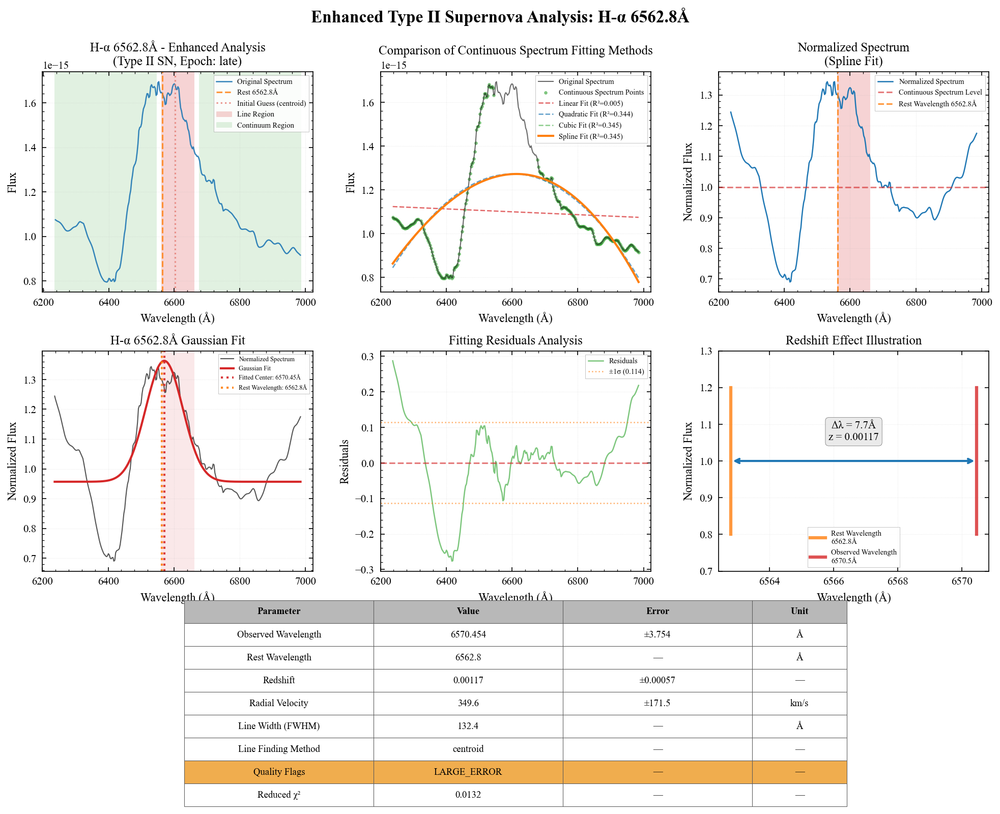



分析 H-β 线 (4861.3 Å)
注释: 早期吸收，晚期发射
观测时期: late, 预期线型: emission
H-β 4861.3Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 4861.3Å 自动设置增强分析区域...
  自适应分析范围: ±375.0Å
分析参数:
  谱线: H-β 4861.3Å (emission)
  观测时期: late
  预期红移: z = 0.0072 ± 0.0055
  分析范围: 4521.3-5271.3Å
  谱线区域: [(4851.30136, 4941.30136)]
  连续谱区域: [(4521.30136, 4836.30136), (4956.30136, 5271.30136)]
  预期线宽: 45.0Å
  找到 266 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.4777)

H-β 4861.3Å 谱线拟合:
  鲁棒线心查找: centroid 方法
  初始猜测: 中心=4888.88Å (centroid)
  线型=emission, 时期=late
  拟合成功！
  观测中心: 4881.350 ± 2.407Å
  红移: z = 0.00412 ± 0.00050
  径向速度: v = 1236.5 ± 148.4 km/s
  约化χ²: 0.0030
  线宽(FWHM): 98.9Å

⚠️  结果验证警告:
  - 红移误差较大: 相对误差 = 12.0%

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - H-β 4861.3Å
Observed Wavelength: 4881.350 ± 2.407 Å
Rest Wavelength: 4861.3 Å
Redshift: z = 0.00412 ± 0.00050
Radial Velocity: 1236.5 ± 148.4 km/s
Line Width (FWHM): 98.9 Å
Line Finding Method: centroid
Quality Flags: LARGE_ERROR
Analysis Quality: Needs Review


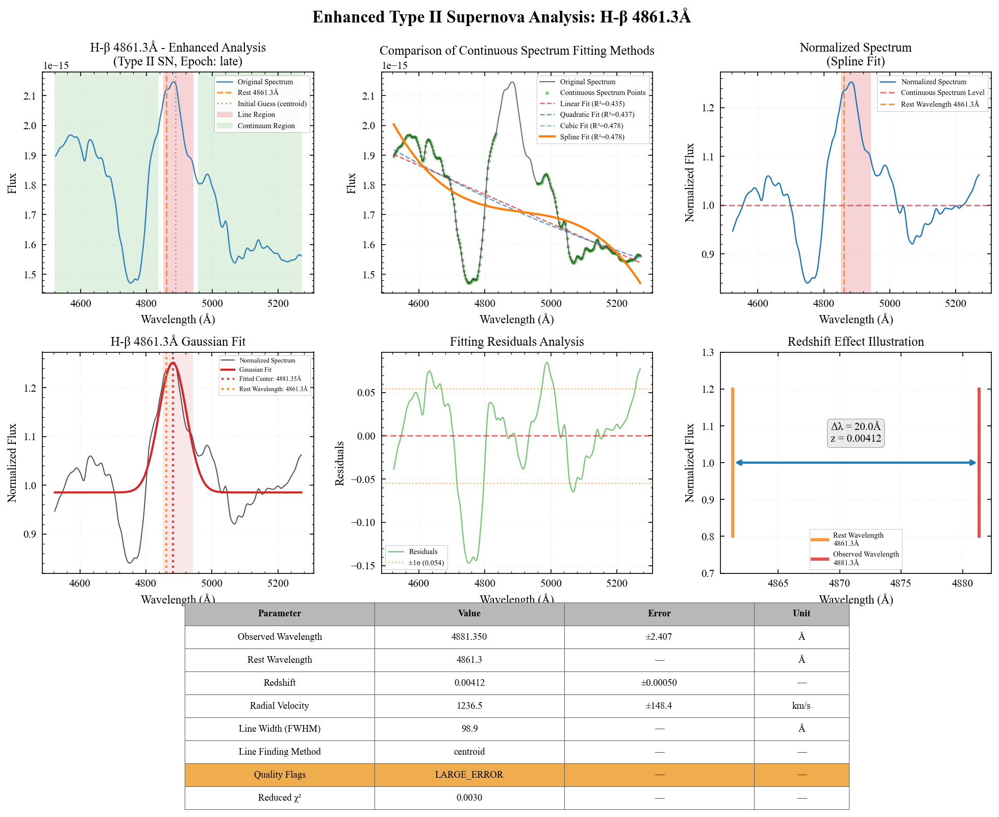



分析 Ca II K 线 (3933.7 Å)
注释: 早期强吸收，4000Å break的重要成分
观测时期: late, 预期线型: absorption
Ca II K 3933.7Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 3933.7Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Ca II K 3933.7Å (absorption)
  观测时期: late
  预期红移: z = 0.0072 ± 0.0055
  分析范围: 3712.0-4212.0Å
  谱线区域: [(3922.02264, 4002.02264)]
  连续谱区域: [(3712.02264, 3907.02264), (4017.02264, 4212.02264)]
  预期线宽: 40.0Å
  找到 100 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.6176)

Ca II K 3933.7Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=4000.61Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 4079.989 ± 9.079Å
  红移: z = 0.03719 ± 0.00231
  径向速度: v = 11148.9 ± 691.9 km/s
  约化χ²: 0.0022
  线宽(FWHM): 84.5Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Ca II K 3933.7Å
Observed Wavelength: 4079.989 ± 9.079 Å
Rest Wavelength: 3933.7 Å
Redshift: z = 0.03719 ± 0.00231
Radial Velocity: 11148.9 ± 691.9 km/s
Line Width (FWHM): 84.5 Å
Line Finding Method: min_simple
Quality Flags: GOOD
Analysis Quality: Needs Review


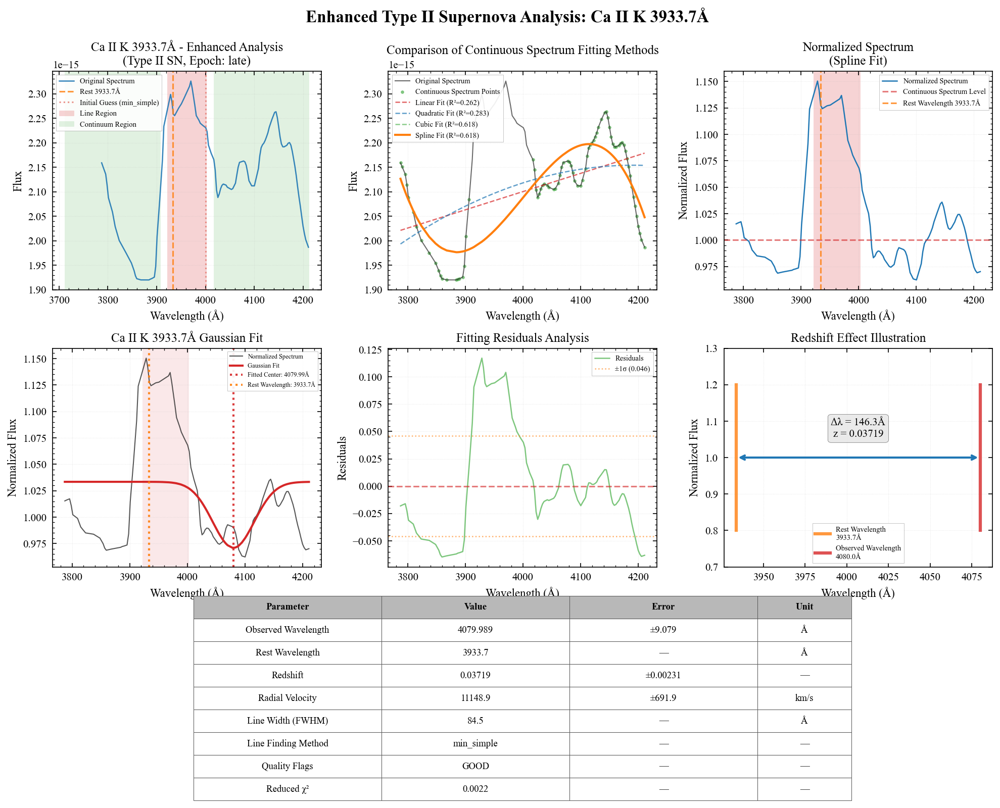



分析 Ca II H 线 (3968.5 Å)
注释: 早期强吸收，4000Å break的重要成分
观测时期: late, 预期线型: absorption
Ca II H 3968.5Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 3968.5Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Ca II H 3968.5Å (absorption)
  观测时期: late
  预期红移: z = 0.0072 ± 0.0055
  分析范围: 3747.1-4247.1Å
  谱线区域: [(3957.0732000000003, 4037.0732000000003)]
  连续谱区域: [(3747.0732000000003, 3942.0732000000003), (4052.0732000000003, 4247.073200000001)]
  预期线宽: 40.0Å
  找到 111 个数据点

连续谱拟合:
  自动选择: Cubic Fit (R²=0.5732)

Ca II H 3968.5Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=4028.29Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 4064.701 ± 6.545Å
  红移: z = 0.02424 ± 0.00165
  径向速度: v = 7267.3 ± 494.4 km/s
  约化χ²: 0.0014
  线宽(FWHM): 74.7Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Ca II H 3968.5Å
Observed Wavelength: 4064.701 ± 6.545 Å
Rest Wavelength: 3968.5 Å
Redshift: z = 0.02424 ± 0.00165
Radial Velocity: 7267.3 ± 494.4 km/s
Line Width (FWHM): 74.7 Å
Line Finding Method: min_simple
Quality Flags: GOOD

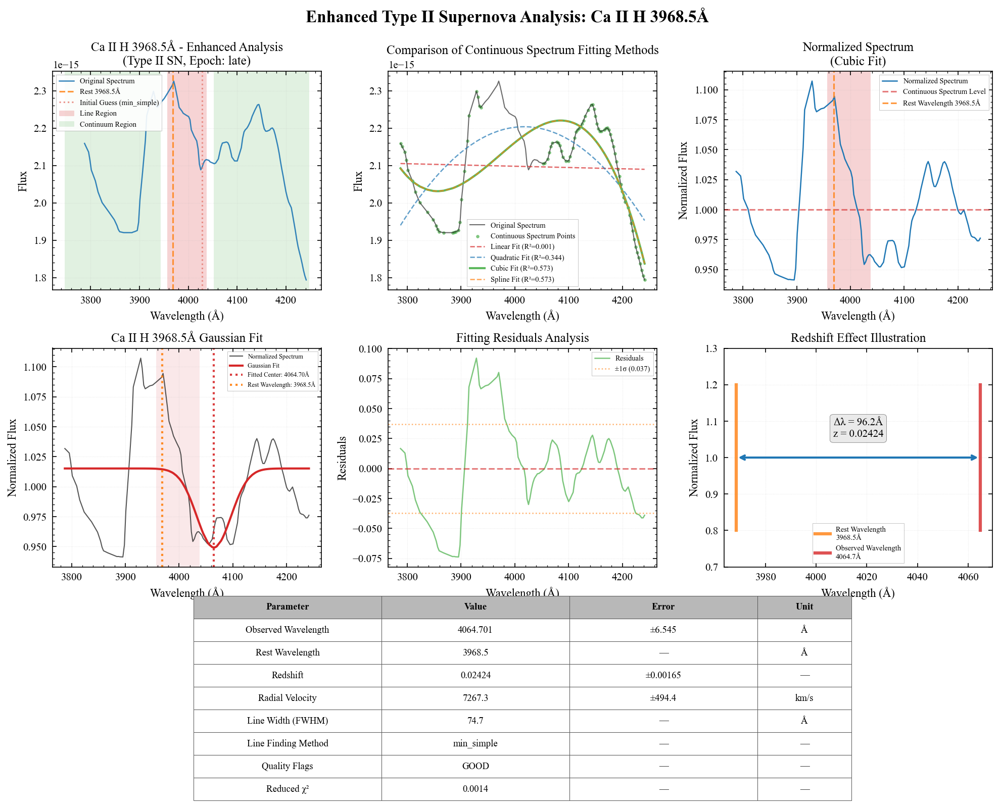



分析 Fe II 线 (5018.4 Å)
注释: Fe II复合体中最强线
观测时期: late, 预期线型: absorption
Fe II 5018.4Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 5018.4Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Fe II 5018.4Å (absorption)
  观测时期: late
  预期红移: z = 0.0072 ± 0.0055
  分析范围: 4804.5-5304.5Å
  谱线区域: [(5024.53248, 5084.53248)]
  连续谱区域: [(4804.53248, 5009.53248), (5099.53248, 5304.53248)]
  预期线宽: 30.0Å
  找到 178 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.9009)

Fe II 5018.4Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=5063.58Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 5061.178 ± 3.767Å
  红移: z = 0.00852 ± 0.00075
  径向速度: v = 2555.5 ± 225.1 km/s
  约化χ²: 0.0009
  线宽(FWHM): 78.6Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Fe II 5018.4Å
Observed Wavelength: 5061.178 ± 3.767 Å
Rest Wavelength: 5018.4 Å
Redshift: z = 0.00852 ± 0.00075
Radial Velocity: 2555.5 ± 225.1 km/s
Line Width (FWHM): 78.6 Å
Line Finding Method: min_simple
Quality Flags: GOOD
Analysis Quality: Good


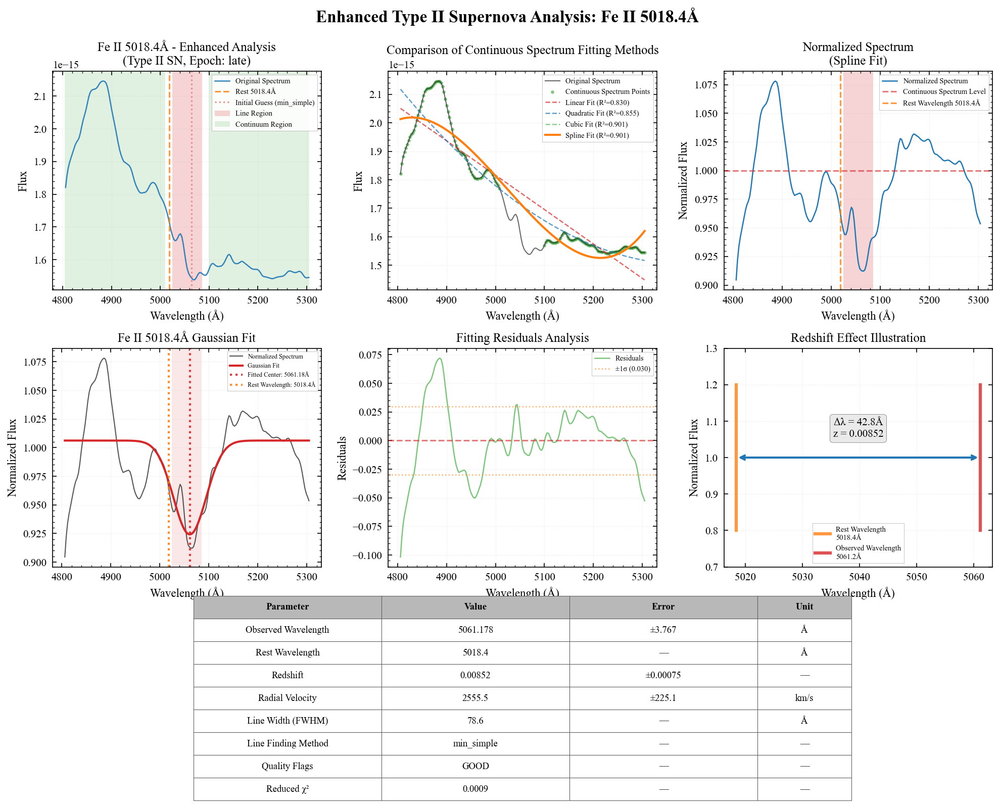


成功分析的谱线汇总:
       H-α: z =  0.00117 ± 0.00057  (相对误差: 49.04%)
       H-β: z =  0.00412 ± 0.00050  (相对误差: 12.01%)
   Ca II K: z =  0.03719 ± 0.00231  (相对误差: 6.21%)
   Ca II H: z =  0.02424 ± 0.00165  (相对误差: 6.80%)
     Fe II: z =  0.00852 ± 0.00075  (相对误差: 8.81%)

加权方法比较:
方法                   红移                 相对精度         径向速度 (km/s)         
----------------------------------------------------------------------
简单平均                 0.01505 ± 0.00610  40.51%      4511.6 ± 1827.8
绝对误差加权               0.00543 ± 0.00033  5.98%      1628.1 ± 97.4
相对误差加权               0.02401 ± 0.03840  159.94%      7198.2 ± 11512.4

详细权重分析 (相对误差加权):
--------------------------------------------------
       H-α: 相对误差=49.04%, 权重=4.16e+00, 贡献=0.6%
       H-β: 相对误差=12.01%, 权重=6.94e+01, 贡献=10.2%
   Ca II K: 相对误差=6.21%, 权重=2.60e+02, 贡献=38.3%
   Ca II H: 相对误差=6.80%, 权重=2.16e+02, 贡献=31.9%
     Fe II: 相对误差=8.81%, 权重=1.29e+02, 贡献=19.0%

最终结果 (相对误差加权):
加权平均红移:   z = 0.02401 ± 0.03840
径向速度:       v = 7198.2 ± 11512.

In [90]:
results = analyze_key_typeII_lines(wav_0424_clean, flux_0424_clean, 
                                   epoch='late',
                                    weighting_method='relative',
                                    expected_redshift=0.0072,
                                    redshift_uncertainty=0.0055)

#### May 19

Here, we use  $ z = 0.0056 \pm 0.0051 $.

=== Type II 超新星关键谱线分析 (Enhanced with Relative Error Weighting) ===


分析 H-α 线 (6562.8 Å)
注释: 早期吸收/P-Cygni，晚期强发射
观测时期: late, 预期线型: emission
H-α 6562.8Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 6562.8Å 自动设置增强分析区域...
  自适应分析范围: ±375.0Å
分析参数:
  谱线: H-α 6562.8Å (emission)
  观测时期: late
  预期红移: z = 0.0056 ± 0.0051
  分析范围: 6224.6-6974.6Å
  谱线区域: [(6549.5516800000005, 6649.5516800000005)]
  连续谱区域: [(6224.5516800000005, 6534.5516800000005), (6664.5516800000005, 6974.5516800000005)]
  预期线宽: 50.0Å
  找到 270 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.2501)

H-α 6562.8Å 谱线拟合:
  鲁棒线心查找: centroid 方法
  初始猜测: 中心=6594.64Å (centroid)
  线型=emission, 时期=late
  拟合成功！
  观测中心: 6584.556 ± 2.302Å
  红移: z = 0.00332 ± 0.00035
  径向速度: v = 993.8 ± 105.1 km/s
  约化χ²: 0.0223
  线宽(FWHM): 118.2Å

⚠️  结果验证警告:
  - 红移误差较大: 相对误差 = 10.6%

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - H-α 6562.8Å
Observed Wavelength: 6584.556 ± 2.302 Å
Rest Wavelength: 6562.8 Å
Redshift: z = 0.00332 ± 0.00035
Radial Velocity: 993.8 ± 105.1 km/s
Line 

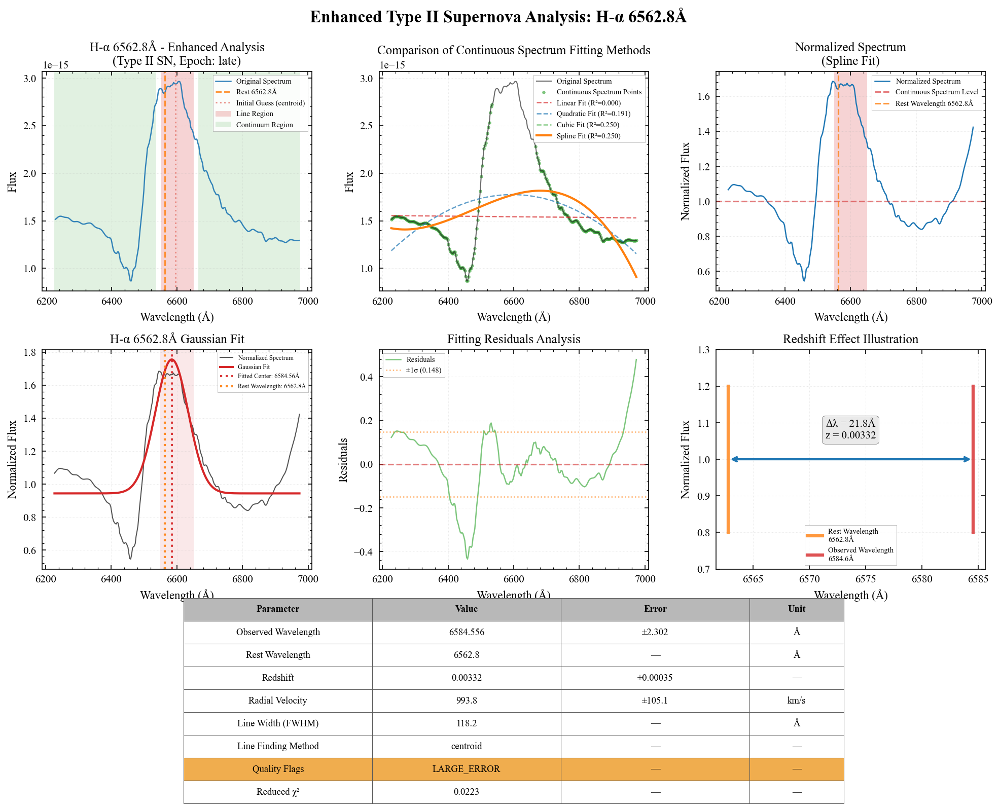



分析 H-β 线 (4861.3 Å)
注释: 早期吸收，晚期发射
观测时期: late, 预期线型: emission
H-β 4861.3Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 4861.3Å 自动设置增强分析区域...
  自适应分析范围: ±375.0Å
分析参数:
  谱线: H-β 4861.3Å (emission)
  观测时期: late
  预期红移: z = 0.0056 ± 0.0051
  分析范围: 4513.5-5263.5Å
  谱线区域: [(4843.52328, 4933.52328)]
  连续谱区域: [(4513.52328, 4828.52328), (4948.52328, 5263.52328)]
  预期线宽: 45.0Å
  找到 263 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.3191)

H-β 4861.3Å 谱线拟合:
  鲁棒线心查找: centroid 方法
  初始猜测: 中心=4893.65Å (centroid)
  线型=emission, 时期=late
  拟合成功！
  观测中心: 4903.423 ± 2.723Å
  红移: z = 0.00867 ± 0.00056
  径向速度: v = 2597.7 ± 167.9 km/s
  约化χ²: 0.0090
  线宽(FWHM): 89.2Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - H-β 4861.3Å
Observed Wavelength: 4903.423 ± 2.723 Å
Rest Wavelength: 4861.3 Å
Redshift: z = 0.00867 ± 0.00056
Radial Velocity: 2597.7 ± 167.9 km/s
Line Width (FWHM): 89.2 Å
Line Finding Method: centroid
Quality Flags: GOOD
Analysis Quality: Needs Review


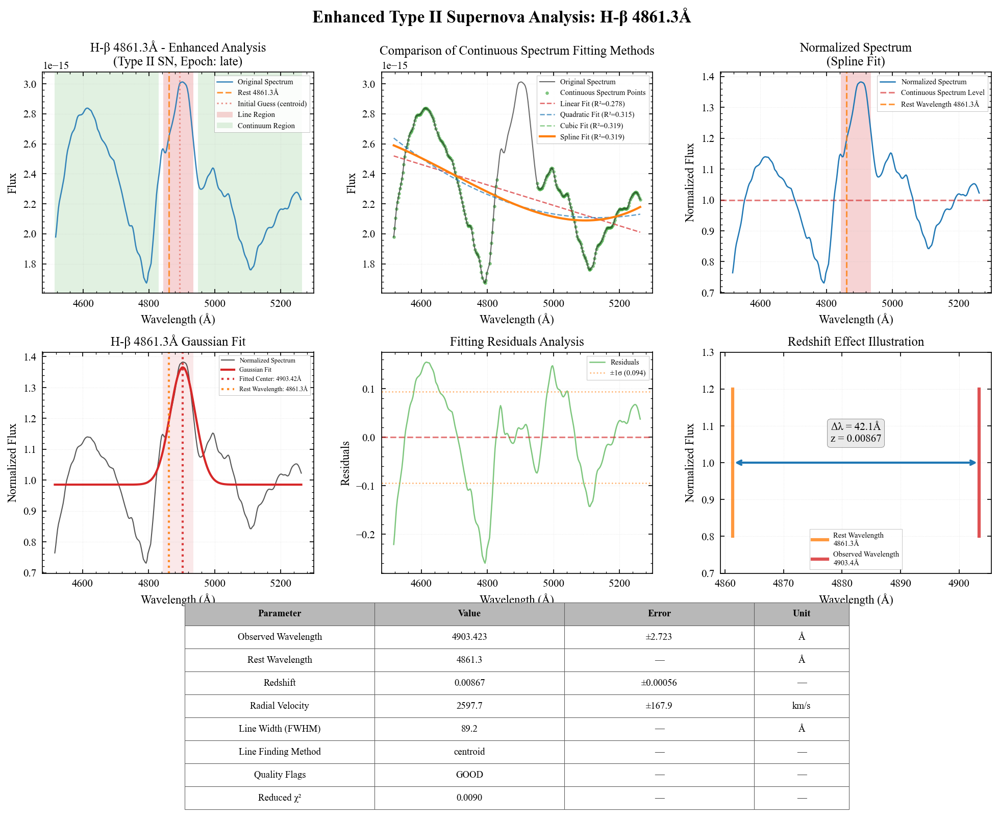



分析 Ca II K 线 (3933.7 Å)
注释: 早期强吸收，4000Å break的重要成分
观测时期: late, 预期线型: absorption
Ca II K 3933.7Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 3933.7Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Ca II K 3933.7Å (absorption)
  观测时期: late
  预期红移: z = 0.0056 ± 0.0051
  分析范围: 3705.7-4205.7Å
  谱线区域: [(3915.72872, 3995.72872)]
  连续谱区域: [(3705.72872, 3900.72872), (4010.72872, 4205.72872)]
  预期线宽: 40.0Å
  找到 106 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.7629)

Ca II K 3933.7Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=3916.32Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 3883.513 ± 4.048Å
  红移: z = -0.01276 ± 0.00103
  径向速度: v = -3824.8 ± 308.5 km/s
  约化χ²: 0.0117
  线宽(FWHM): 46.9Å

⚠️  结果验证警告:
  - 检测到显著蓝移: z = -0.01276

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Ca II K 3933.7Å
Observed Wavelength: 3883.513 ± 4.048 Å
Rest Wavelength: 3933.7 Å
Redshift: z = -0.01276 ± 0.00103
Radial Velocity: -3824.8 ± 308.5 km/s
Line Width (FWHM): 46.9 Å
Line Finding Method: min_simple
Quality Flags: BLUESHI

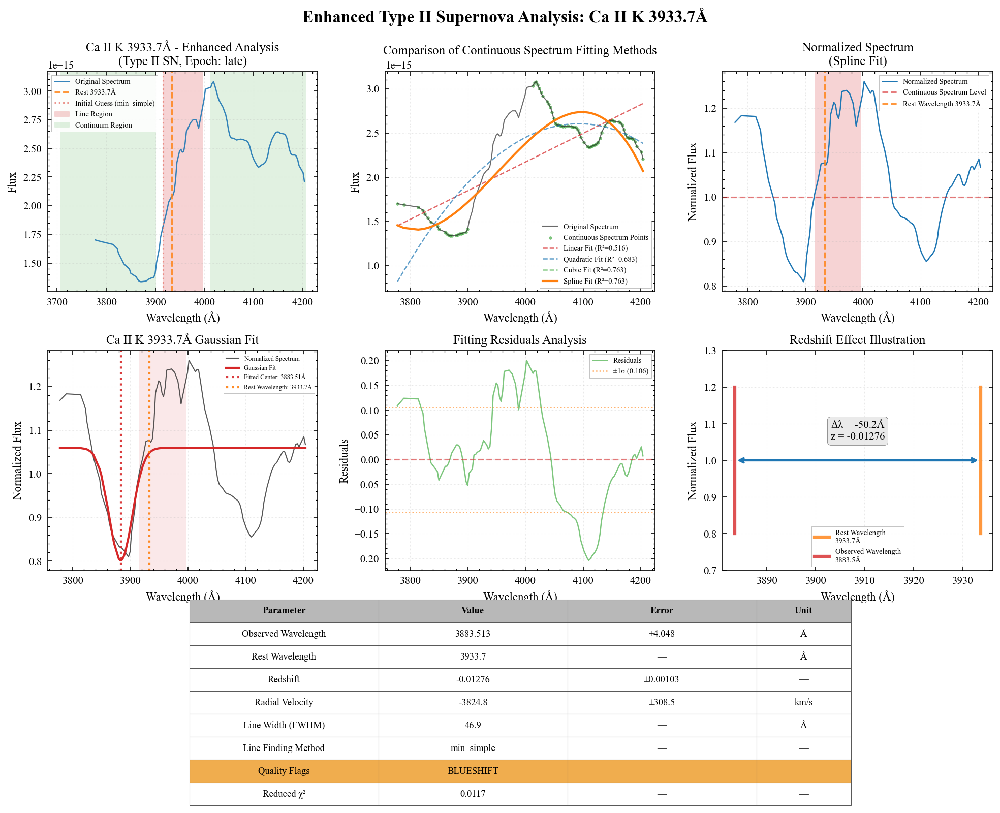



分析 Ca II H 线 (3968.5 Å)
注释: 早期强吸收，4000Å break的重要成分
观测时期: late, 预期线型: absorption
Ca II H 3968.5Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 3968.5Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Ca II H 3968.5Å (absorption)
  观测时期: late
  预期红移: z = 0.0056 ± 0.0051
  分析范围: 3740.7-4240.7Å
  谱线区域: [(3950.7236000000003, 4030.7236000000003)]
  连续谱区域: [(3740.7236000000003, 3935.7236000000003), (4045.7236000000003, 4240.7236)]
  预期线宽: 40.0Å
  找到 118 个数据点

连续谱拟合:
  自动选择: Cubic Fit (R²=0.8534)

Ca II H 3968.5Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=4029.65Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 4110.020 ± 6.877Å
  红移: z = 0.03566 ± 0.00173
  径向速度: v = 10690.9 ± 519.5 km/s
  约化χ²: 0.0151
  线宽(FWHM): 60.7Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Ca II H 3968.5Å
Observed Wavelength: 4110.020 ± 6.877 Å
Rest Wavelength: 3968.5 Å
Redshift: z = 0.03566 ± 0.00173
Radial Velocity: 10690.9 ± 519.5 km/s
Line Width (FWHM): 60.7 Å
Line Finding Method: min_simple
Quality Flags: GOOD
Analy

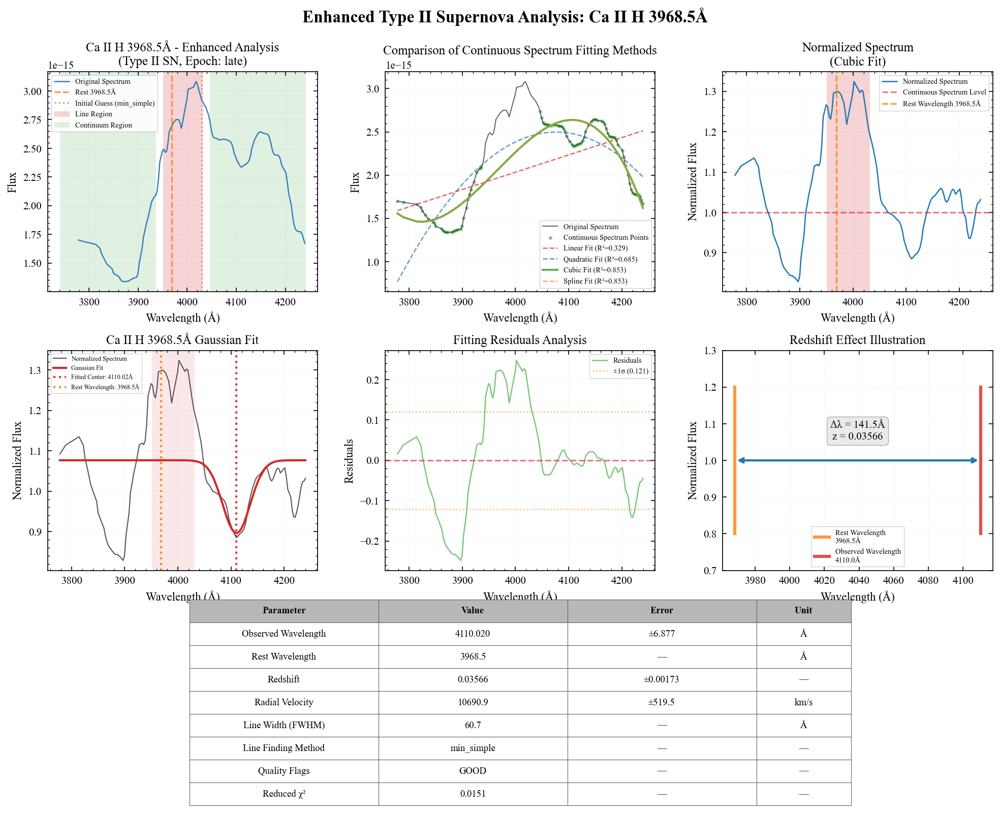



分析 Fe II 线 (5018.4 Å)
注释: Fe II复合体中最强线
观测时期: late, 预期线型: absorption
Fe II 5018.4Å 谱线红移分析 (Type II SN - Enhanced)
根据静止波长 5018.4Å 自动设置增强分析区域...
  自适应分析范围: ±250.0Å
分析参数:
  谱线: Fe II 5018.4Å (absorption)
  观测时期: late
  预期红移: z = 0.0056 ± 0.0051
  分析范围: 4796.5-5296.5Å
  谱线区域: [(5016.50304, 5076.50304)]
  连续谱区域: [(4796.50304, 5001.50304), (5091.50304, 5296.50304)]
  预期线宽: 30.0Å
  找到 177 个数据点

连续谱拟合:
  自动选择: Spline Fit (R²=0.6696)

Fe II 5018.4Å 谱线拟合:
  鲁棒线心查找: min_simple 方法
  初始猜测: 中心=5074.51Å (min_simple)
  线型=absorption, 时期=late
  拟合成功！
  观测中心: 5096.476 ± 4.747Å
  红移: z = 0.01556 ± 0.00095
  径向速度: v = 4664.2 ± 283.6 km/s
  约化χ²: 0.0049
  线宽(FWHM): 56.1Å

ENHANCED TYPE II SUPERNOVA REDSHIFT ANALYSIS - Fe II 5018.4Å
Observed Wavelength: 5096.476 ± 4.747 Å
Rest Wavelength: 5018.4 Å
Redshift: z = 0.01556 ± 0.00095
Radial Velocity: 4664.2 ± 283.6 km/s
Line Width (FWHM): 56.1 Å
Line Finding Method: min_simple
Quality Flags: GOOD
Analysis Quality: Needs Review


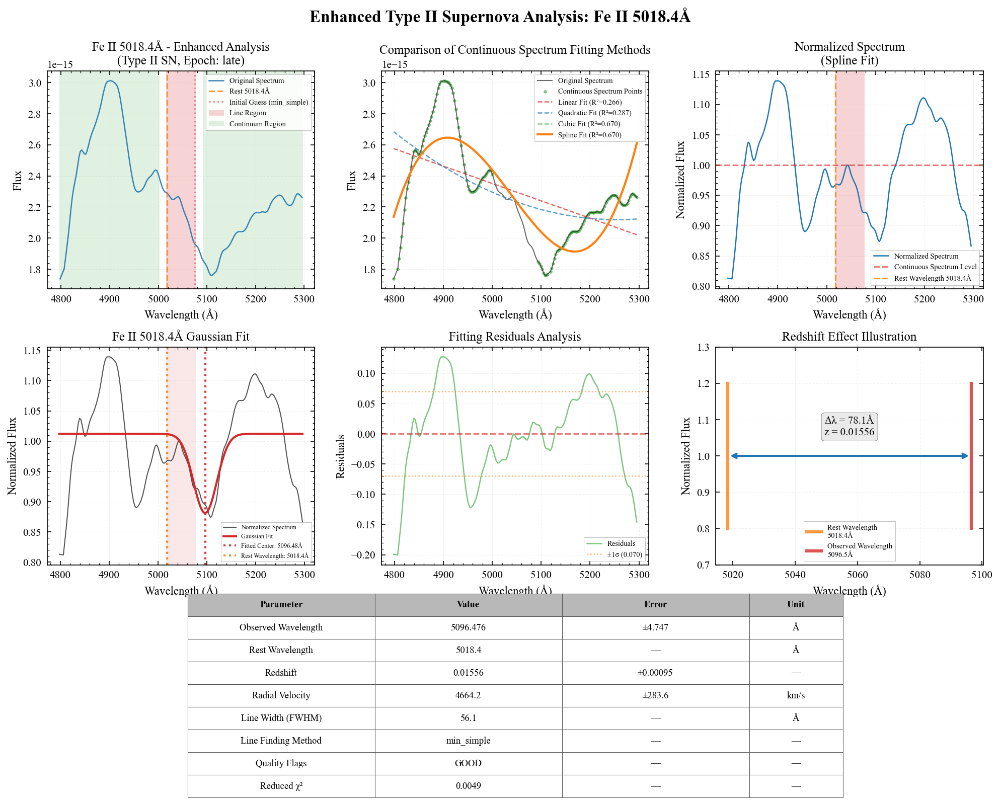


成功分析的谱线汇总:
       H-α: z =  0.00332 ± 0.00035  (相对误差: 10.58%)
       H-β: z =  0.00867 ± 0.00056  (相对误差: 6.46%)
   Ca II K: z = -0.01276 ± 0.00103  (相对误差: 8.07%)
   Ca II H: z =  0.03566 ± 0.00173  (相对误差: 4.86%)
     Fe II: z =  0.01556 ± 0.00095  (相对误差: 6.08%)

加权方法比较:
方法                   红移                 相对精度         径向速度 (km/s)         
----------------------------------------------------------------------
简单平均                 0.01009 ± 0.00708  70.20%      3024.4 ± 2123.0
绝对误差加权               0.00523 ± 0.00027  5.16%      1569.3 ± 81.0
相对误差加权               0.01676 ± 0.02916  173.94%      5025.1 ± 8740.7

详细权重分析 (相对误差加权):
--------------------------------------------------
       H-α: 相对误差=10.58%, 权重=8.94e+01, 贡献=7.6%
       H-β: 相对误差=6.46%, 权重=2.39e+02, 贡献=20.3%
   Ca II K: 相对误差=8.07%, 权重=1.54e+02, 贡献=13.1%
   Ca II H: 相对误差=4.86%, 权重=4.23e+02, 贡献=36.0%
     Fe II: 相对误差=6.08%, 权重=2.70e+02, 贡献=23.0%

最终结果 (相对误差加权):
加权平均红移:   z = 0.01676 ± 0.02916
径向速度:       v = 5025.1 ± 8740.7 km

In [91]:
results = analyze_key_typeII_lines(wav_0519_clean, flux_0519_clean, 
                                   epoch='late',
                                    weighting_method='relative',
                                    expected_redshift=0.0056,
                                    redshift_uncertainty=0.0051)

#### Redshift Conclusions

As we can see from the fitting and measurement results above, the version using absolute error weighting yields better performance, which may be due to the similarity in magnitude of the redshift measurements; using relative error as weights, on the contrary, leads to distortion.

Below, we compare the redshift measurement data from April 24 and May 19:
$$ z_{1a}=0.00543 \pm 0.00033, \quad z_{1r}=0.02401 \pm 0.03840 $$
$$ z_{2a}=0.00523 \pm 0.00027, \quad z_{2r}=0.01676 \pm 0.02916 $$
It can be observed that regardless of the weighting method applied, the values of $z_1$ are consistently greater than those of $z_2$, which aligns with the previous hypothesis of a later-stage deceleration in the gas flow velocity.

The Ca II K Anomaly is Key: The flip of Ca II K from highly redshifted to blueshifted is a major indicator of change in the ejecta, possibly related to cooling or changes in the dominant absorption/emission components.Certainly, this may also be caused by errors in the observational data itself; therefore, further analysis of this spectral line is required.
